# Problem Statement


`To build a forecasting model to forecast the daily sales for the next six weeks.`

<br>
Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores.

## 1. Importing Libraries

In [1]:
# Loading Google drive
from google.colab import drive
drive.mount('/content/gdrive')

# Importing Library
import numpy as np
import pandas as pd
from datetime import date
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')

from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from scipy.stats import boxcox

from pylab import rcParams
import statsmodels.api as sm

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.vector_ar.vecm import coint_johansen

Mounted at /content/gdrive


## 2. Loading Dataset

In [2]:
# Using Pandas
# data of individual stores at a daily level 
data_orignal = pd.read_csv(r'/content/gdrive/My Drive/Time_Series/train.csv', encoding='palmos')
# metadata for single store
store_metadata_orignal = pd.read_csv(r'/content/gdrive/My Drive/Time_Series/store.csv', encoding='palmos')

### 2.1 Checking info

In [3]:
# info and shape of data
print("Shape of Dataset is : {0}\n".format(data_orignal.shape))
data_orignal.info()

Shape of Dataset is : (1017209, 9)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


In [4]:
# info and shape of metadata
print("Shape of Metadataset is : {0}\n".format(store_metadata_orignal.shape))
store_metadata_orignal.info()

Shape of Metadataset is : (1115, 10)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1112 non-null   float64
 4   CompetitionOpenSinceMonth  761 non-null    float64
 5   CompetitionOpenSinceYear   761 non-null    float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            571 non-null    float64
 8   Promo2SinceYear            571 non-null    float64
 9   PromoInterval              571 non-null    object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [5]:
# Checking head of data
data_orignal.head(10)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1
5,6,5,2015-07-31,5651,589,1,1,0,1
6,7,5,2015-07-31,15344,1414,1,1,0,1
7,8,5,2015-07-31,8492,833,1,1,0,1
8,9,5,2015-07-31,8565,687,1,1,0,1
9,10,5,2015-07-31,7185,681,1,1,0,1


In [6]:
# Checking head of metadata
store_metadata_orignal.head(10)

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN
5,6,a,a,310.0,12.0,2013.0,0,NaN,NaN,NaN
6,7,a,c,24000.0,4.0,2013.0,0,NaN,NaN,NaN
7,8,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
8,9,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
9,10,a,a,3160.0,9.0,2009.0,0,NaN,NaN,NaN


### 2.2 Creating Dataset only for 9 Stores
Stores = [1,3,8,9,13,25,29,31 and 46]

In [7]:
# Store Number
store_number = [1,3,8,9,13,25,29,31,46]
# Copying dataset
train_1 = data_orignal.copy() 
# Taking data only for above 9 store
train_1 = train_1[train_1["Store"].isin(store_number)]
# Sorting by store and Date
train_1.sort_values(by=['Store', 'Date'], inplace=True)
# Resetting index
train_1.reset_index(drop=True, inplace=True)
# Checking head
train_1.head(21)

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,2,2013-01-01,0,0,0,0,a,1
1,1,3,2013-01-02,5530,668,1,0,0,1
2,1,4,2013-01-03,4327,578,1,0,0,1
3,1,5,2013-01-04,4486,619,1,0,0,1
4,1,6,2013-01-05,4997,635,1,0,0,1
5,1,7,2013-01-06,0,0,0,0,0,1
6,1,1,2013-01-07,7176,785,1,1,0,1
7,1,2,2013-01-08,5580,654,1,1,0,1
8,1,3,2013-01-09,5471,626,1,1,0,1
9,1,4,2013-01-10,4892,615,1,1,0,1


#### Inspecting Dataset for different Store

In [8]:
# For Store = 1
for i in store_number:
    x = train_1[train_1["Store"] == i]
    print(x.head(21))

    Store  DayOfWeek        Date  ...  Promo  StateHoliday  SchoolHoliday
0       1          2  2013-01-01  ...      0             a              1
1       1          3  2013-01-02  ...      0             0              1
2       1          4  2013-01-03  ...      0             0              1
3       1          5  2013-01-04  ...      0             0              1
4       1          6  2013-01-05  ...      0             0              1
5       1          7  2013-01-06  ...      0             0              1
6       1          1  2013-01-07  ...      1             0              1
7       1          2  2013-01-08  ...      1             0              1
8       1          3  2013-01-09  ...      1             0              1
9       1          4  2013-01-10  ...      1             0              1
10      1          5  2013-01-11  ...      1             0              1
11      1          6  2013-01-12  ...      0             0              0
12      1          7  2013-01-13  ... 

##### Observation
- At every Sunday Store is Closed; Hence Sale is 0.

In [9]:
# Dropping row when shop is closed or sales is 0.
train_1 = train_1[train_1["Sales"] != 0]

In [10]:
# Checking row with sales value as 0
train_1[train_1["Sales"] == 0]

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday


## 3. Explore Data Analysis

### 3.1 Checking missing value

In [11]:
train_1.isnull().sum(axis=0)

Store            0
DayOfWeek        0
Date             0
Sales            0
Customers        0
Open             0
Promo            0
StateHoliday     0
SchoolHoliday    0
dtype: int64

###### Conclusion: 
There is no Null value in <b>store_dataset</b>.

#### Grouping dataset 

In [12]:
store_df = []
# for each store number
for i in store_number:
    store_df.append(train_1[train_1["Store"] == i])

for df in store_df:
    df["Date"] = pd.date_range(start='2013-01-01', periods=len(df), freq='D')
    df.drop(columns="Open", inplace=True)

for df in store_df:
    print(df.head(10))

    Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
1       1          3 2013-01-01  ...      0             0              1
2       1          4 2013-01-02  ...      0             0              1
3       1          5 2013-01-03  ...      0             0              1
4       1          6 2013-01-04  ...      0             0              1
6       1          1 2013-01-05  ...      1             0              1
7       1          2 2013-01-06  ...      1             0              1
8       1          3 2013-01-07  ...      1             0              1
9       1          4 2013-01-08  ...      1             0              1
10      1          5 2013-01-09  ...      1             0              1
11      1          6 2013-01-10  ...      0             0              0

[10 rows x 8 columns]
     Store  DayOfWeek       Date  ...  Promo  StateHoliday  SchoolHoliday
943      3          3 2013-01-01  ...      0             0              1
944      3          4 2013

In [13]:
# Creating Store Time Serise Data Frame
store_tsdf = []
for i in range(len(store_df)):
    store_df[i]["Date"] = pd.to_datetime(store_df[i]["Date"], format="%Y-%m-%d")
    store_tsdf.append(pd.DataFrame(store_df[i][["Date", "Store", "Sales","Customers", "DayOfWeek","Promo", "SchoolHoliday", "StateHoliday"]]).set_index("Date"))

store_tsdf[0].head()

,Store,Sales,Customers,DayOfWeek,Promo,SchoolHoliday,StateHoliday
Date,,,,,,,
2013-01-01,1,5530,668,3,0,1,0
2013-01-02,1,4327,578,4,0,1,0
2013-01-03,1,4486,619,5,0,1,0
2013-01-04,1,4997,635,6,0,1,0
2013-01-05,1,7176,785,1,1,1,0


In [14]:
# Copying orignal dataset
store_train_1 = store_metadata_orignal.copy()
store_train_1.isnull().sum(axis=0)

Store                          0
StoreType                      0
Assortment                     0
CompetitionDistance            3
CompetitionOpenSinceMonth    354
CompetitionOpenSinceYear     354
Promo2                         0
Promo2SinceWeek              544
Promo2SinceYear              544
PromoInterval                544
dtype: int64

###### Conclusion: 
There is Null value in <b>meta_dataset</b>.

##### Observation
Filling Competition Distance, Competition Open Since Month, Competition Open SinceYear with 0.0

In [15]:
# Filling null value with 0 for column : CompetitionDistance, CompetitionOpenSinceMonth, CompetitionOpenSinceYear

mis_col_1 = ['CompetitionDistance', 'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear']
for i in range(len(mis_col_1)):
    store_train_1[mis_col_1[i]].fillna(0.0, inplace=True)

In [16]:
store_train_1[store_train_1["Promo2SinceWeek"].isnull()]["Promo2"].sum()

0

###### Observation
When `Promo2` having value 0 then `Promo2SinceWeek`, `Promo2SinceYear` and `Promo2SinceYear` having missing value.
<br>
Hence applying 0 in place of missing value

In [17]:
mis_col_2 = ['Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval']
for i in range(len(mis_col_2)):
    store_train_1[mis_col_2[i]].fillna(0, inplace=True)

In [18]:
# Checking again missing value
store_train_1.isnull().sum(axis=0)

Store                        0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [19]:
# Checking info
store_train_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1115 non-null   float64
 4   CompetitionOpenSinceMonth  1115 non-null   float64
 5   CompetitionOpenSinceYear   1115 non-null   float64
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            1115 non-null   float64
 8   Promo2SinceYear            1115 non-null   float64
 9   PromoInterval              1115 non-null   object 
dtypes: float64(5), int64(2), object(3)
memory usage: 87.2+ KB


In [20]:
# Converting column into integer
int_col = ["CompetitionOpenSinceMonth", "CompetitionOpenSinceYear", "Promo2SinceWeek", "Promo2SinceYear"]
for i in int_col:
    store_train_1[i] = store_train_1[i].astype('int64')

# Checking info again
store_train_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1115 entries, 0 to 1114
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Store                      1115 non-null   int64  
 1   StoreType                  1115 non-null   object 
 2   Assortment                 1115 non-null   object 
 3   CompetitionDistance        1115 non-null   float64
 4   CompetitionOpenSinceMonth  1115 non-null   int64  
 5   CompetitionOpenSinceYear   1115 non-null   int64  
 6   Promo2                     1115 non-null   int64  
 7   Promo2SinceWeek            1115 non-null   int64  
 8   Promo2SinceYear            1115 non-null   int64  
 9   PromoInterval              1115 non-null   object 
dtypes: float64(1), int64(6), object(3)
memory usage: 87.2+ KB


### 3.2 Data Visualization

##### Univaraite Analysis

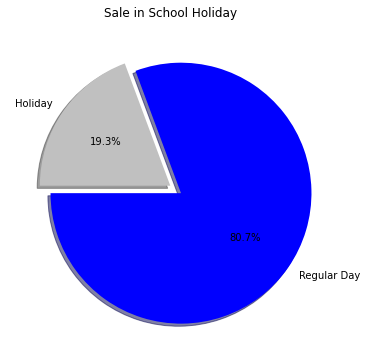

In [21]:
# Plotting pie chart
plt.figure(figsize=(12,6)) 
plt.pie(train_1["SchoolHoliday"].value_counts(), explode=(0.1,0.0), labels=["Regular Day", "Holiday"], colors=["blue", "silver"],
        autopct='%1.1f%%', shadow=True, startangle=180)
plt.title("Sale in School Holiday")
plt.show()

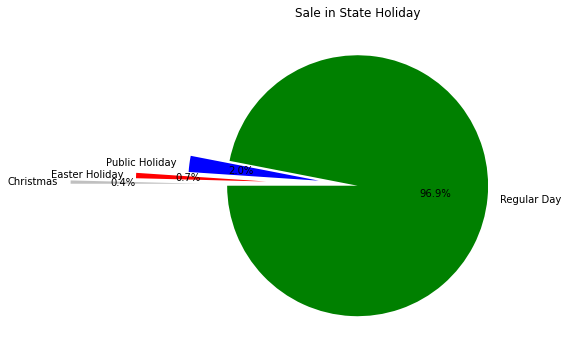

In [22]:
# Plotting pie chart
data_orignal["StateHoliday"] = data_orignal["StateHoliday"].astype('str') 

plt.figure(figsize=(12,6)) 
plt.pie(data_orignal["StateHoliday"].value_counts(), explode=(0.0,0.3,0.7,1.2), labels=["Regular Day", "Public Holiday", "Easter Holiday", "Christmas"], colors=["green", "blue", "red", "silver"],
        autopct='%1.1f%%', shadow=False, startangle=180)
plt.title("Sale in State Holiday")
plt.show()

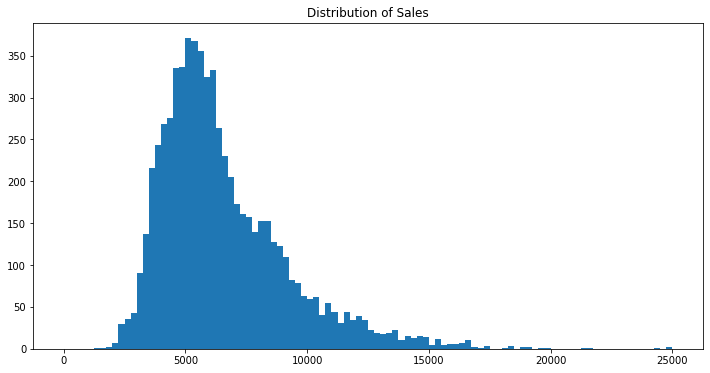

In [23]:
# Plotting distribution plot
plt.figure(figsize=(12,6))
plt.hist(train_1["Sales"], bins=100, range= (0,25000))
plt.title("Distribution of Sales")
plt.show()

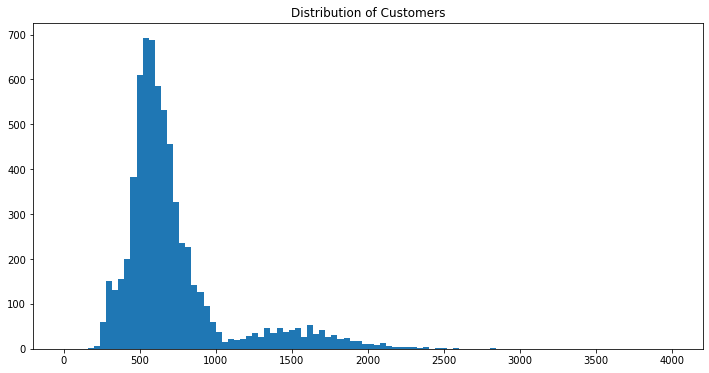

In [24]:
# Plotting distribution plot
plt.figure(figsize=(12,6))
plt.hist(train_1["Customers"], bins=100, range=(0,4000))
plt.title("Distribution of Customers")
plt.show()

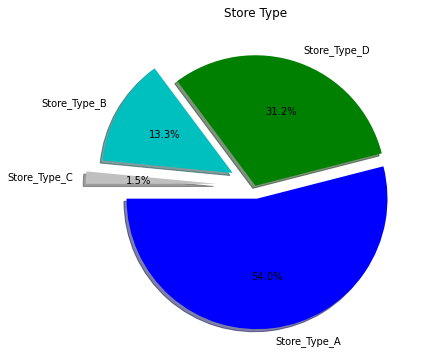

In [25]:
# Plotting pie chart

plt.figure(figsize=(24,6)) 
plt.pie(store_train_1["StoreType"].value_counts(), explode=(0.1,0.0, 0.2, 0.3), labels=["Store_Type_A", "Store_Type_D","Store_Type_B", "Store_Type_C"], colors=["b", "g","c","silver"],
        autopct='%1.1f%%', shadow=True, startangle=180)
plt.title("Store Type")
plt.show()

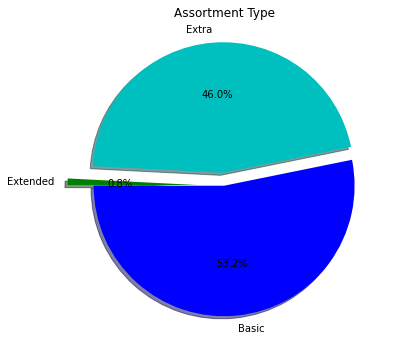

In [26]:
# Plotting pie chart
plt.figure(figsize=(12,6)) 
plt.pie(store_train_1["Assortment"].value_counts(), explode=(0.0, 0.1, 0.2), labels=["Basic","Extra", "Extended"], colors=["b", "c", "g"],
        autopct='%1.1f%%', shadow=True, startangle=180)
plt.title("Assortment Type")
plt.show()

##### Bivariate Analysis

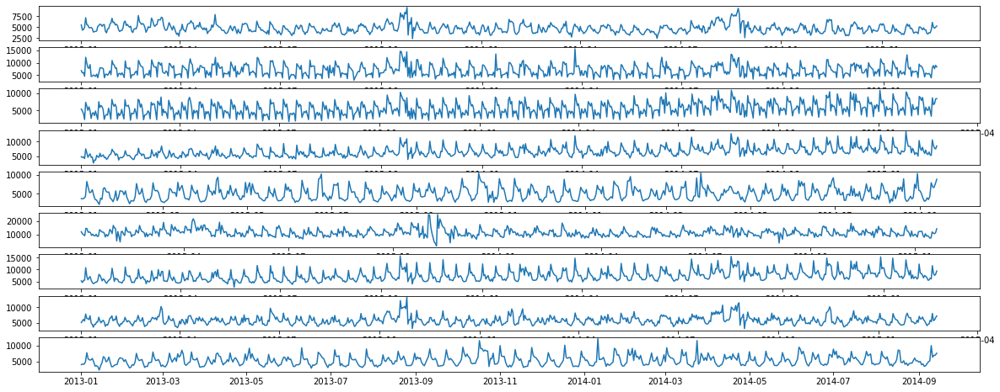

In [27]:
# Plotting graph for sales
plt.figure(figsize=(20,8))
plt.xlabel("Date")
plt.ylabel("Sales")
for i in range(9):
    plt.subplot(9,1,i+1)
    plt.plot(store_tsdf[i]["Sales"])
plt.show()

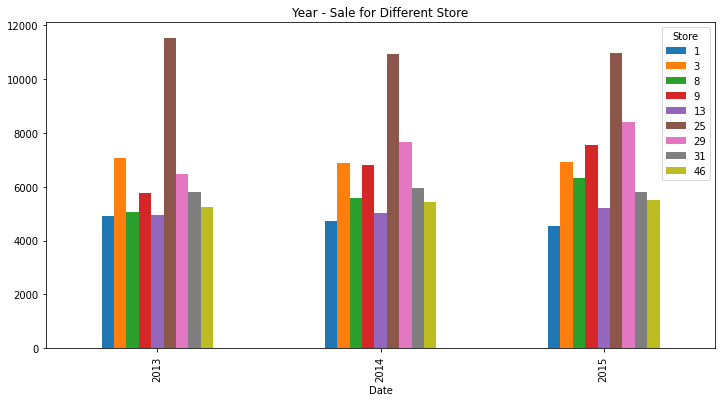

In [28]:
# Year wise sale for different store
train_2 = train_1.copy()
train_2["Date"] = pd.to_datetime(train_2["Date"], format="%Y-%m-%d")
train_2.set_index("Date", inplace=True)
table_1 = pd.pivot_table(train_2, values="Sales", index=train_2.index.year, columns=train_2.Store)
table_1.plot(kind='bar', figsize=(12,6), title="Year - Sale for Different Store")

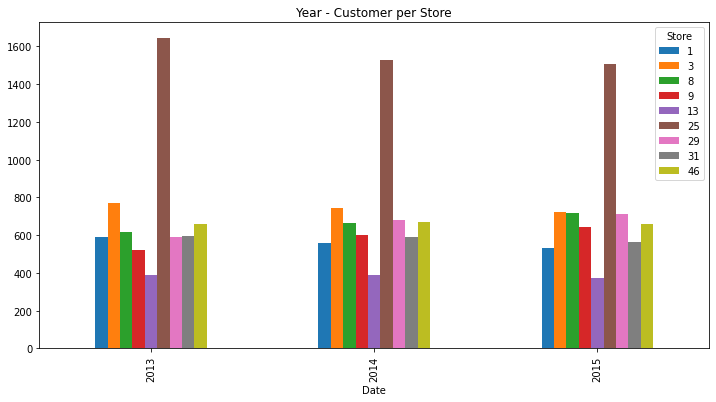

In [29]:
table_1 = pd.pivot_table(train_2, values="Customers", index=train_2.index.year, columns=train_2.Store)
table_1.plot(kind='bar', figsize=(12,6), title="Year - Customer per Store")

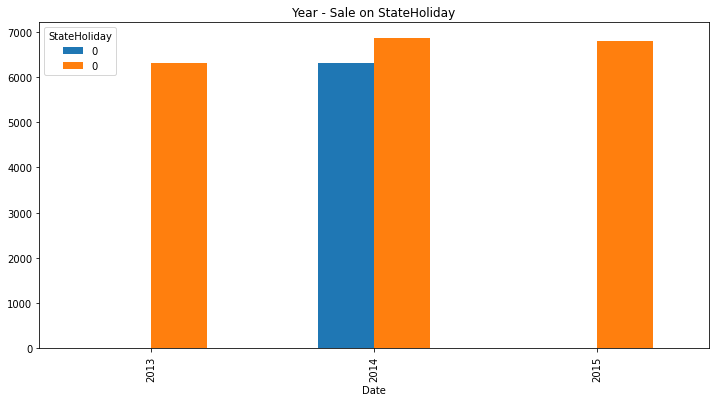

In [30]:
table_1 = pd.pivot_table(train_2, values="Sales", index=train_2.index.year, columns=train_2.StateHoliday)
table_1.plot(kind='bar', figsize=(12,6), title="Year - Sale on StateHoliday")

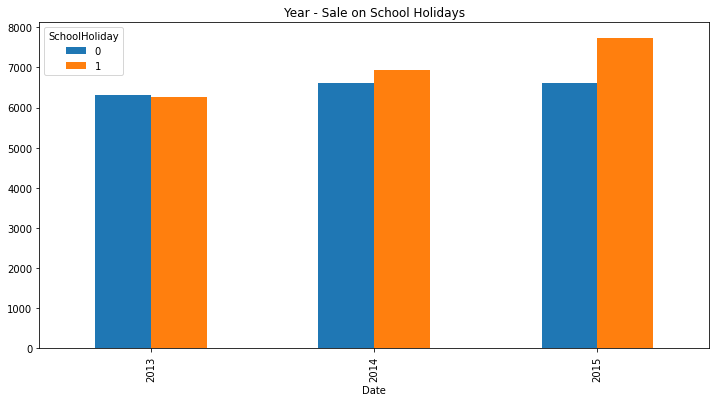

In [31]:
table_1 = pd.pivot_table(train_2, values="Sales", index=train_2.index.year, columns=train_2.SchoolHoliday)
table_1.plot(kind='bar', figsize=(12,6), title="Year - Sale on School Holidays")

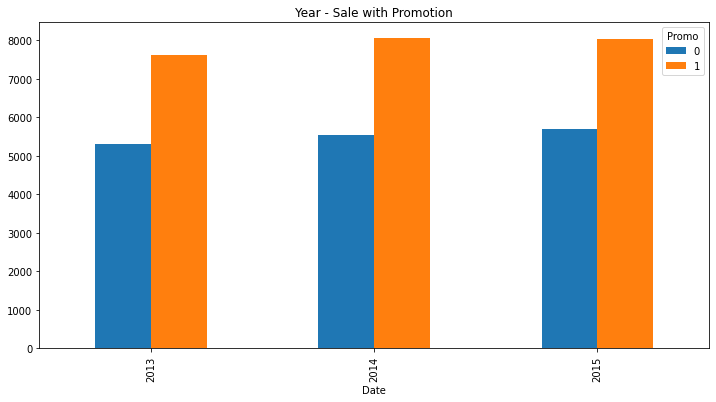

In [32]:
table_1 = pd.pivot_table(train_2, values="Sales", index=train_2.index.year, columns=train_2.Promo)
table_1.plot(kind='bar', figsize=(12,6), title="Year - Sale with Promotion")

In [33]:
# merge two dataframe 
merged_df = pd.merge(data_orignal,store_train_1, on = 'Store', how = 'inner')
merged_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9,2008,0,0,0,0
1,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9,2008,0,0,0,0
2,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9,2008,0,0,0,0
3,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9,2008,0,0,0,0
4,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9,2008,0,0,0,0


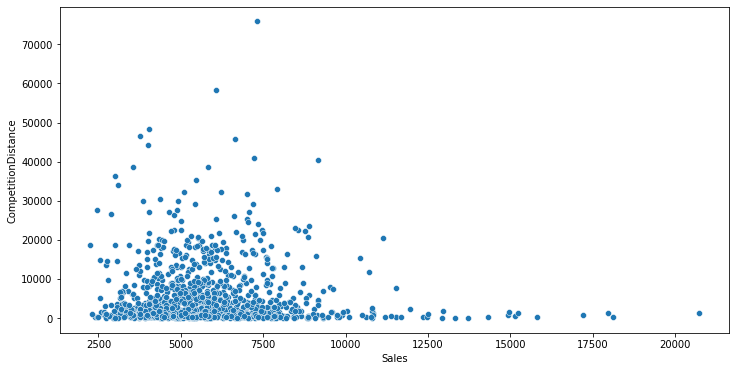

In [34]:
# Plotting graph sales and Competition Distance
vis_df_1 = merged_df.groupby("Store")[["Sales","CompetitionDistance"]].mean()
plt.figure(figsize=(12,6))
sns.scatterplot(vis_df_1["Sales"], vis_df_1["CompetitionDistance"])
plt.show()

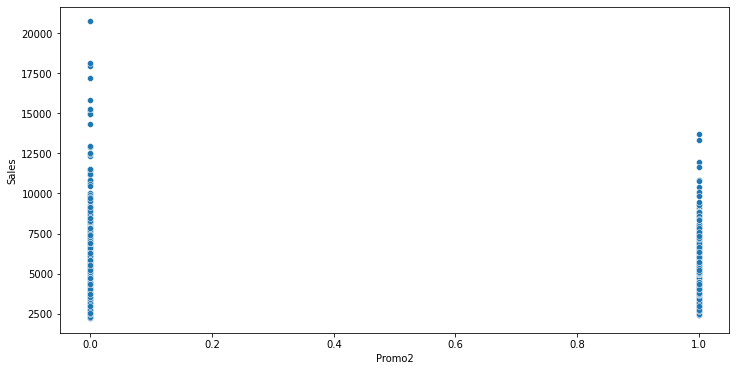

In [35]:
# Plotting graph sales and Promotion
vis_df_1 = merged_df.groupby("Store")[["Sales","Promo2"]].mean()
plt.figure(figsize=(12,6))
sns.scatterplot(vis_df_1["Promo2"], vis_df_1["Sales"])
plt.show()

##### Multivariate Analysis

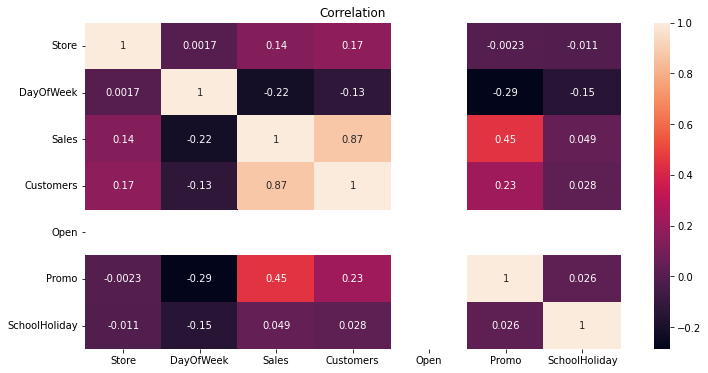

In [36]:
# Heat map
plt.figure(figsize=(12,6))
fig_1 = sns.heatmap(train_1.corr(),annot=True)
plt.title("Correlation")
fig_1

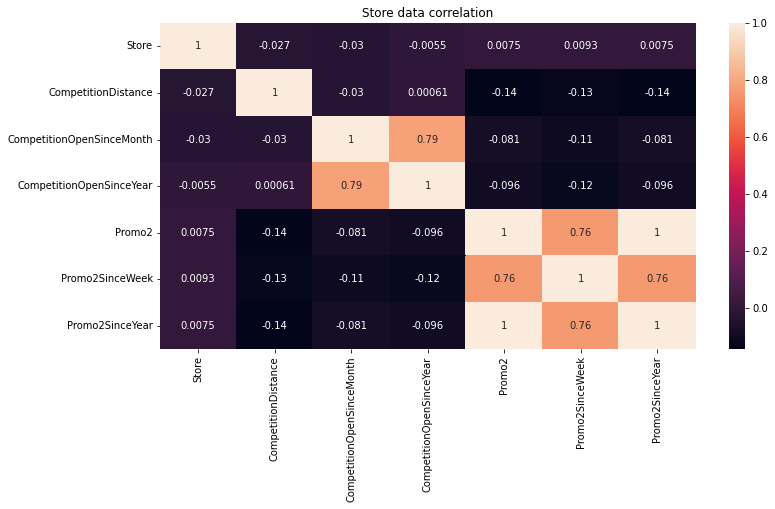

In [37]:
# Heat map
plt.figure(figsize=(12,6))
fig_1 = sns.heatmap(store_train_1.corr(),annot=True)
plt.title("Store data correlation")
fig_1

### 3.3 Dealing with Outliers

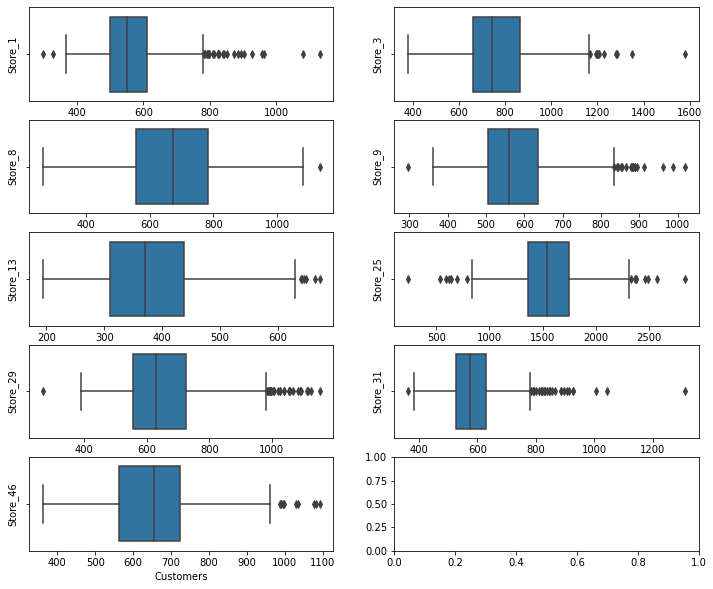

In [38]:
# Plotting boxplot
fig, ax = plt.subplots(figsize = (12,10), nrows= 5, ncols = 2)
for i,j in enumerate(store_number):
    ax[np.floor(i/2).astype('int')][i%2].set_ylabel("Store_"+str(j))
    sns.boxplot(x=store_tsdf[i]["Customers"], whis=1.5, ax = ax[np.floor(i/2).astype('int')][i%2])
plt.show()

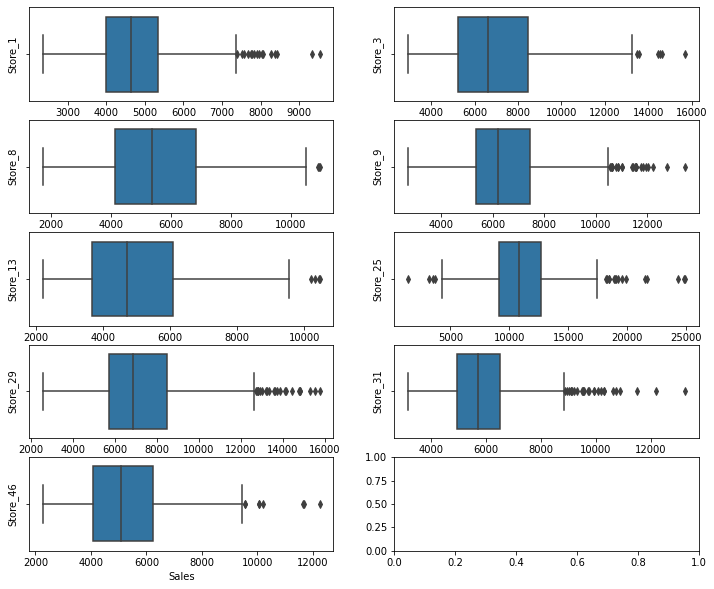

In [39]:
# Plotting boxplot
fig, ax = plt.subplots(figsize = (12,10), nrows= 5, ncols = 2)
for i,j in enumerate(store_number):
    ax[np.floor(i/2).astype('int')][i%2].set_ylabel("Store_"+str(j))
    sns.boxplot(x=store_tsdf[i]["Sales"], whis=1.5, ax = ax[np.floor(i/2).astype('int')][i%2])
plt.show()

In [40]:
# Capping outlier with 99th percentile in Sales
for i in range(9):
    store_tsdf[i].loc[store_tsdf[i]["Sales"]>store_tsdf[i]["Sales"].quantile(0.99),"Sales"] = store_tsdf[i]["Sales"].quantile(0.99)

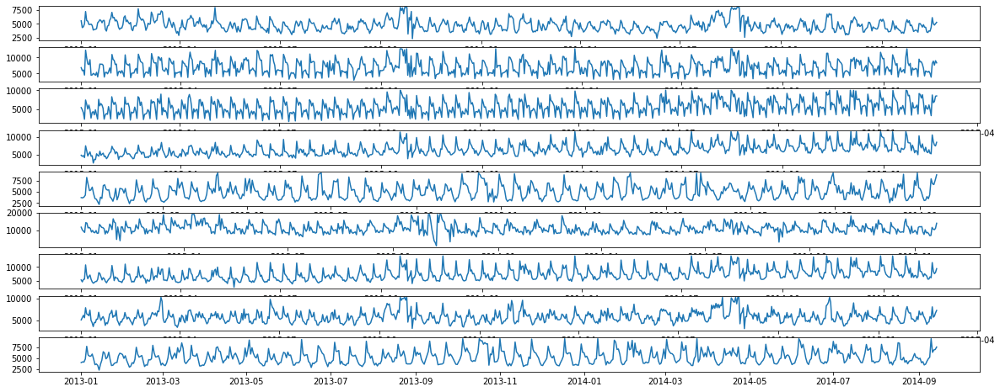

In [41]:
# Agian Plotting Graph

plt.figure(figsize=(20,8))
plt.xlabel("Date")
plt.ylabel("Sales")
for i in range(9):
    plt.subplot(9,1,i+1)
    plt.plot(store_tsdf[i]["Sales"])
plt.show()

### 3.4 Store wise analysis

#### Store 1

<Figure size 1440x432 with 0 Axes>

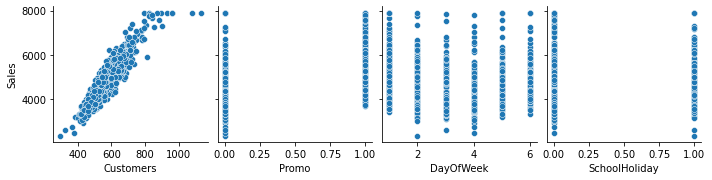

In [42]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[0], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Sales are higher on weekend

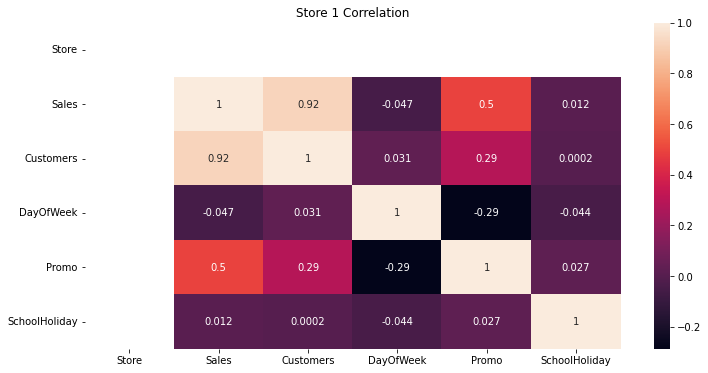

In [43]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[0].corr(),annot=True)
plt.title("Store 1 Correlation")
plt.show()

#### Store 3

<Figure size 1440x432 with 0 Axes>

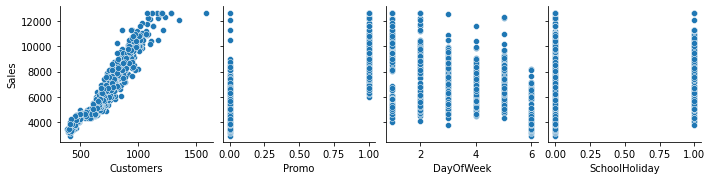

In [44]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[1], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Sales are higher on early weekdays

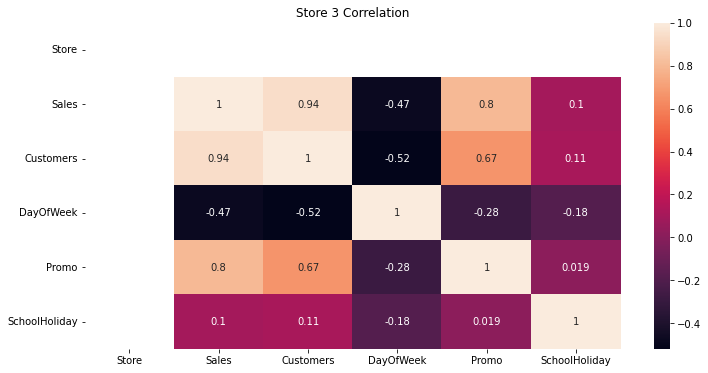

In [45]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[1].corr(),annot=True)
plt.title("Store 3 Correlation")
plt.show()

#### Store 8

<Figure size 1440x432 with 0 Axes>

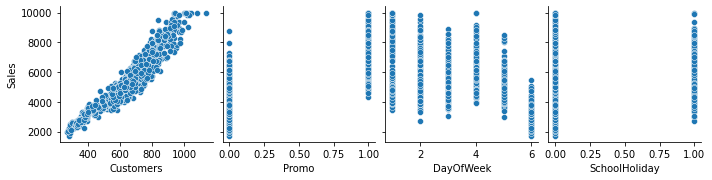

In [46]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[2], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Higher values when of Sales when Promotion is done
- Sales are higher on starting weekdays

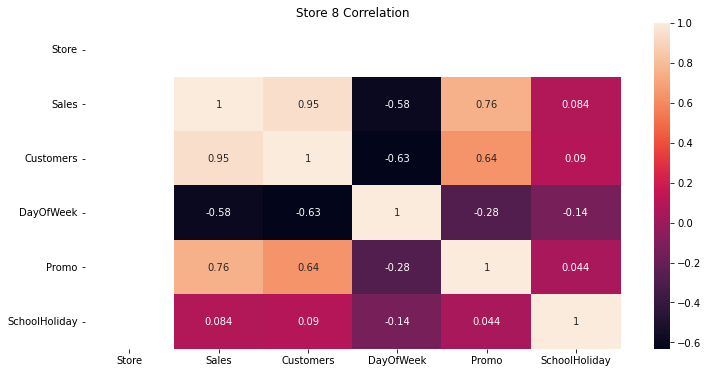

In [47]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[2].corr(),annot=True)
plt.title("Store 8 Correlation")
plt.show()

#### Store 9

<Figure size 1440x432 with 0 Axes>

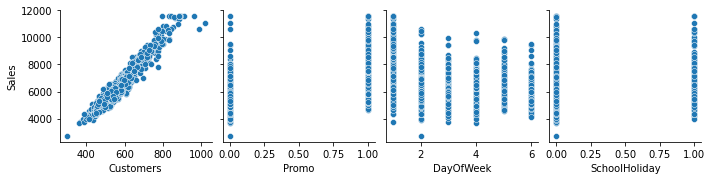

In [48]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[3], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Sales are higher on starting week days

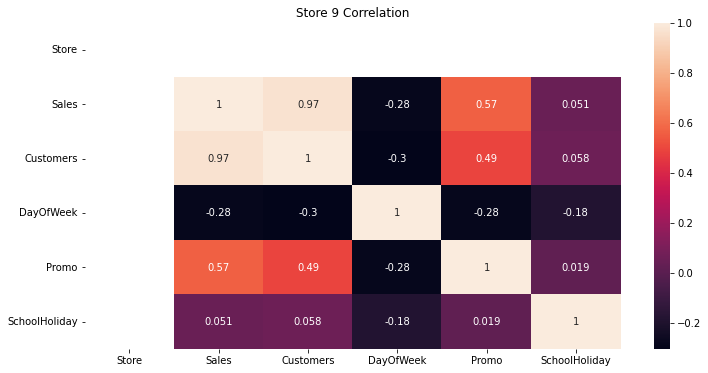

In [49]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[3].corr(),annot=True)
plt.title("Store 9 Correlation")
plt.show()

#### Store 13

<Figure size 1440x432 with 0 Axes>

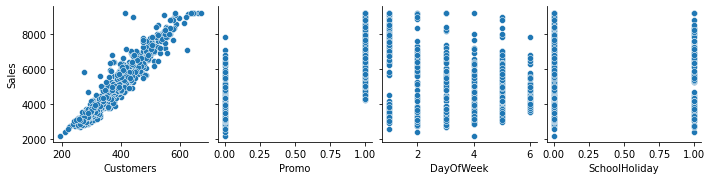

In [50]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[4], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is not done

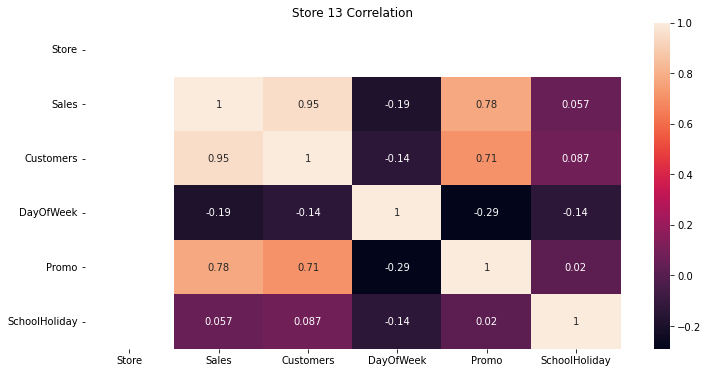

In [51]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[4].corr(),annot=True)
plt.title("Store 13 Correlation")
plt.show()

#### Store 25

<Figure size 1440x432 with 0 Axes>

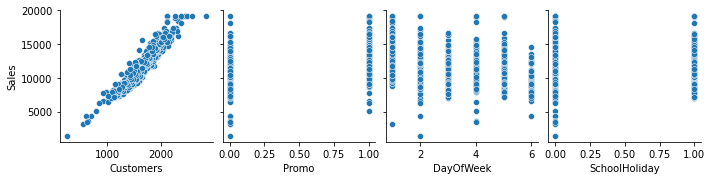

In [52]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[5], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Lower sales recorded when no promotion is done
- Sales are higher on day 1, 2, 4 and 6

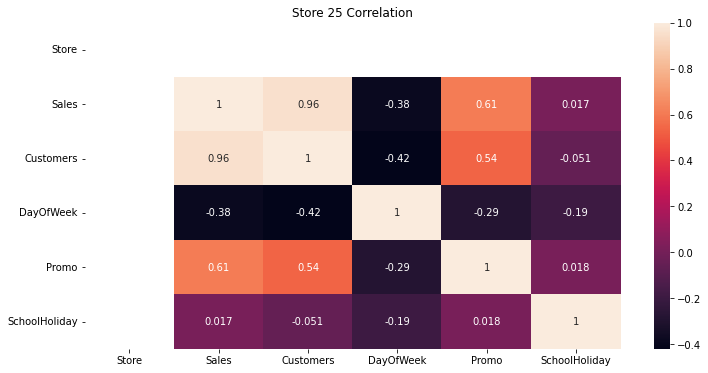

In [53]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[5].corr(),annot=True)
plt.title("Store 25 Correlation")
plt.show()

#### Store 29

<Figure size 1440x432 with 0 Axes>

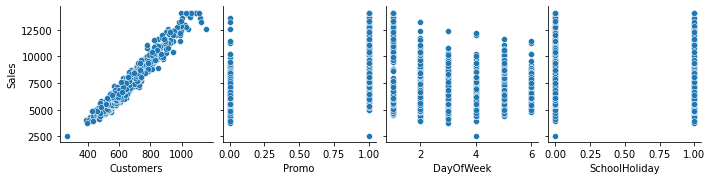

In [54]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[6], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is not done
- Sales on Monday is higher on weekend

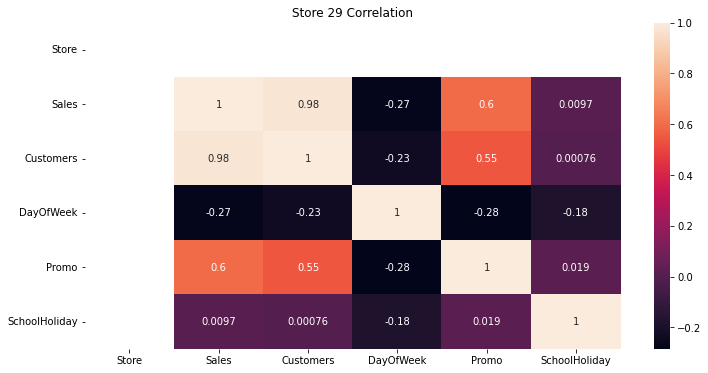

In [55]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[6].corr(),annot=True)
plt.title("Store 29 Correlation")
plt.show()

#### Store 31

<Figure size 1440x432 with 0 Axes>

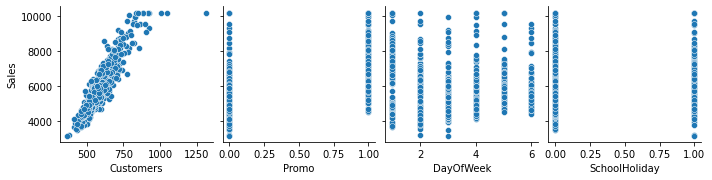

In [56]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[7], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is done
- Sales are higher on weekend

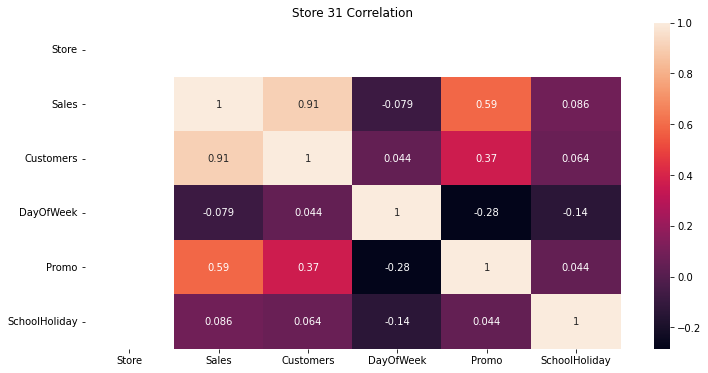

In [57]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[7].corr(),annot=True)
plt.title("Store 31 Correlation")
plt.show()

#### Store 46

<Figure size 1440x432 with 0 Axes>

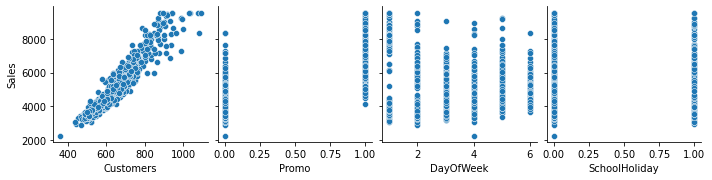

In [58]:
# Pair-plot
plt.figure(figsize=(20,6))
sns.pairplot(store_tsdf[8], x_vars=["Customers", "Promo", "DayOfWeek", "SchoolHoliday"], y_vars="Sales")
plt.show()

##### Conclusion
- Strong Correlation between Sales and Customers
- Less sales on School Holidays and when promotion is not done

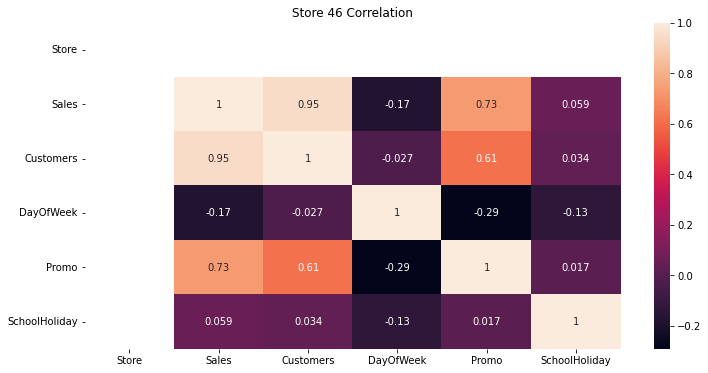

In [59]:
# Correlation
plt.figure(figsize=(12,6))
sns.heatmap(store_tsdf[8].corr(),annot=True)
plt.title("Store 46 Correlation")
plt.show()

### 3.5 Decomposition of time serise data

#### Store 1

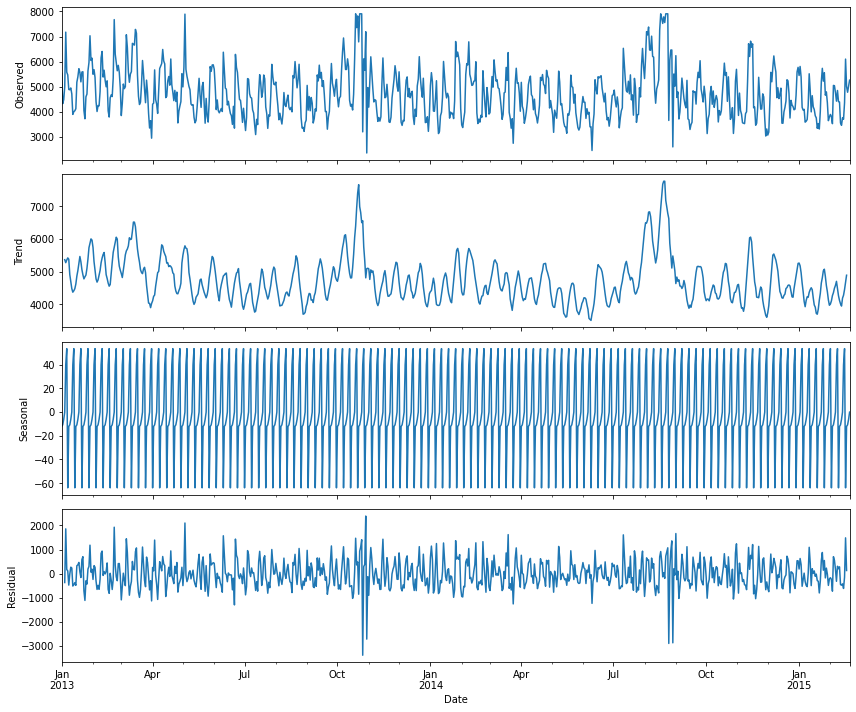

In [60]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[0]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 3

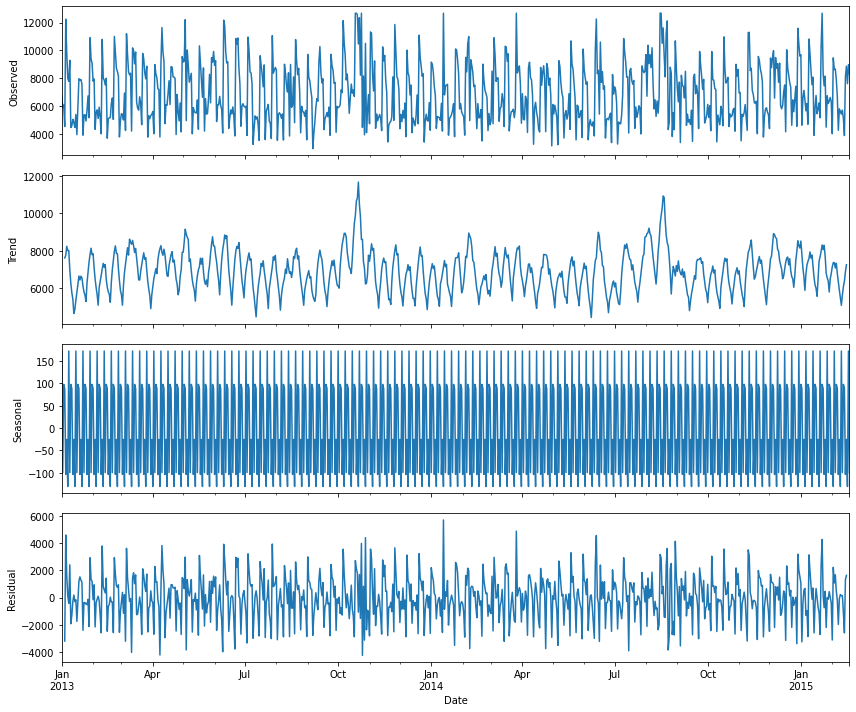

In [61]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[1]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 8

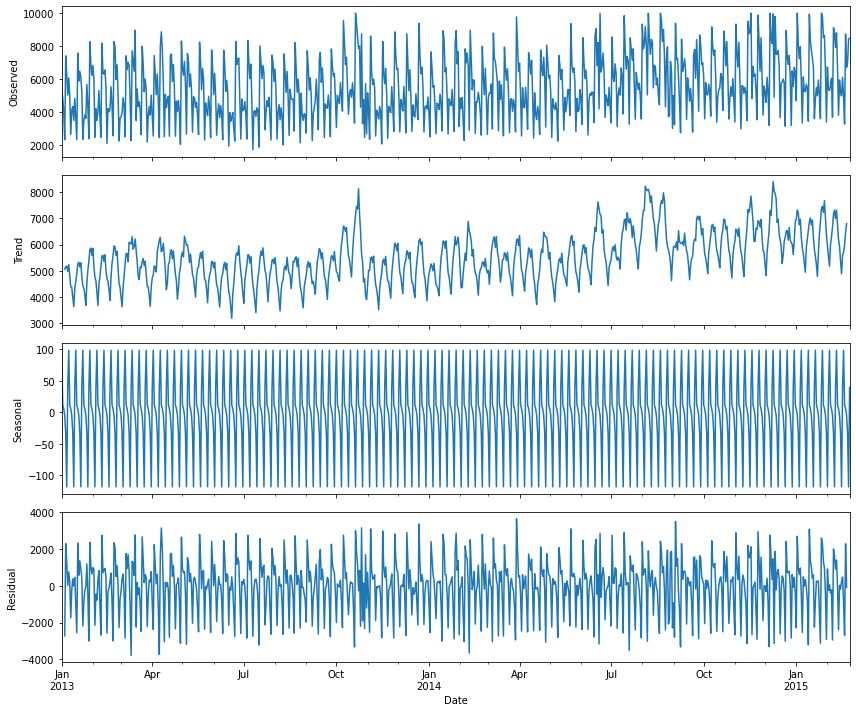

In [62]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[2]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 9

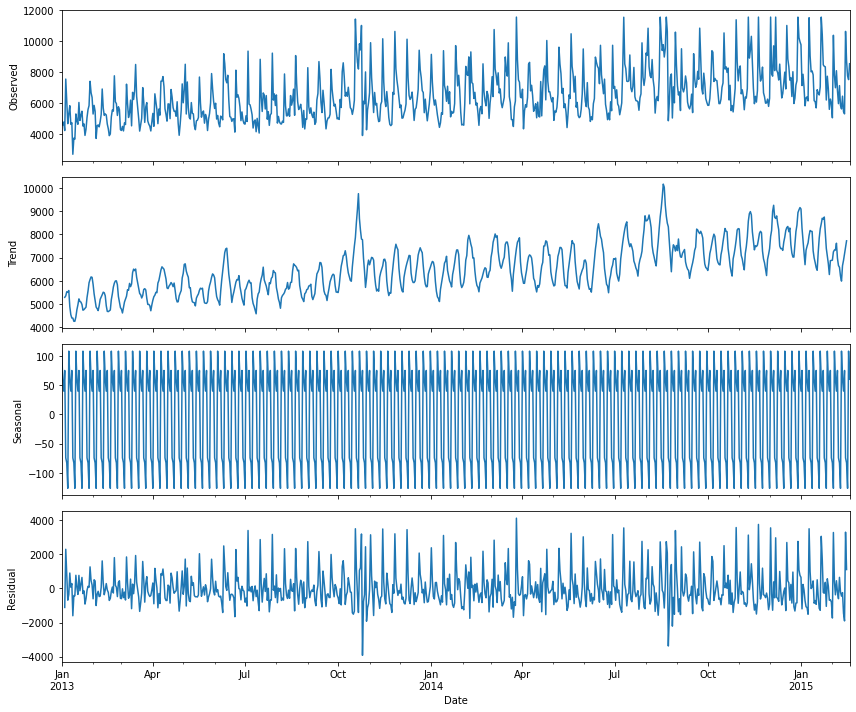

In [63]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[3]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 13

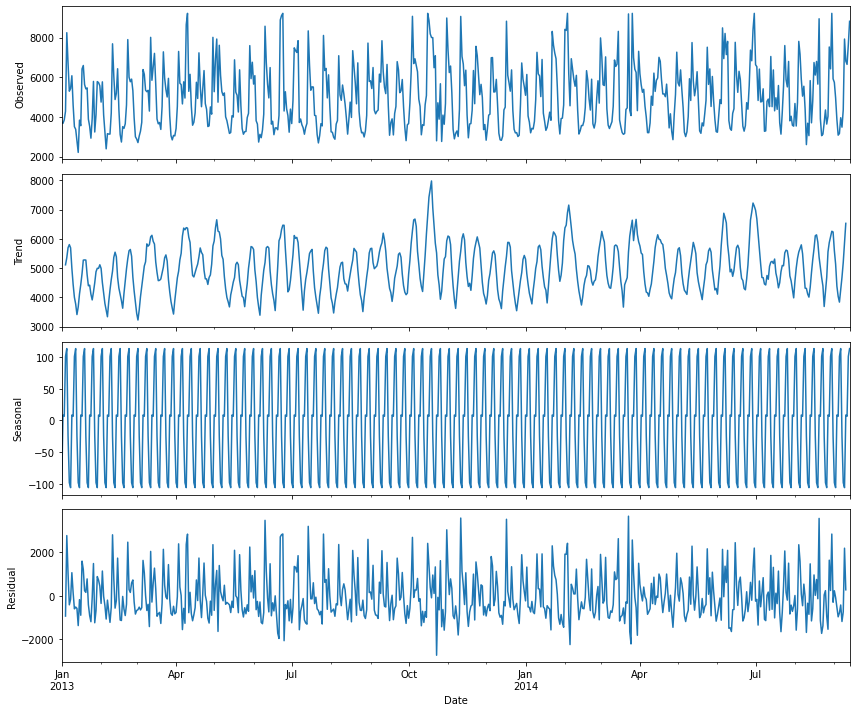

In [64]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[4]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 25

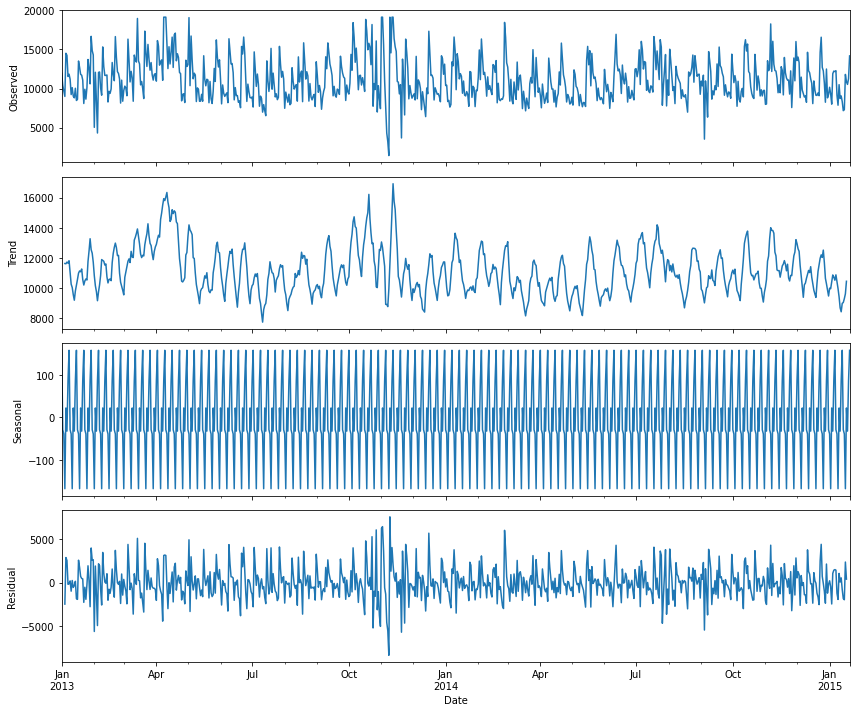

In [65]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[5]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 29

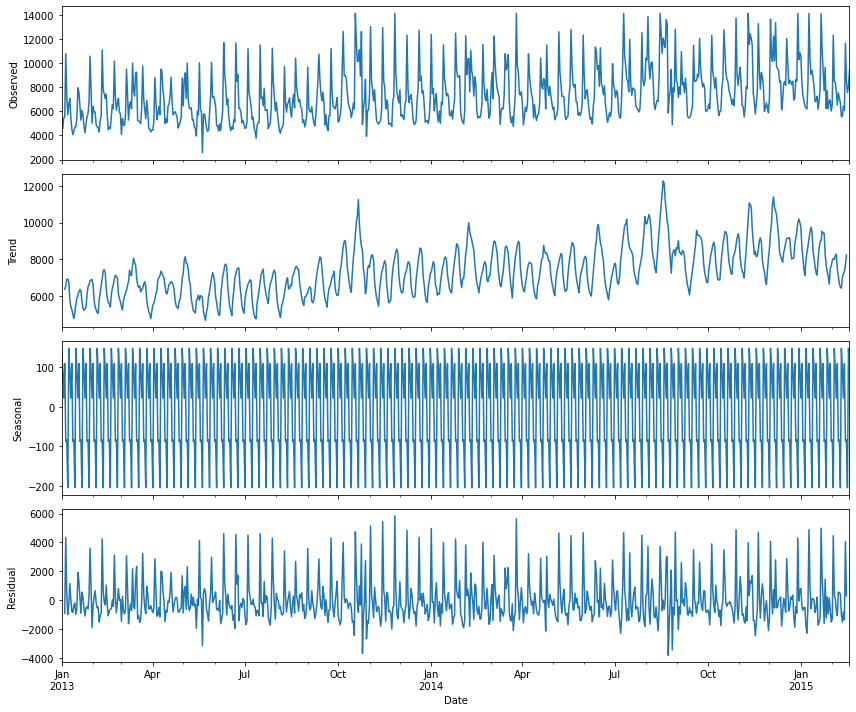

In [66]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[6]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 31

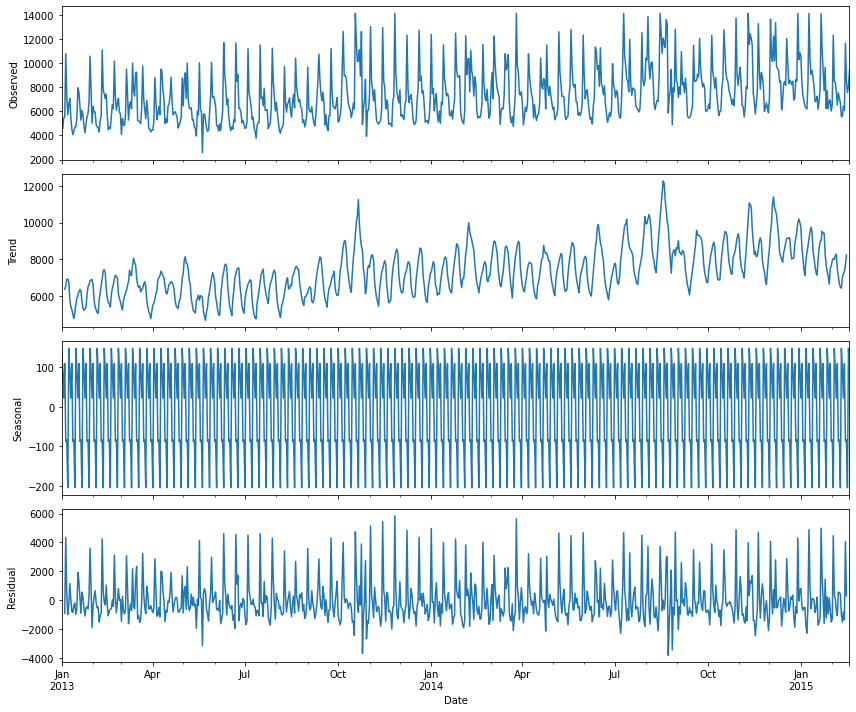

In [67]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[6]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

#### Store 46

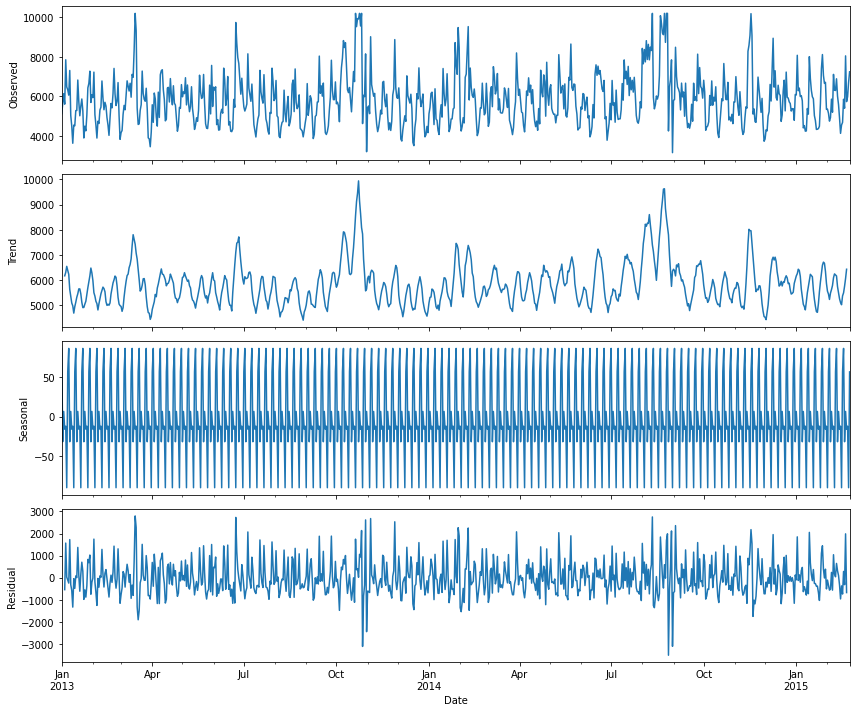

In [68]:
rcParams['figure.figsize'] = 12,10
decomposition_store_1 = sm.tsa.seasonal_decompose(store_tsdf[7]["Sales"],model='additive')
fig = decomposition_store_1.plot()
plt.show()

##### Conclusion
- Using only "Additive" decomposition beacuse Seasonal Component is not changing with respect to time

## 4. Data Preperation 

### 4.1 Splitting dataset into train and test

In [69]:
# We have to predict next 6 week (42 days)
for i,j in enumerate(store_number): 
    print(f"Length of Store_{j} is : {len(store_tsdf[i])}")

Length of Store_1 is : 781
Length of Store_3 is : 779
Length of Store_8 is : 784
Length of Store_9 is : 779
Length of Store_13 is : 621
Length of Store_25 is : 750
Length of Store_29 is : 779
Length of Store_31 is : 784
Length of Store_46 is : 622


In [70]:
# Converting into Train and Test set
train_store = []
test_store = []
for i,j in enumerate(store_number):
    
    print(f"Store Number {j}")
    train_store.append(store_tsdf[i][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][:-42])
    test_store.append(store_tsdf[i][['Sales','Customers','DayOfWeek','Promo','SchoolHoliday','StateHoliday']][-42:])
    print(f"Length of Train Store_{j} is : {len(train_store[i])}")
    print(f"Length of Test Store_{j} is : {len(test_store[i])}")
    print("\n")

Store Number 1
Length of Train Store_1 is : 739
Length of Test Store_1 is : 42


Store Number 3
Length of Train Store_3 is : 737
Length of Test Store_3 is : 42


Store Number 8
Length of Train Store_8 is : 742
Length of Test Store_8 is : 42


Store Number 9
Length of Train Store_9 is : 737
Length of Test Store_9 is : 42


Store Number 13
Length of Train Store_13 is : 579
Length of Test Store_13 is : 42


Store Number 25
Length of Train Store_25 is : 708
Length of Test Store_25 is : 42


Store Number 29
Length of Train Store_29 is : 737
Length of Test Store_29 is : 42


Store Number 31
Length of Train Store_31 is : 742
Length of Test Store_31 is : 42


Store Number 46
Length of Train Store_46 is : 580
Length of Test Store_46 is : 42




# Store - 1

### 4.2 Standardize the train data

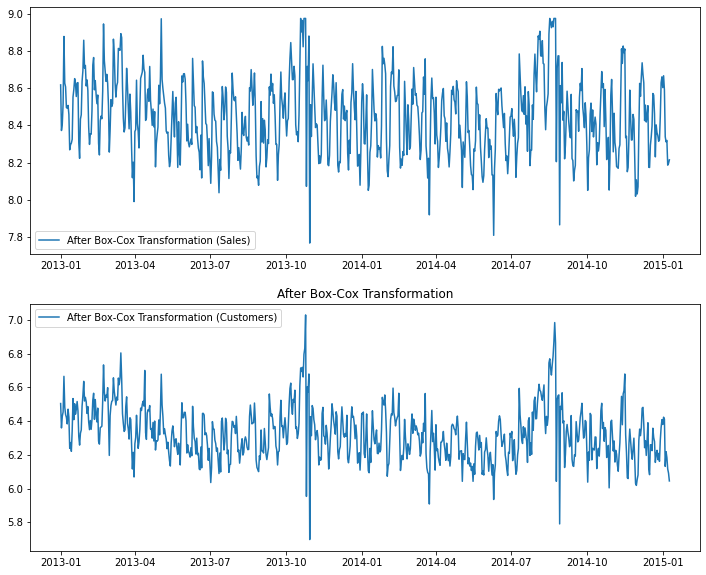

In [71]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[0]["Sales"], lmbda=0), index=train_store[0].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[0]["Customers"], lmbda=0), index=train_store[0].index)

# Plotting Graph
plt.figure(figsize=(12,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [72]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -5.399
Critical value @ 0.01: -3.44
p-value: 0.000003


ADF Test for Customers
ADF Statistics: -4.114
Critical value @ 0.01: -3.44
p-value: 0.000920


In [73]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.01: %.2f' % kpss_test[3]['1%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.01: %.2f' % kpss_test[3]['1%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.259814
Critical Values @ 0.01: 0.74
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.551440
Critical Values @ 0.01: 0.74
p-value: 0.030081


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Training Dataset is Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

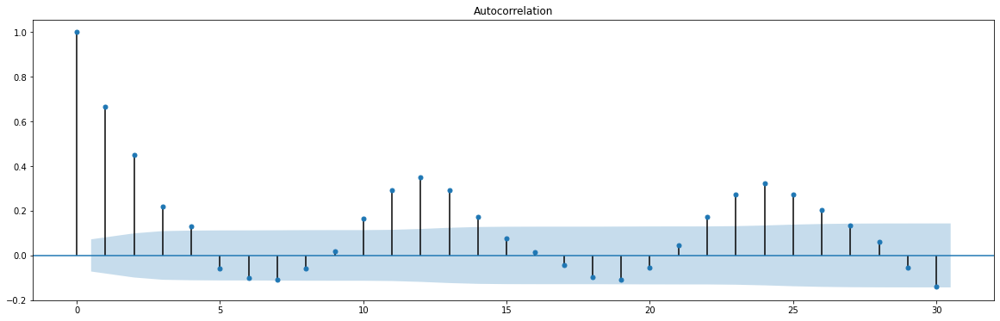

In [74]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags= 30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

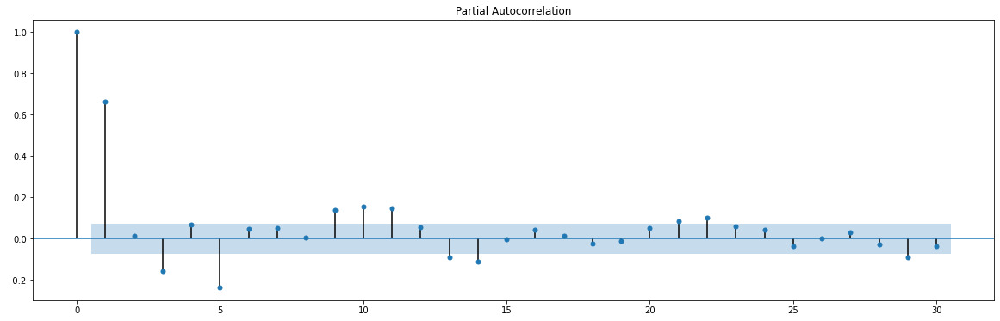

In [75]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [76]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(2,0,8))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  739
Model:                     ARMA(2, 8)   Log Likelihood                 396.656
Method:                       css-mle   S.D. of innovations              0.141
Date:                Mon, 14 Feb 2022   AIC                           -769.311
Time:                        16:22:26   BIC                           -714.048
Sample:                    01-01-2013   HQIC                          -748.002
                         - 01-09-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.4498      0.013    636.423      0.000       8.424       8.476
ar.L1.Sales     1.7275      0.010    169.872      0.000       1.708       1.747
ar.L2.Sales    -0.9836      0.011    -88.376    

### 5.4 Recover the Orignal Time Serise

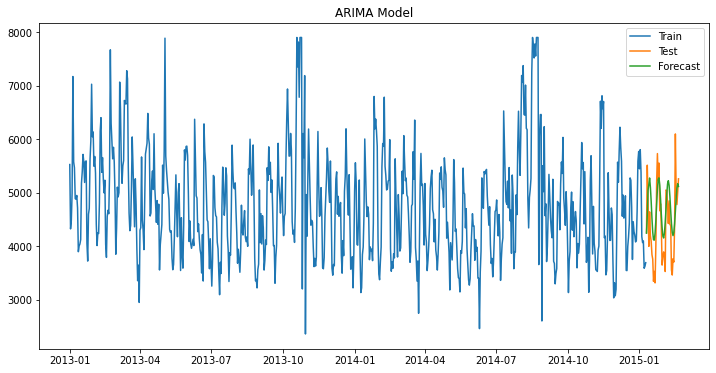

In [77]:
# Recovering
y_hat_arma = store_tsdf[0]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[0].index.min(), end=test_store[0].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(12,6))
plt.plot(train_store[0]["Sales"], label= "Train")
plt.plot(test_store[0]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [78]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[0]["Sales"], y_hat_arma["arma_forecast"][test_store[0].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[0]["Sales"]- y_hat_arma["arma_forecast"][test_store[0].index.min():])/test_store[0]["Sales"])*100,2)

# Creating result dataframe
results = pd.DataFrame({"Method":[], "RMSE":[], "MAPE":[]})

# Adding result
tempResults = pd.DataFrame({'Method':['Store_1_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96


### 5.6 Creating VAR Model

In [79]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                             VAR(2)   Log Likelihood                1484.240
                              + intercept   AIC                          -2942.479
Date:                    Mon, 14 Feb 2022   BIC                          -2882.611
Time:                            16:22:33   HQIC                         -2919.395
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              252.63, 118.76   Jarque-Bera (JB):       568.54, 116.30
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.36, 1.25   Skew:                      -0.48, 0.00
P

### 5.7 Recover the Orignal Time Serise

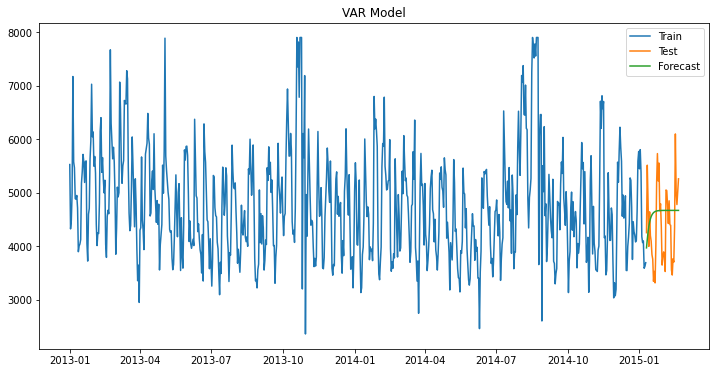

In [80]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[0].index.min(), end=test_store[0].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(12,6))
plt.plot(train_store[0]["Sales"], label= "Train")
plt.plot(test_store[0]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [81]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[0]["Sales"], y_hat_var["Sales"][test_store[0].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[0]["Sales"]- y_hat_var["Sales"][test_store[0].index.min():])/test_store[0]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_1_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42


### 5.9 Johansen Co-Integration Test

In [82]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [83]:
# Defining Rank
def rank(res,critical_per = 90):
    trace = res.lr1
    max_eign = res.lr2
    cv_t = res.cvt
    cv_e = res.cvm
    len_rank = len(trace)
    
    if critical_per == 90:
        for i in range(len_rank):
            if trace[i] > cv_t[i,0]:
                r_t = i+1
                
        for i in range(len_rank):
            if max_eign[i] > cv_e[i,0]:
                r_e = i+1
                
    elif critical_per == 95:
        for i in range(len_rank):
            if trace[i] > cv_t[i,1]:
                r_t = i+1
                
        for i in range(len_rank):
            if max_eign[i] > cv_e[i,1]:
                r_e = i+1
                
    else:
        for i in range(len_rank):
            if trace[i] > cv_t[i,2]:
                r_t = i+1
                
        for i in range(len_rank):
            if max_eign[i] > cv_e[i,2]:
                r_e = i+1
    
    print(f"Rank for Trace is {r_t}\nRank for Eigen is {r_e}")

In [84]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)


In [85]:
# Creating VARMAX Model
exog = train_store[0][["SchoolHoliday"]]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,8), trend='c', exog=exog)
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                        VARMAX(2,8)   Log Likelihood                1570.784
                              + intercept   AIC                          -3047.567
Date:                    Mon, 14 Feb 2022   BIC                          -2831.118
Time:                            16:25:02   HQIC                         -2964.107
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               103.26, 83.65   Jarque-Bera (JB):       289.99, 173.60
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.24, 1.32   Skew:                      -0.33, 0.02
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


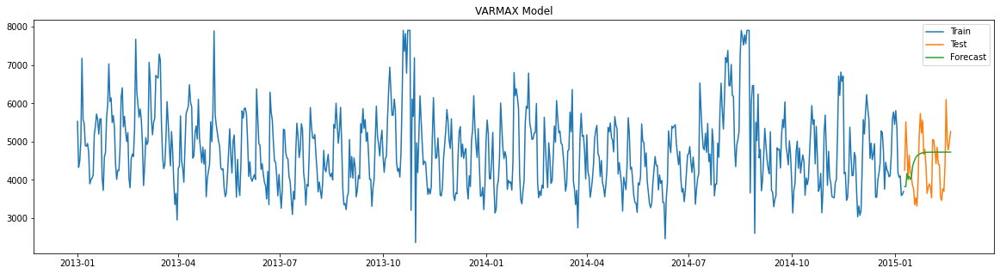

In [86]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[0].index.min(), end=test_store[0].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,5))
plt.plot(train_store[0]["Sales"], label= "Train")
plt.plot(test_store[0]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [87]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[0]["Sales"], y_hat_varmax["Sales"][test_store[0].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[0]["Sales"]- y_hat_varmax["Sales"][test_store[0].index.min():])/test_store[0]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_1_VARMAX_School_Holiday'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

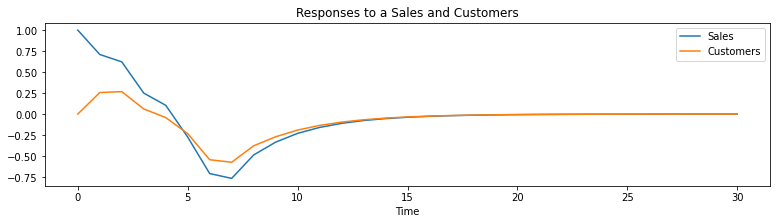

In [88]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [89]:
# Creating VARMAX Model
exog = train_store[0][["Promo"]]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,8), trend='c', exog=exog)
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                        VARMAX(2,8)   Log Likelihood                1645.360
                              + intercept   AIC                          -3196.719
Date:                    Mon, 14 Feb 2022   BIC                          -2980.270
Time:                            16:25:43   HQIC                         -3113.259
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               128.21, 94.10   Jarque-Bera (JB):       210.55, 199.49
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.40, 1.31   Skew:                     -0.27, -0.12
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


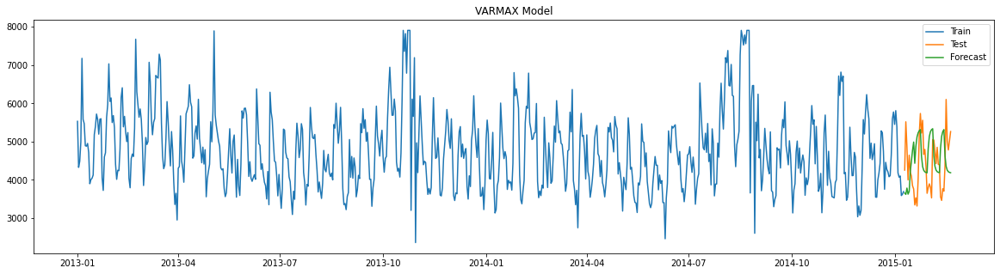

In [90]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[0].index.min(), end=test_store[0].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,5))
plt.plot(train_store[0]["Sales"], label= "Train")
plt.plot(test_store[0]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [91]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[0]["Sales"], y_hat_varmax["Sales"][test_store[0].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[0]["Sales"]- y_hat_varmax["Sales"][test_store[0].index.min():])/test_store[0]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_1_VARMAX_Promotion'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

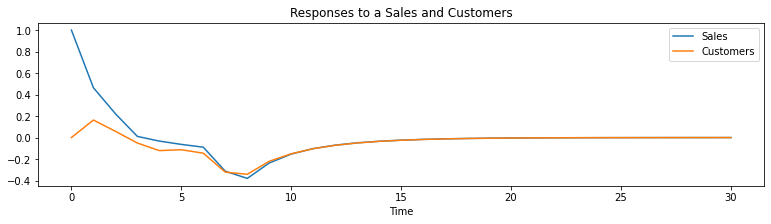

In [92]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [93]:
# Creating VARMAX Model
exog = train_store[0][["DayOfWeek"]]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,8), trend='c', exog=exog)
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  739
Model:                        VARMAX(2,8)   Log Likelihood                1599.899
                              + intercept   AIC                          -3105.798
Date:                    Mon, 14 Feb 2022   BIC                          -2889.349
Time:                            16:28:06   HQIC                         -3022.338
Sample:                        01-01-2013                                         
                             - 01-09-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                99.69, 90.91   Jarque-Bera (JB):       277.39, 280.14
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.17, 1.35   Skew:                      -0.25, 0.02
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


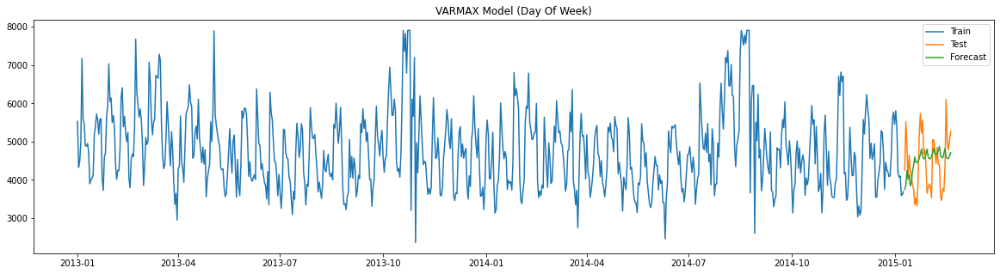

In [94]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[0].index.min(), end=test_store[0].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,5))
plt.plot(train_store[0]["Sales"], label= "Train")
plt.plot(test_store[0]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model (Day Of Week)")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [95]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[0]["Sales"], y_hat_varmax["Sales"][test_store[0].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[0]["Sales"]- y_hat_varmax["Sales"][test_store[0].index.min():])/test_store[0]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_1_VARMAX_Day_Of_Week'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

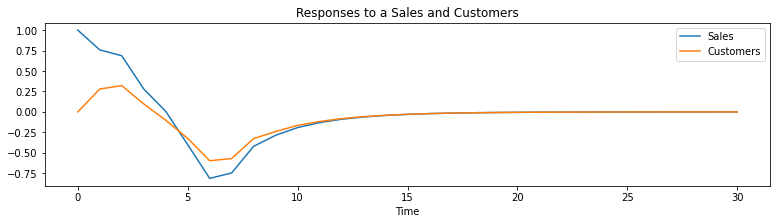

In [96]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 3

### 4.2 Standardize the train data

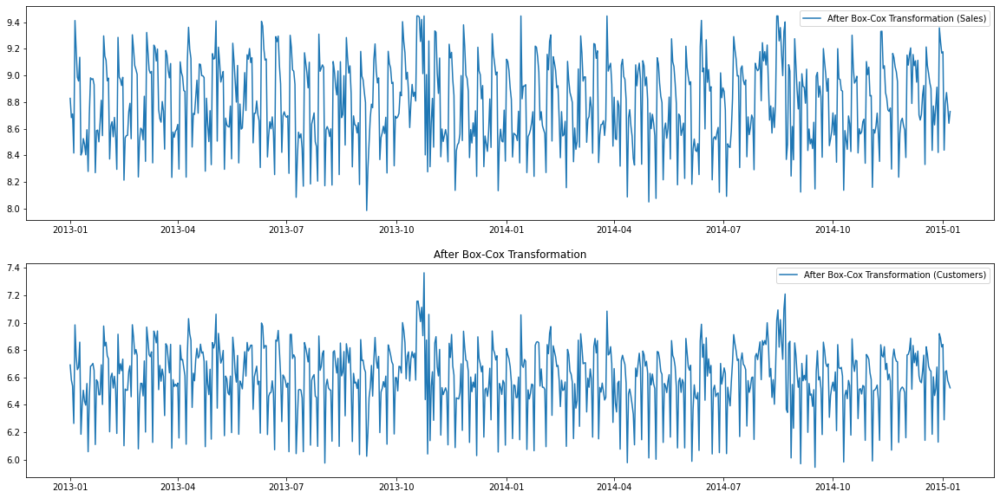

In [97]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[1]["Sales"], lmbda=0), index=train_store[1].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[1]["Customers"], lmbda=0), index=train_store[1].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [98]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -6.488
Critical value @ 0.01: -3.44
p-value: 0.000000


ADF Test for Customers
ADF Statistics: -5.585
Critical value @ 0.01: -3.44
p-value: 0.000001


In [99]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.057096
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.153176
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

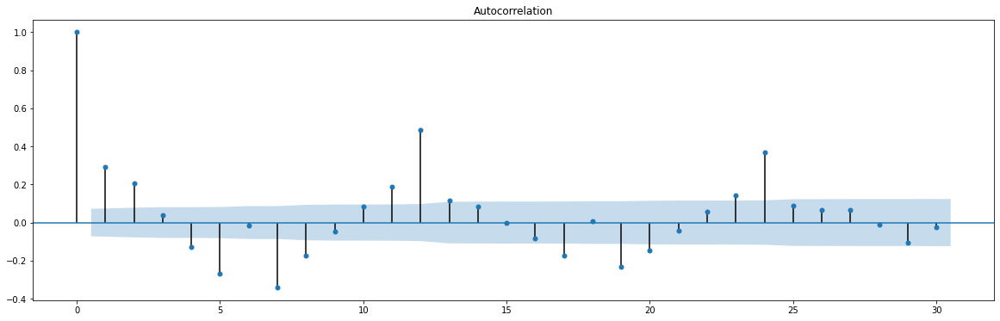

In [100]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

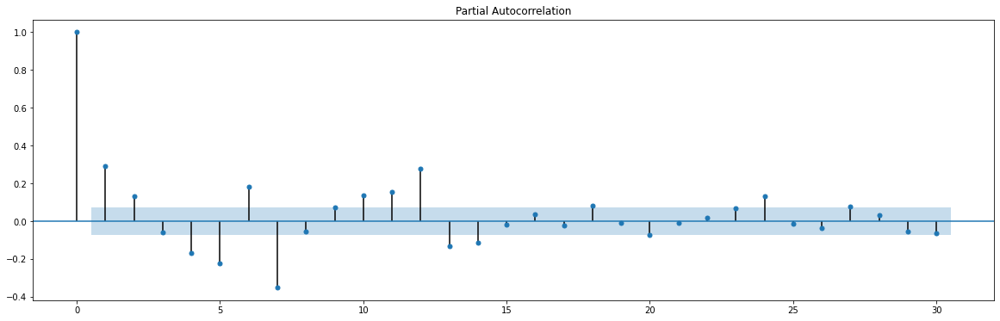

In [101]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [102]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(6,0,7))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  737
Model:                     ARMA(6, 7)   Log Likelihood                 -37.151
Method:                       css-mle   S.D. of innovations              0.254
Date:                Mon, 14 Feb 2022   AIC                            104.303
Time:                        16:28:23   BIC                            173.342
Sample:                    01-01-2013   HQIC                           130.927
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.7939      0.012    717.776      0.000       8.770       8.818
ar.L1.Sales    -0.3853      0.304     -1.268      0.205      -0.981       0.210
ar.L2.Sales     0.4346      0.072      6.053    

### 5.4 Recover the Orignal Time Serise

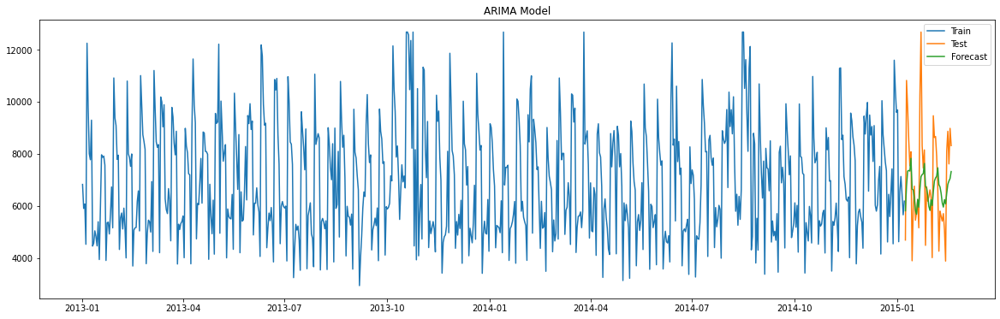

In [103]:
# Recovering
y_hat_arma = store_tsdf[1]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[1].index.min(), end=test_store[1].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[1]["Sales"], label= "Train")
plt.plot(test_store[1]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [104]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[1]["Sales"], y_hat_arma["arma_forecast"][test_store[1].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[1]["Sales"]- y_hat_arma["arma_forecast"][test_store[1].index.min():])/test_store[1]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_3_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30


### 5.6 Creating VAR Model

In [105]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(6,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                             VAR(6)   Log Likelihood                1098.399
                              + intercept   AIC                          -2138.797
Date:                    Mon, 14 Feb 2022   BIC                          -2005.322
Time:                            16:28:33   HQIC                         -2087.325
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               110.17, 67.52   Jarque-Bera (JB):         26.04, 34.10
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.10, 1.26   Skew:                      0.02, -0.19
P

### 5.7 Recover the Orignal Time Serise

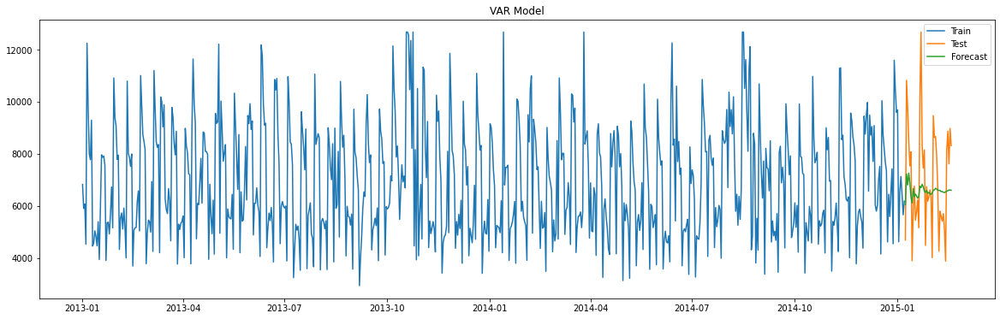

In [106]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[1].index.min(), end=test_store[1].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[1]["Sales"], label= "Train")
plt.plot(test_store[1]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [107]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[1]["Sales"], y_hat_var["Sales"][test_store[1].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[1]["Sales"]- y_hat_var["Sales"][test_store[1].index.min():])/test_store[1]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_3_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23


### 5.9 Johansen Co-Integration Test

In [108]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [109]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [110]:
# Creating VARMAX Model
exog = train_store[1]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(6,7), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                        VARMAX(6,7)   Log Likelihood                1124.929
                              + intercept   AIC                          -2131.857
Date:                    Mon, 14 Feb 2022   BIC                          -1860.305
Time:                            16:31:04   HQIC                         -2027.137
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                89.33, 47.70   Jarque-Bera (JB):         23.43, 40.30
Prob(Q):                        0.00, 0.19   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.12, 1.25   Skew:                     -0.09, -0.18
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


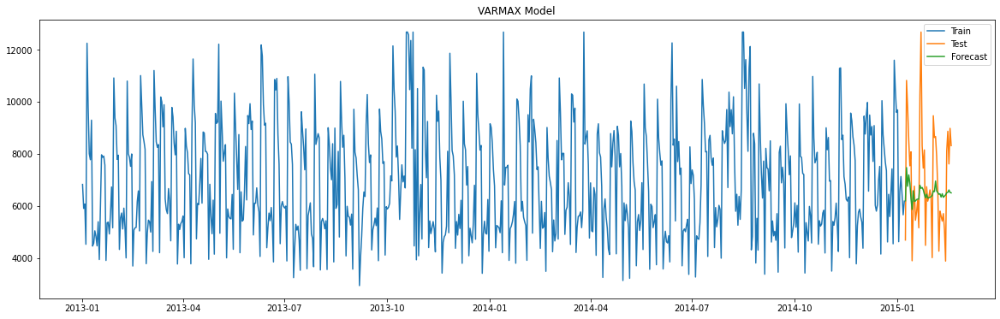

In [111]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[1].index.min(), end=test_store[1].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[1]["Sales"], label= "Train")
plt.plot(test_store[1]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [112]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[1]["Sales"], y_hat_varmax["Sales"][test_store[1].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[1]["Sales"]- y_hat_varmax["Sales"][test_store[1].index.min():])/test_store[1]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_3_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

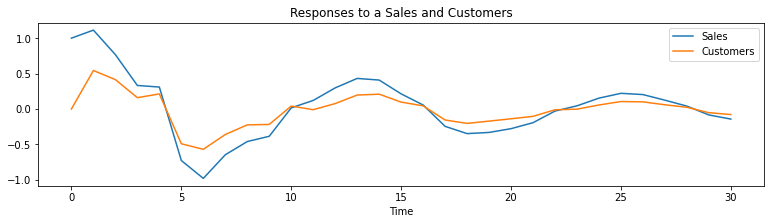

In [113]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [114]:
# Creating VARMAX Model
exog = train_store[1]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(6,7), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                        VARMAX(6,7)   Log Likelihood                1335.138
                              + intercept   AIC                          -2552.276
Date:                    Mon, 14 Feb 2022   BIC                          -2280.724
Time:                            16:38:37   HQIC                         -2447.556
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               114.57, 84.48   Jarque-Bera (JB):         28.31, 50.31
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.34, 1.22   Skew:                      0.21, -0.20
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


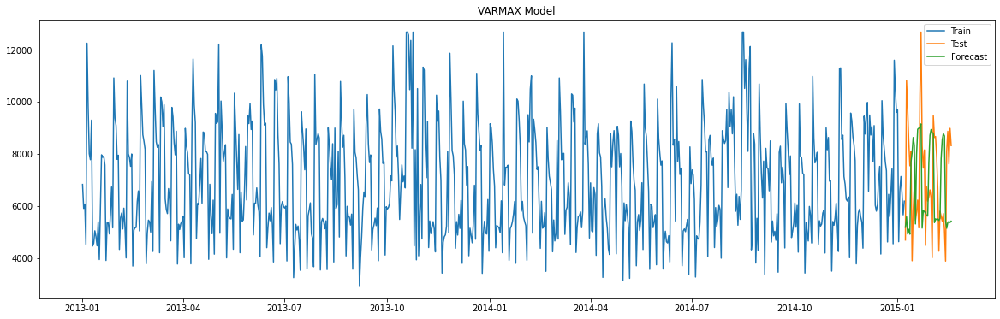

In [115]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[1].index.min(), end=test_store[1].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[1]["Sales"], label= "Train")
plt.plot(test_store[1]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [116]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[1]["Sales"], y_hat_varmax["Sales"][test_store[1].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[1]["Sales"]- y_hat_varmax["Sales"][test_store[1].index.min():])/test_store[1]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_3_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

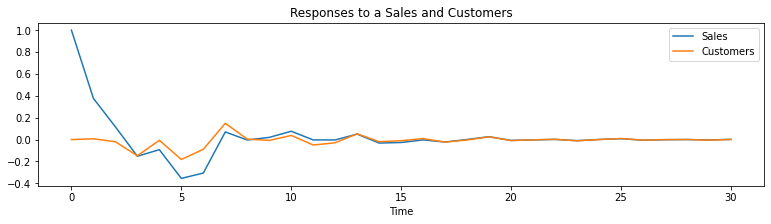

In [117]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [118]:
# Creating VARMAX Model
exog = train_store[1]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(6,7), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                        VARMAX(6,7)   Log Likelihood                1272.422
                              + intercept   AIC                          -2426.844
Date:                    Mon, 14 Feb 2022   BIC                          -2155.291
Time:                            16:41:36   HQIC                         -2322.123
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                92.62, 59.01   Jarque-Bera (JB):         23.35, 38.14
Prob(Q):                        0.00, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.18, 1.22   Skew:                      -0.07, 0.05
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


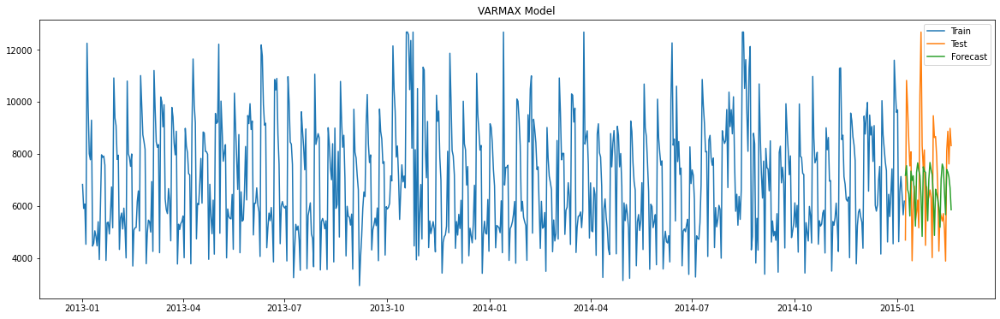

In [119]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[1].index.min(), end=test_store[1].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[1]["Sales"], label= "Train")
plt.plot(test_store[1]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [120]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[1]["Sales"], y_hat_varmax["Sales"][test_store[1].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[1]["Sales"]- y_hat_varmax["Sales"][test_store[1].index.min():])/test_store[1]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_3_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

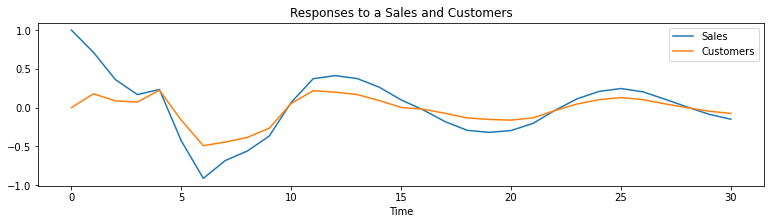

In [121]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 8

### 4.2 Standardize the train data

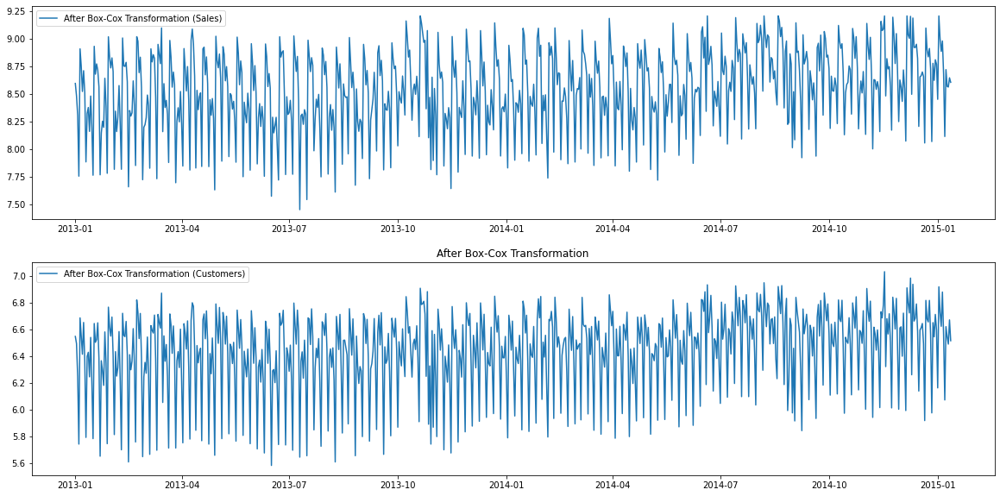

In [122]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[2]["Sales"], lmbda=0), index=train_store[2].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[2]["Customers"], lmbda=0), index=train_store[2].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [123]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -3.027
Critical value @ 0.01: -3.44
p-value: 0.032450


ADF Test for Customers
ADF Statistics: -3.167
Critical value @ 0.01: -3.44
p-value: 0.022000


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

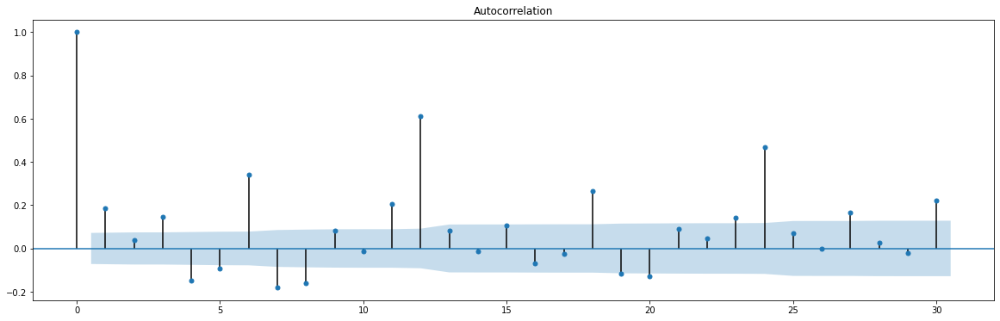

In [124]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

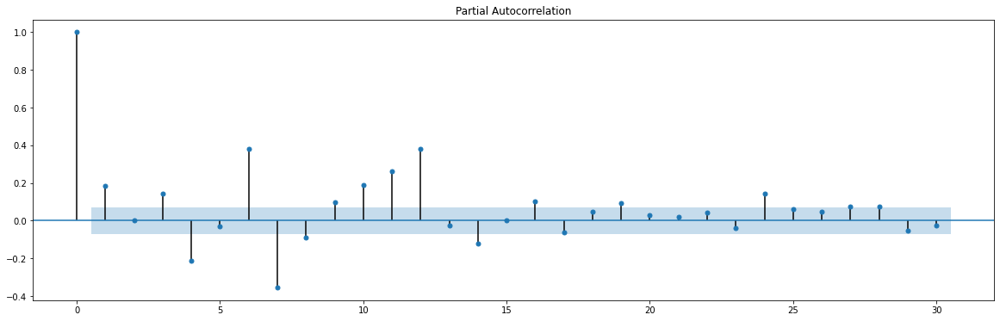

In [125]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [126]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(8,0,10))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  742
Model:                    ARMA(8, 10)   Log Likelihood                 -47.718
Method:                       css-mle   S.D. of innovations              0.257
Date:                Mon, 14 Feb 2022   AIC                            135.435
Time:                        16:42:13   BIC                            227.622
Sample:                    01-01-2013   HQIC                           170.974
                         - 01-12-2015                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            8.5533      0.067    128.447      0.000       8.423       8.684
ar.L1.Sales      1.5591      0.051     30.670      0.000       1.459       1.659
ar.L2.Sales     -0.8664      0.069    -12.62

### 5.4 Recover the Orignal Time Serise

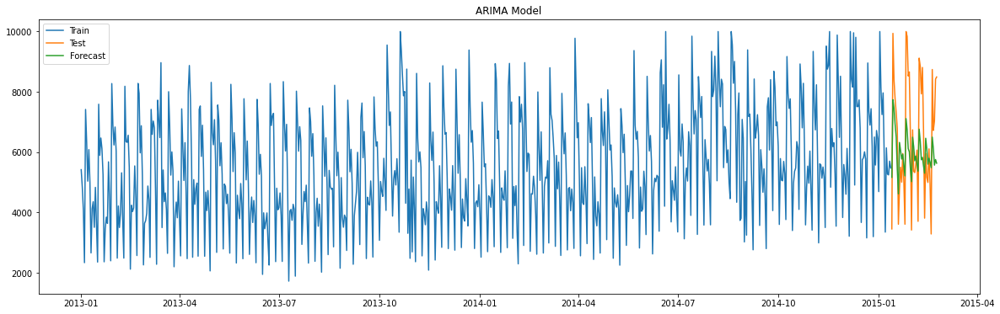

In [127]:
# Recovering
y_hat_arma = store_tsdf[2]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[2].index.min(), end=test_store[2].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[2]["Sales"], label= "Train")
plt.plot(test_store[2]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [128]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[2]["Sales"], y_hat_arma["arma_forecast"][test_store[2].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[2]["Sales"]- y_hat_arma["arma_forecast"][test_store[2].index.min():])/test_store[2]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_8_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [129]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(8,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(8)   Log Likelihood                1089.892
                              + intercept   AIC                          -2105.784
Date:                    Mon, 14 Feb 2022   BIC                          -1935.238
Time:                            16:42:38   HQIC                         -2040.036
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                75.82, 40.34   Jarque-Bera (JB):       283.51, 105.86
Prob(Q):                        0.00, 0.46   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.92, 0.87   Skew:                     -0.11, -0.15
P

### 5.7 Recover the Orignal Time Serise

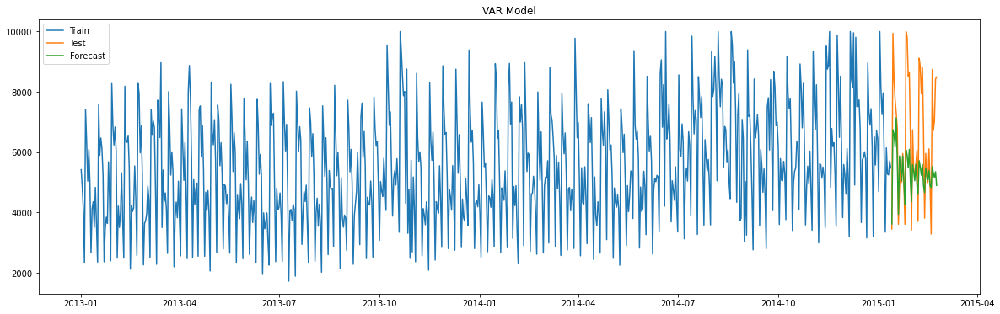

In [130]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[2].index.min(), end=test_store[2].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[2]["Sales"], label= "Train")
plt.plot(test_store[2]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [131]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[2]["Sales"], y_hat_var["Sales"][test_store[2].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[2]["Sales"]- y_hat_var["Sales"][test_store[2].index.min():])/test_store[2]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_8_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [132]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [133]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [134]:
# Creating VARMAX Model
exog = train_store[2]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(8,10), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                       VARMAX(8,10)   Log Likelihood                1118.550
                              + intercept   AIC                          -2079.101
Date:                    Mon, 14 Feb 2022   BIC                          -1714.962
Time:                            16:48:34   HQIC                         -1938.720
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                66.75, 36.93   Jarque-Bera (JB):        247.90, 96.76
Prob(Q):                        0.01, 0.61   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.91, 0.87   Skew:                     -0.06, -0.14
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


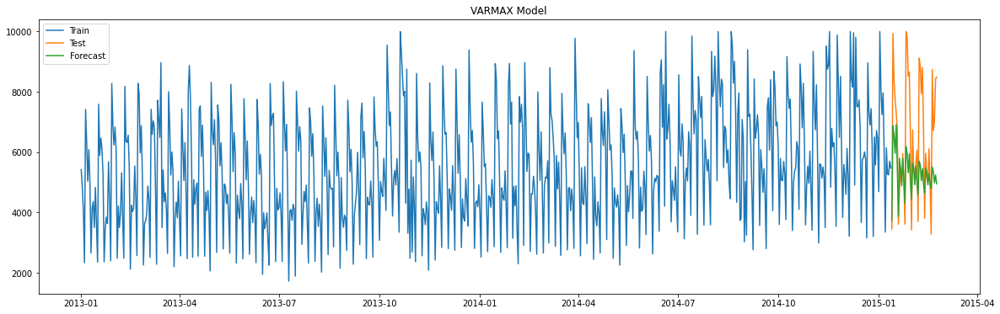

In [135]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[2].index.min(), end=test_store[2].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[2]["Sales"], label= "Train")
plt.plot(test_store[2]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [136]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[2]["Sales"], y_hat_varmax["Sales"][test_store[2].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[2]["Sales"]- y_hat_varmax["Sales"][test_store[2].index.min():])/test_store[2]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_8_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

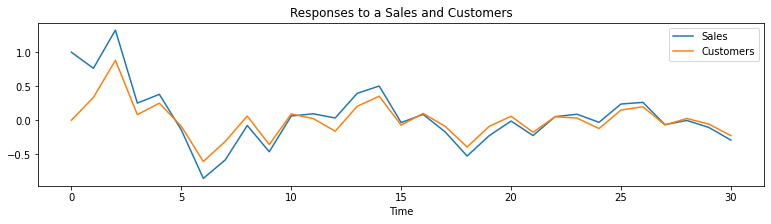

In [137]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [138]:
# Creating VARMAX Model
exog = train_store[2]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(8,10), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                       VARMAX(8,10)   Log Likelihood                1217.390
                              + intercept   AIC                          -2276.780
Date:                    Mon, 14 Feb 2022   BIC                          -1912.642
Time:                            17:02:43   HQIC                         -2136.400
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                92.78, 64.92   Jarque-Bera (JB):        108.51, 55.63
Prob(Q):                        0.00, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.99, 0.94   Skew:                      -0.12, 0.02
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


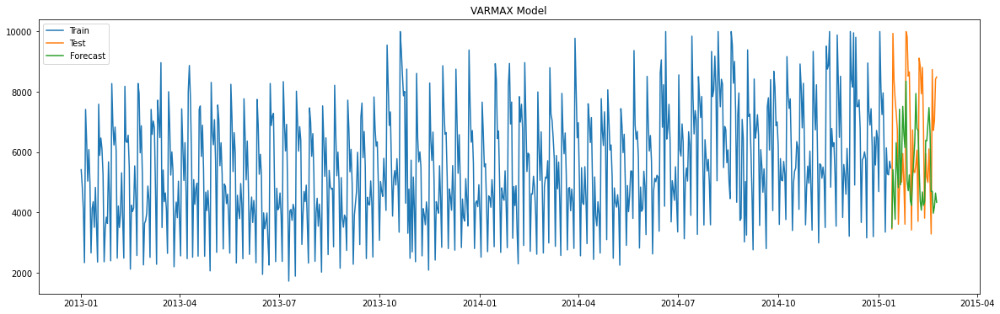

In [139]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[2].index.min(), end=test_store[2].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[2]["Sales"], label= "Train")
plt.plot(test_store[2]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [140]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[2]["Sales"], y_hat_varmax["Sales"][test_store[2].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[2]["Sales"]- y_hat_varmax["Sales"][test_store[2].index.min():])/test_store[2]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_8_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

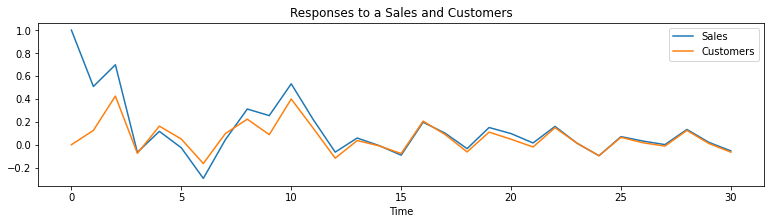

In [141]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [142]:
# Creating VARMAX Model
exog = train_store[2]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(8,10), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                       VARMAX(8,10)   Log Likelihood                1285.611
                              + intercept   AIC                          -2413.222
Date:                    Mon, 14 Feb 2022   BIC                          -2049.083
Time:                            17:16:07   HQIC                         -2272.841
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                85.82, 38.16   Jarque-Bera (JB):         98.51, 70.38
Prob(Q):                        0.00, 0.55   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.89, 0.88   Skew:                     -0.31, -0.05
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


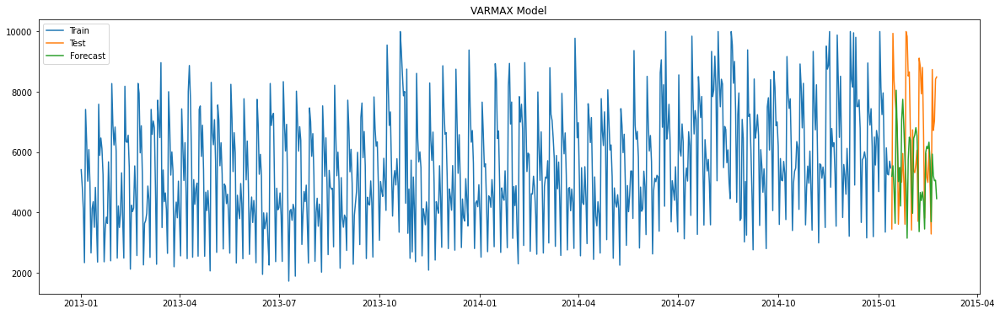

In [143]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[2].index.min(), end=test_store[2].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[2]["Sales"], label= "Train")
plt.plot(test_store[2]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [144]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[2]["Sales"], y_hat_varmax["Sales"][test_store[2].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[2]["Sales"]- y_hat_varmax["Sales"][test_store[2].index.min():])/test_store[2]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_8_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

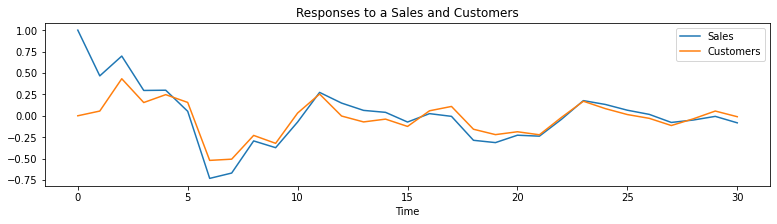

In [145]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 9

### 4.2 Standardize the train data

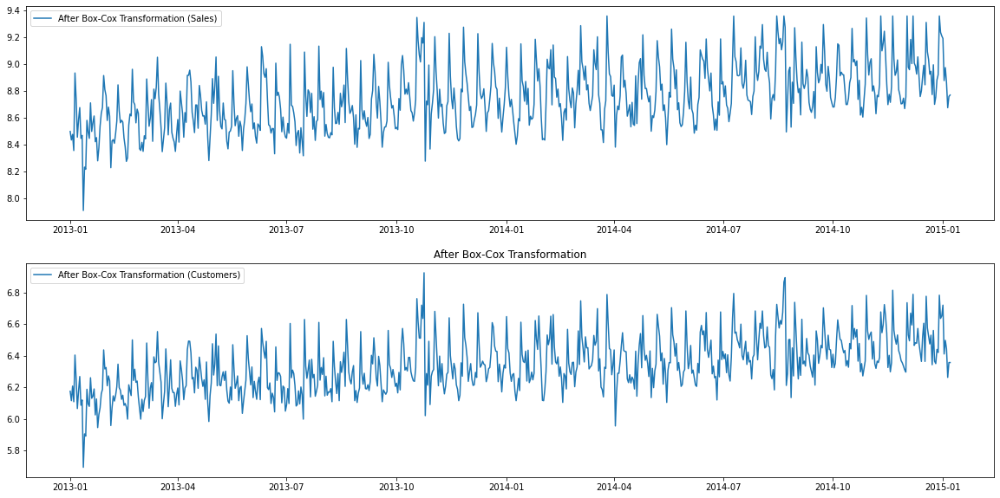

In [146]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[3]["Sales"], lmbda=0), index=train_store[3].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[3]["Customers"], lmbda=0), index=train_store[3].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [147]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -2.655
Critical value @ 0.01: -3.44
p-value: 0.082211


ADF Test for Customers
ADF Statistics: -3.171
Critical value @ 0.01: -3.44
p-value: 0.021749


In [148]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.993760
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 3.059050
Critical Values @ 0.05: 0.46
p-value: 0.010000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Sale Dataset is not Stationary
- Customer Dataset is Stationary

### 4.4 Differenciating to remove trend 

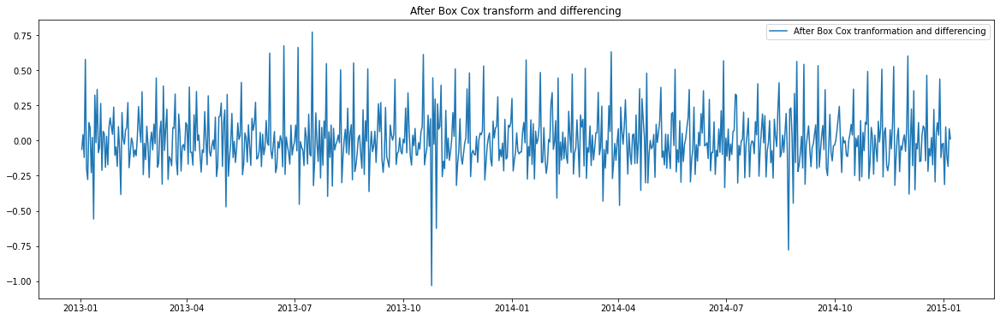

In [149]:
# Differenciating after boxcox transformation
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train_store[3].index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(20,6))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

### 4.5 Checking again for Stationarity

In [150]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox_diff["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox_diff["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -10.308
Critical value @ 0.01: -3.44
p-value: 0.000000


ADF Test for Customers
ADF Statistics: -10.074
Critical value @ 0.01: -3.44
p-value: 0.000000


In [151]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox_diff['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox_diff['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.019008
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.018735
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Now Data are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

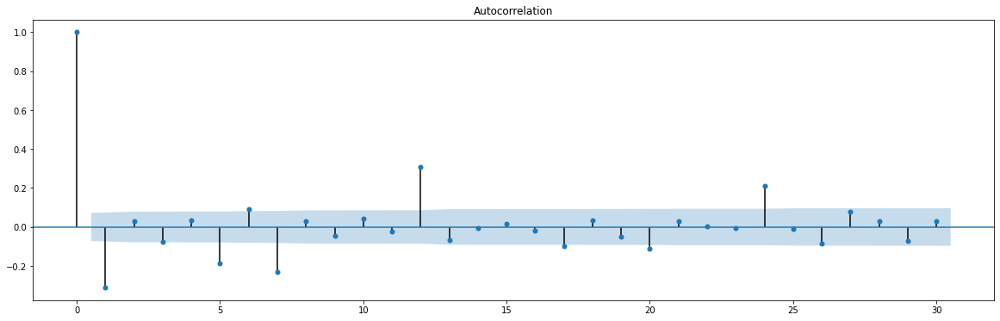

In [152]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox_diff["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

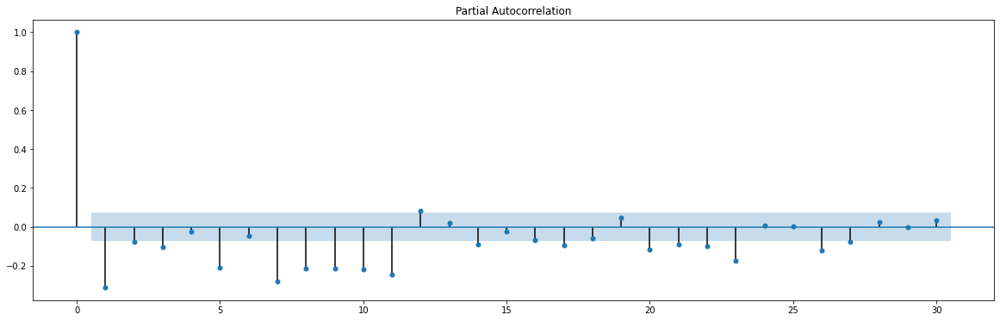

In [153]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [154]:
# Initializing Model
model_arima = ARIMA(train_boxcox_diff["Sales"], order=(9,0,5))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  736
Model:                     ARMA(9, 5)   Log Likelihood                 307.945
Method:                       css-mle   S.D. of innovations              0.159
Date:                Mon, 14 Feb 2022   AIC                           -583.890
Time:                        17:17:02   BIC                           -510.270
Sample:                    01-02-2013   HQIC                          -555.498
                         - 01-07-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0006        nan        nan        nan         nan         nan
ar.L1.Sales     0.6693      0.061     11.023      0.000       0.550       0.788
ar.L2.Sales    -1.0932      0.078    -14.069    

### 5.4 Recover the Orignal Time Serise

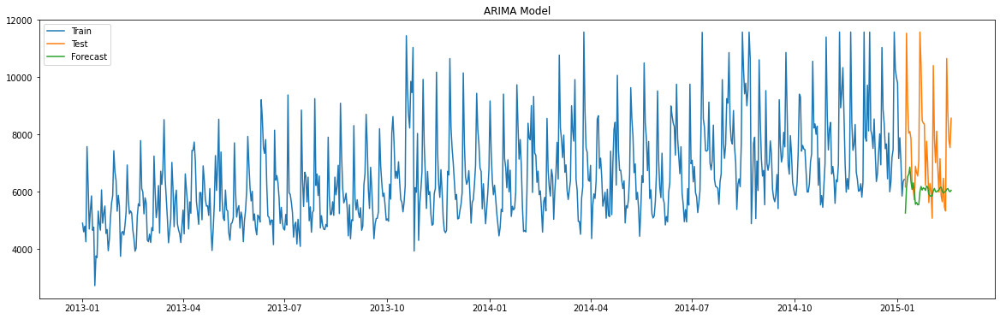

In [155]:
# Recovering
y_hat_arma = store_tsdf[3]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox_diff"] = model_arima_fit.predict(start= test_store[3].index.min(), end=test_store[3].index.max())
y_hat_arma["arma_forecast_boxcox"] = y_hat_arma["arma_forecast_boxcox_diff"].cumsum()
y_hat_arma["arma_forecast_boxcox"] = y_hat_arma["arma_forecast_boxcox"].add(train_boxcox["Sales"][0])
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[3]["Sales"], label= "Train")
plt.plot(test_store[3]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [156]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[3]["Sales"], y_hat_arma["arma_forecast"][test_store[3].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[3]["Sales"]- y_hat_arma["arma_forecast"][test_store[3].index.min():])/test_store[3]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_9_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [157]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(9,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                             VAR(9)   Log Likelihood                1555.414
                              + intercept   AIC                          -3028.829
Date:                    Mon, 14 Feb 2022   BIC                          -2840.178
Time:                            17:17:31   HQIC                         -2956.074
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               154.69, 38.15   Jarque-Bera (JB):        131.23, 10.43
Prob(Q):                        0.00, 0.55   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         0.94, 1.17   Skew:                       0.70, 0.03
P

### 5.7 Recover the Orignal Time Serise

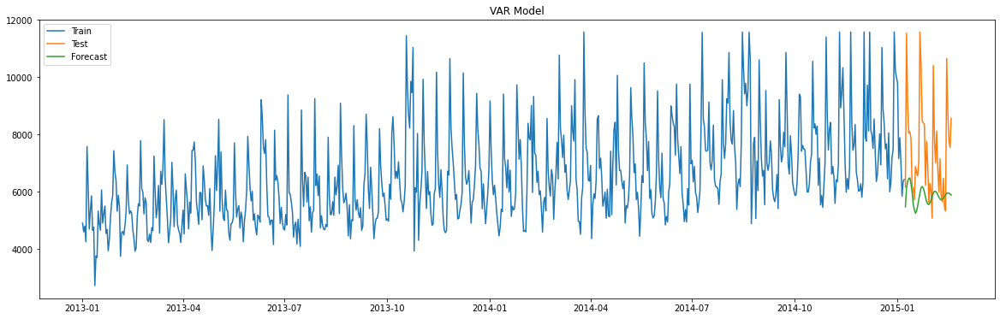

In [158]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[3].index.min(), end=test_store[3].index.max())
y_hat_var["Sales"] = y_hat_var["Sales"].cumsum()
y_hat_var["Sales"] = y_hat_var["Sales"].add(train_boxcox["Sales"][0])
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[3]["Sales"], label= "Train")
plt.plot(test_store[3]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [159]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[3]["Sales"], y_hat_var["Sales"][test_store[3].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[3]["Sales"]- y_hat_var["Sales"][test_store[3].index.min():])/test_store[3]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_9_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [160]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox_diff[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [161]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [162]:
# Creating VARMAX Model
exog = train_store[3]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(9,5), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                        VARMAX(9,5)   Log Likelihood                1598.773
                              + intercept   AIC                          -3071.545
Date:                    Mon, 14 Feb 2022   BIC                          -2781.668
Time:                            17:23:14   HQIC                         -2959.751
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               114.12, 26.43   Jarque-Bera (JB):         112.01, 5.81
Prob(Q):                        0.00, 0.95   Prob(JB):                   0.00, 0.05
Heteroskedasticity (H):         0.95, 1.17   Skew:                      0.74, -0.03
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


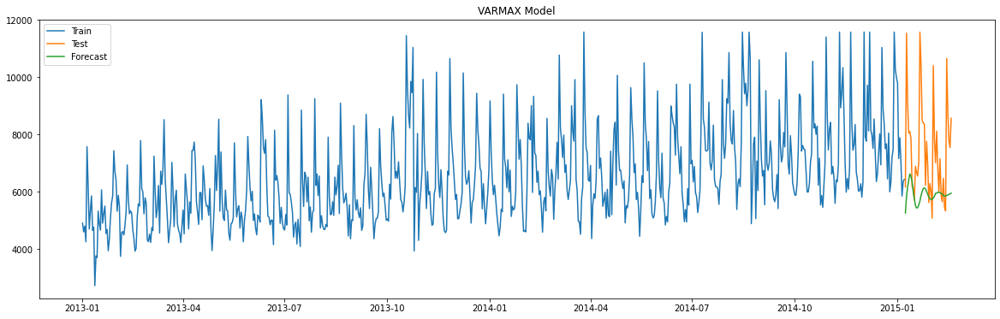

In [163]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[3].index.min(), end=test_store[3].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[3]["Sales"], label= "Train")
plt.plot(test_store[3]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [164]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[3]["Sales"], y_hat_varmax["Sales"][test_store[3].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[3]["Sales"]- y_hat_varmax["Sales"][test_store[3].index.min():])/test_store[3]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_9_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

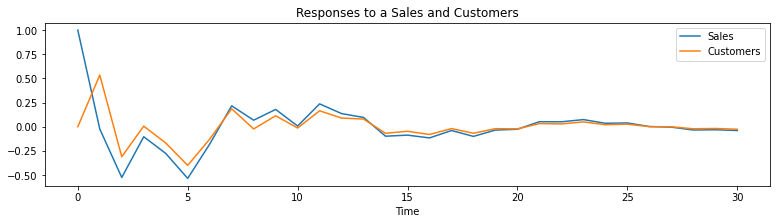

In [165]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [166]:
# Creating VARMAX Model
exog = train_store[3]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(9,5), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                        VARMAX(9,5)   Log Likelihood                1744.980
                              + intercept   AIC                          -3363.960
Date:                    Mon, 14 Feb 2022   BIC                          -3074.082
Time:                            17:31:21   HQIC                         -3252.166
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               149.01, 23.77   Jarque-Bera (JB):         17.77, 13.10
Prob(Q):                        0.00, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.00, 1.11   Skew:                     -0.06, -0.08
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


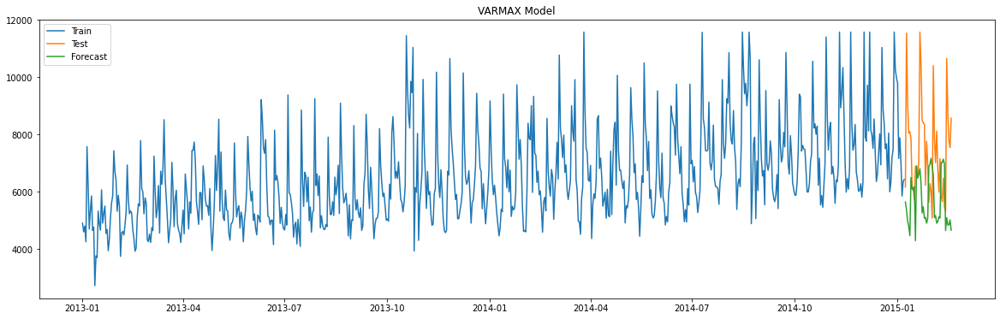

In [167]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[3].index.min(), end=test_store[3].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[3]["Sales"], label= "Train")
plt.plot(test_store[3]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [168]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[3]["Sales"], y_hat_varmax["Sales"][test_store[3].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[3]["Sales"]- y_hat_varmax["Sales"][test_store[3].index.min():])/test_store[3]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_9_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

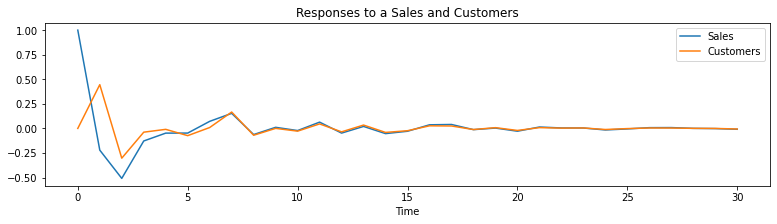

In [169]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [170]:
# Creating VARMAX Model
exog = train_store[3]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(9,5), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  736
Model:                        VARMAX(9,5)   Log Likelihood                1661.939
                              + intercept   AIC                          -3197.878
Date:                    Mon, 14 Feb 2022   BIC                          -2908.000
Time:                            17:37:55   HQIC                         -3086.084
Sample:                        01-02-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               207.22, 30.64   Jarque-Bera (JB):          0.55, 13.69
Prob(Q):                        0.00, 0.86   Prob(JB):                   0.76, 0.00
Heteroskedasticity (H):         0.92, 1.13   Skew:                     -0.03, -0.00
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


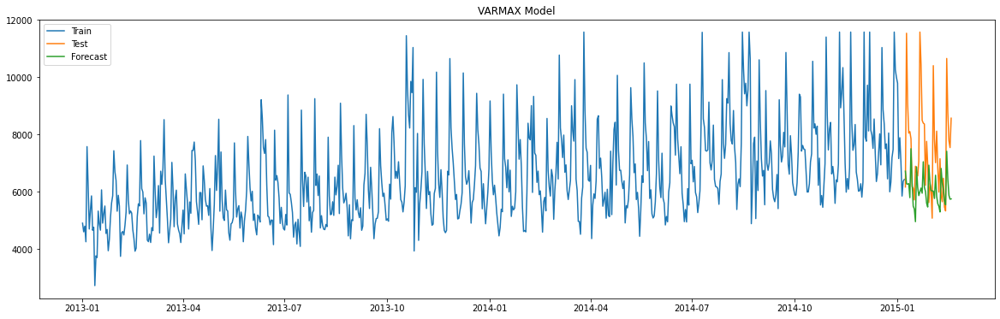

In [171]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[3].index.min(), end=test_store[3].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[3]["Sales"], label= "Train")
plt.plot(test_store[3]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [172]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[3]["Sales"], y_hat_varmax["Sales"][test_store[3].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[3]["Sales"]- y_hat_varmax["Sales"][test_store[3].index.min():])/test_store[3]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_9_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

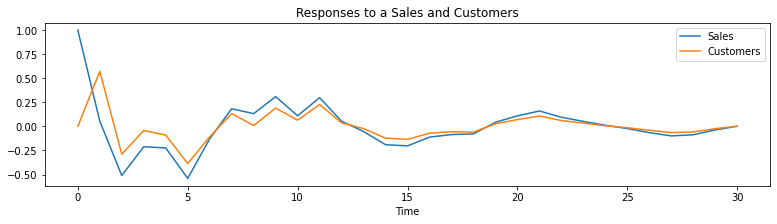

In [173]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 13

### 4.2 Standardize the train data

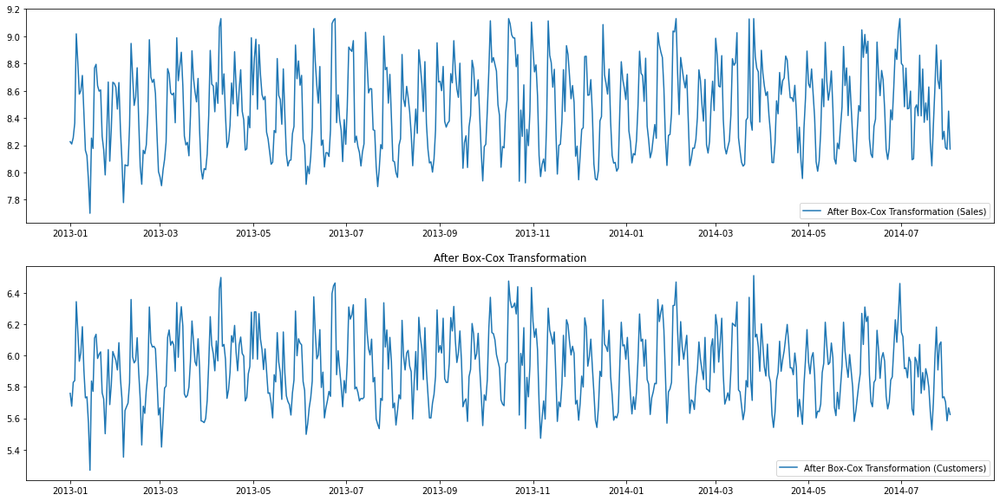

In [174]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[4]["Sales"], lmbda=0), index=train_store[4].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[4]["Customers"], lmbda=0), index=train_store[4].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [175]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -6.200
Critical value @ 0.01: -3.44
p-value: 0.000000


ADF Test for Customers
ADF Statistics: -5.613
Critical value @ 0.01: -3.44
p-value: 0.000001


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

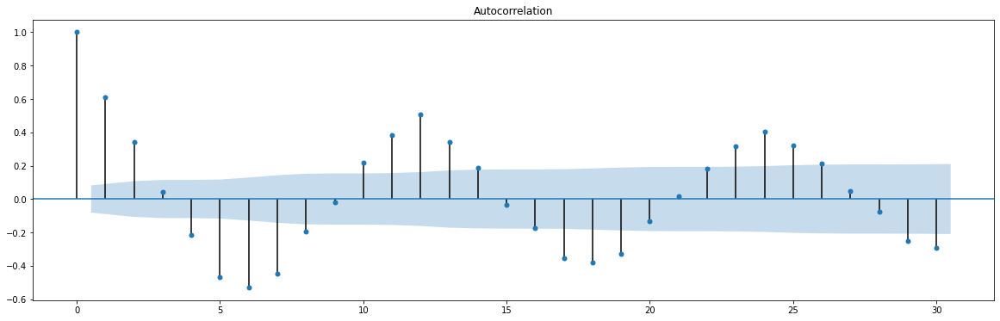

In [176]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

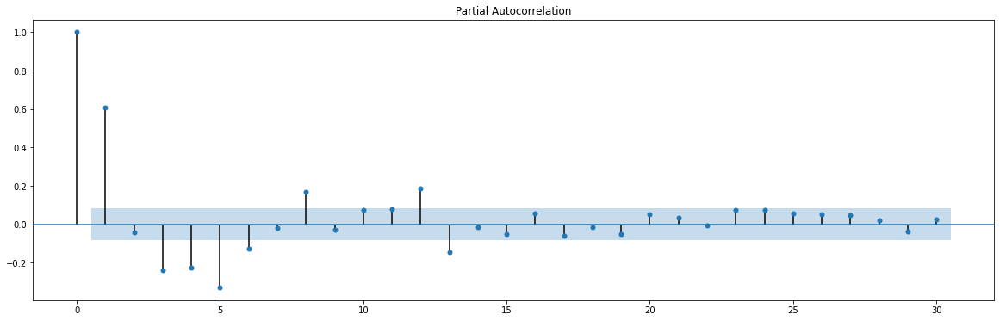

In [177]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [178]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(4,0,14))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  579
Model:                    ARMA(4, 14)   Log Likelihood                  90.134
Method:                       css-mle   S.D. of innovations              0.207
Date:                Mon, 14 Feb 2022   AIC                           -140.267
Time:                        17:39:00   BIC                            -53.041
Sample:                    01-01-2013   HQIC                          -106.258
                         - 08-02-2014                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            8.4701      0.016    534.946      0.000       8.439       8.501
ar.L1.Sales      1.9664      0.146     13.450      0.000       1.680       2.253
ar.L2.Sales     -0.8233      0.366     -2.25

### 5.4 Recover the Orignal Time Serise

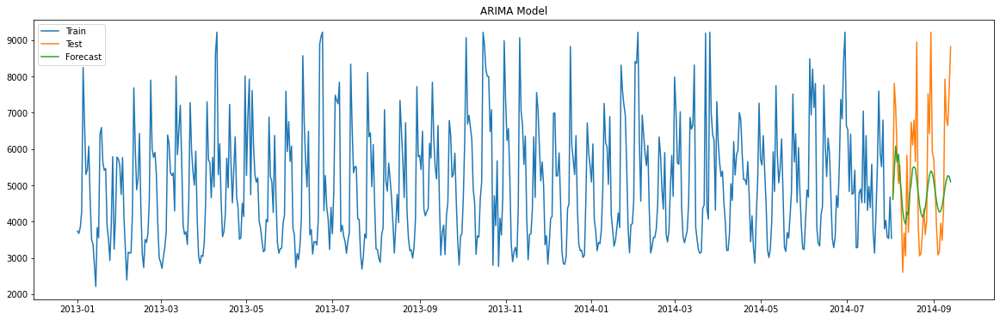

In [179]:
# Recovering
y_hat_arma = store_tsdf[4]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[4].index.min(), end=test_store[4].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[4]["Sales"], label= "Train")
plt.plot(test_store[4]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [180]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[4]["Sales"], y_hat_arma["arma_forecast"][test_store[4].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[4]["Sales"]- y_hat_arma["arma_forecast"][test_store[4].index.min():])/test_store[4]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_13_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [181]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(4,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                             VAR(4)   Log Likelihood                 863.570
                              + intercept   AIC                          -1685.140
Date:                    Mon, 14 Feb 2022   BIC                          -1593.553
Time:                            17:39:25   HQIC                         -1649.431
Sample:                        01-01-2013                                         
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              280.70, 122.48   Jarque-Bera (JB):         29.26, 24.94
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.92, 1.43   Skew:                      0.54, -0.35
P

### 5.7 Recover the Orignal Time Serise

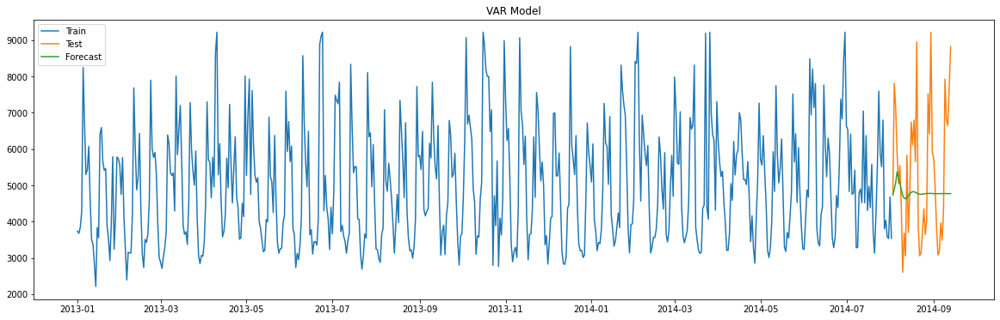

In [182]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[4].index.min(), end=test_store[4].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[4]["Sales"], label= "Train")
plt.plot(test_store[4]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [183]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[4]["Sales"], y_hat_var["Sales"][test_store[4].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[4]["Sales"]- y_hat_var["Sales"][test_store[4].index.min():])/test_store[4]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_13_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [184]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [185]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [186]:
# Creating VARMAX Model
exog = train_store[4]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(4,14), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(4,14)   Log Likelihood                 961.668
                              + intercept   AIC                          -1765.336
Date:                    Mon, 14 Feb 2022   BIC                          -1420.793
Time:                            17:49:56   HQIC                         -1630.999
Sample:                        01-01-2013                                         
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                56.26, 41.47   Jarque-Bera (JB):         17.78, 25.89
Prob(Q):                        0.05, 0.41   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.04, 1.55   Skew:                      0.37, -0.34
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


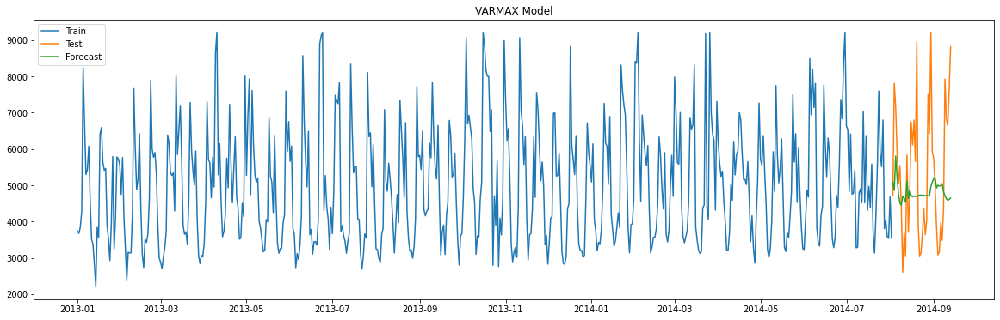

In [187]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[4].index.min(), end=test_store[4].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[4]["Sales"], label= "Train")
plt.plot(test_store[4]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [188]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[4]["Sales"], y_hat_varmax["Sales"][test_store[4].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[4]["Sales"]- y_hat_varmax["Sales"][test_store[4].index.min():])/test_store[4]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_13_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

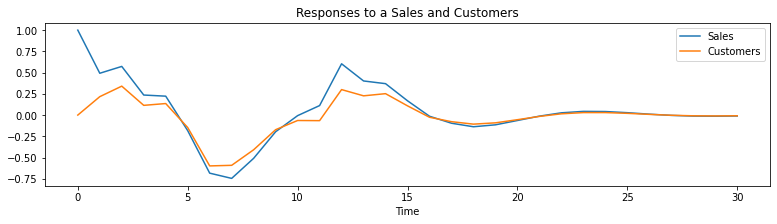

In [189]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [190]:
# Creating VARMAX Model
exog = train_store[4]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(4,14), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(4,14)   Log Likelihood                1099.998
                              + intercept   AIC                          -2041.997
Date:                    Mon, 14 Feb 2022   BIC                          -1697.454
Time:                            18:00:27   HQIC                         -1907.660
Sample:                        01-01-2013                                         
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                49.26, 38.29   Jarque-Bera (JB):          6.42, 55.09
Prob(Q):                        0.15, 0.55   Prob(JB):                   0.04, 0.00
Heteroskedasticity (H):         1.16, 1.68   Skew:                      0.25, -0.41
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


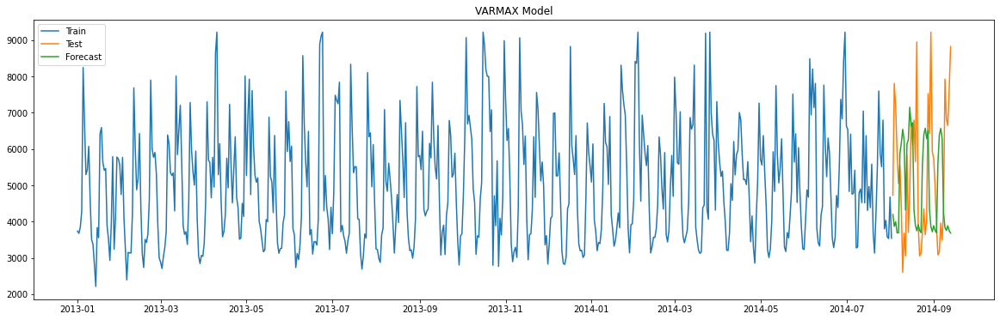

In [191]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[4].index.min(), end=test_store[4].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[4]["Sales"], label= "Train")
plt.plot(test_store[4]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [192]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[4]["Sales"], y_hat_varmax["Sales"][test_store[4].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[4]["Sales"]- y_hat_varmax["Sales"][test_store[4].index.min():])/test_store[4]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_13_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

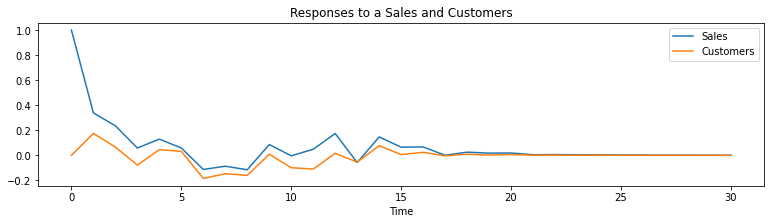

In [193]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [194]:
# Creating VARMAX Model
exog = train_store[4]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(4,14), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(4,14)   Log Likelihood                 966.825
                              + intercept   AIC                          -1775.651
Date:                    Mon, 14 Feb 2022   BIC                          -1431.108
Time:                            18:10:53   HQIC                         -1641.314
Sample:                        01-01-2013                                         
                             - 08-02-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                59.46, 39.70   Jarque-Bera (JB):          5.36, 38.17
Prob(Q):                        0.02, 0.48   Prob(JB):                   0.07, 0.00
Heteroskedasticity (H):         1.03, 1.64   Skew:                      0.21, -0.33
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


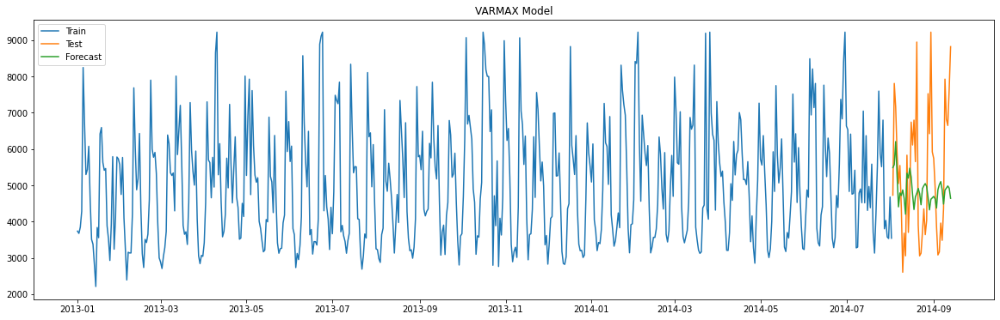

In [195]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[4].index.min(), end=test_store[4].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[4]["Sales"], label= "Train")
plt.plot(test_store[4]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [196]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[4]["Sales"], y_hat_varmax["Sales"][test_store[4].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[4]["Sales"]- y_hat_varmax["Sales"][test_store[4].index.min():])/test_store[4]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_13_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

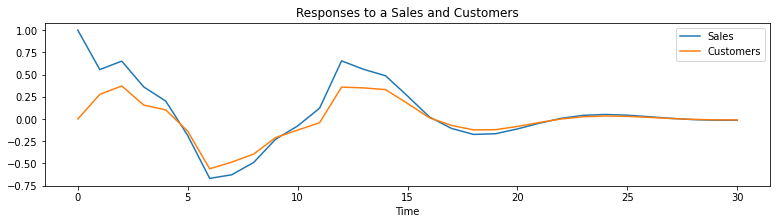

In [197]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 25

### 4.2 Standardize the train data

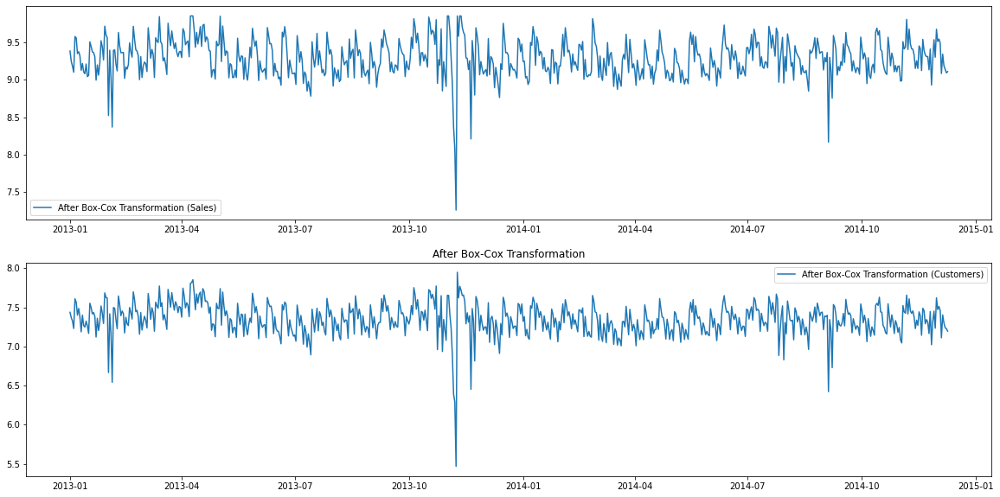

In [198]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[5]["Sales"], lmbda=0), index=train_store[5].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[5]["Customers"], lmbda=0), index=train_store[5].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [199]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -5.344
Critical value @ 0.01: -3.44
p-value: 0.000004


ADF Test for Customers
ADF Statistics: -4.605
Critical value @ 0.01: -3.44
p-value: 0.000127


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

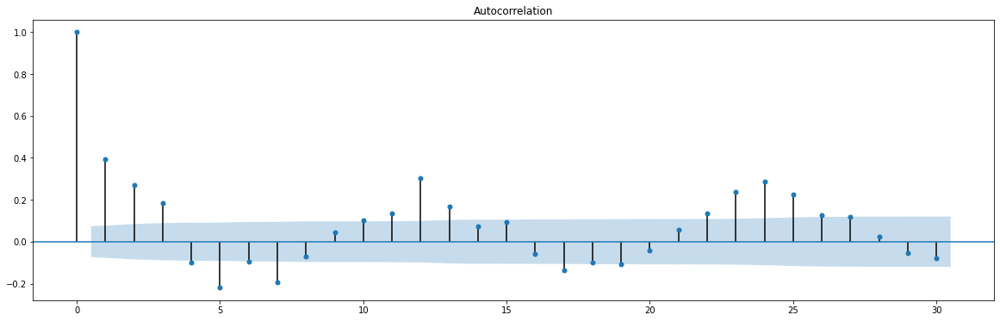

In [200]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

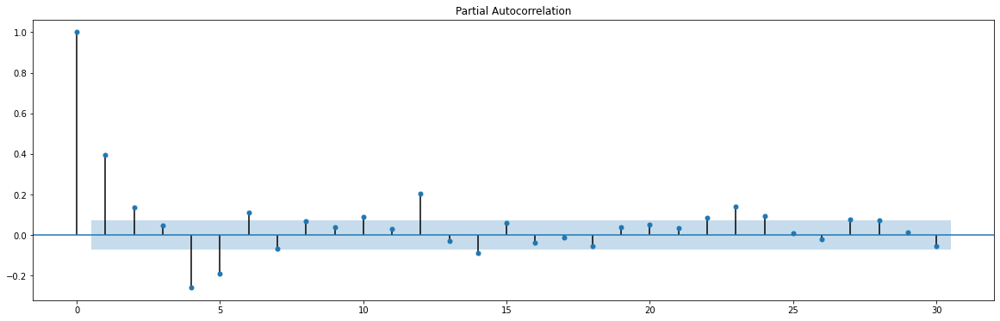

In [201]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [202]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(2,0,9))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  708
Model:                     ARMA(2, 9)   Log Likelihood                  76.773
Method:                       css-mle   S.D. of innovations              0.217
Date:                Mon, 14 Feb 2022   AIC                           -127.546
Time:                        18:11:05   BIC                            -68.234
Sample:                    01-01-2013   HQIC                          -104.630
                         - 12-09-2014                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           9.2907      0.013    725.490      0.000       9.266       9.316
ar.L1.Sales     0.9620      0.053     18.263      0.000       0.859       1.065
ar.L2.Sales    -0.9387      0.033    -28.279    

### 5.4 Recover the Orignal Time Serise

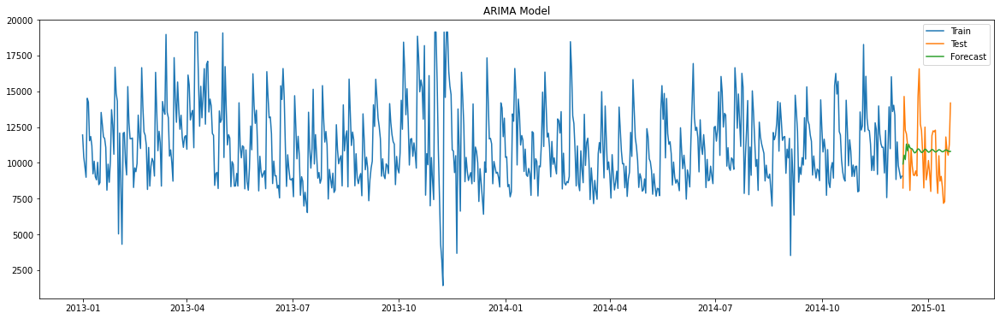

In [203]:
# Recovering
y_hat_arma = store_tsdf[5]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[5].index.min(), end=test_store[5].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[5]["Sales"], label= "Train")
plt.plot(test_store[5]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [204]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[5]["Sales"], y_hat_arma["arma_forecast"][test_store[5].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[5]["Sales"]- y_hat_arma["arma_forecast"][test_store[5].index.min():])/test_store[5]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_25_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [205]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                             VAR(2)   Log Likelihood                1240.072
                              + intercept   AIC                          -2454.145
Date:                    Mon, 14 Feb 2022   BIC                          -2394.833
Time:                            18:11:11   HQIC                         -2431.229
Sample:                        01-01-2013                                         
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              209.09, 105.59   Jarque-Bera (JB):      1171.68, 159.80
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.80, 1.34   Skew:                     -0.65, -0.48
P

### 5.7 Recover the Orignal Time Serise

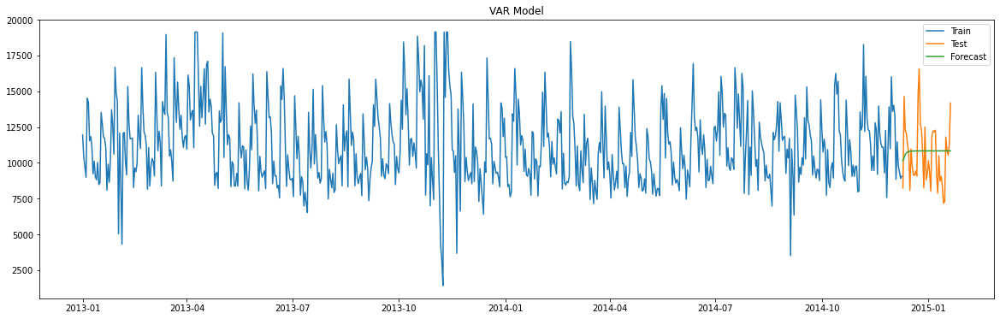

In [206]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[5].index.min(), end=test_store[5].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[5]["Sales"], label= "Train")
plt.plot(test_store[5]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [207]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[5]["Sales"], y_hat_var["Sales"][test_store[5].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[5]["Sales"]- y_hat_var["Sales"][test_store[5].index.min():])/test_store[5]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_25_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [208]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [209]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [210]:
# Creating VARMAX Model
exog = train_store[5]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,9), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                        VARMAX(2,9)   Log Likelihood                1324.764
                              + intercept   AIC                          -2547.528
Date:                    Mon, 14 Feb 2022   BIC                          -2314.844
Time:                            18:14:54   HQIC                         -2457.629
Sample:                        01-01-2013                                         
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                88.89, 84.15   Jarque-Bera (JB):      1183.08, 162.95
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.90, 1.29   Skew:                     -0.21, -0.52
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


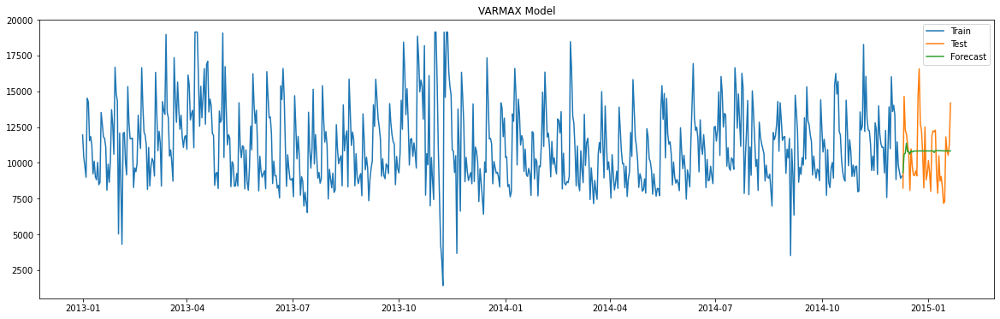

In [211]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[5].index.min(), end=test_store[5].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[5]["Sales"], label= "Train")
plt.plot(test_store[5]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [212]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[5]["Sales"], y_hat_varmax["Sales"][test_store[5].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[5]["Sales"]- y_hat_varmax["Sales"][test_store[5].index.min():])/test_store[5]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_25_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

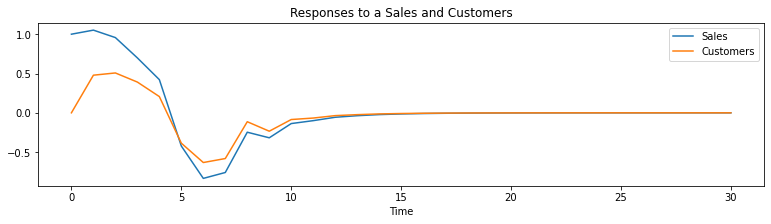

In [213]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [214]:
# Creating VARMAX Model
exog = train_store[5]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,9), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                        VARMAX(2,9)   Log Likelihood                1442.231
                              + intercept   AIC                          -2782.463
Date:                    Mon, 14 Feb 2022   BIC                          -2549.778
Time:                            18:20:09   HQIC                         -2692.564
Sample:                        01-01-2013                                         
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                65.50, 59.07   Jarque-Bera (JB):      4160.22, 104.37
Prob(Q):                        0.01, 0.03   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.96, 1.28   Skew:                     -0.03, -0.44
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


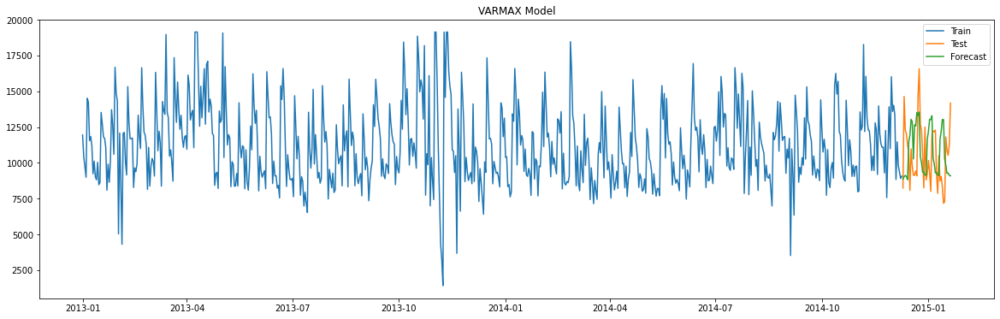

In [215]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[5].index.min(), end=test_store[5].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[5]["Sales"], label= "Train")
plt.plot(test_store[5]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [216]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[5]["Sales"], y_hat_varmax["Sales"][test_store[5].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[5]["Sales"]- y_hat_varmax["Sales"][test_store[5].index.min():])/test_store[5]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_25_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

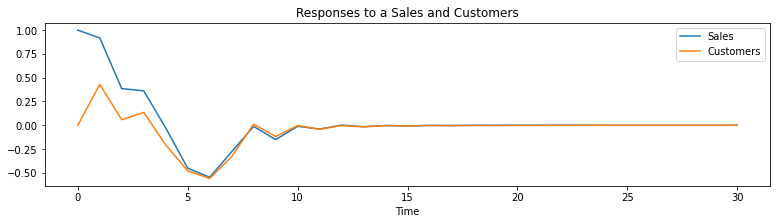

In [217]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [218]:
# Creating VARMAX Model
exog = train_store[5]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(2,9), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  708
Model:                        VARMAX(2,9)   Log Likelihood                1389.822
                              + intercept   AIC                          -2677.643
Date:                    Mon, 14 Feb 2022   BIC                          -2444.959
Time:                            18:21:32   HQIC                         -2587.744
Sample:                        01-01-2013                                         
                             - 12-09-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                73.73, 71.45   Jarque-Bera (JB):      3282.62, 364.85
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.92, 1.32   Skew:                     -0.09, -0.56
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


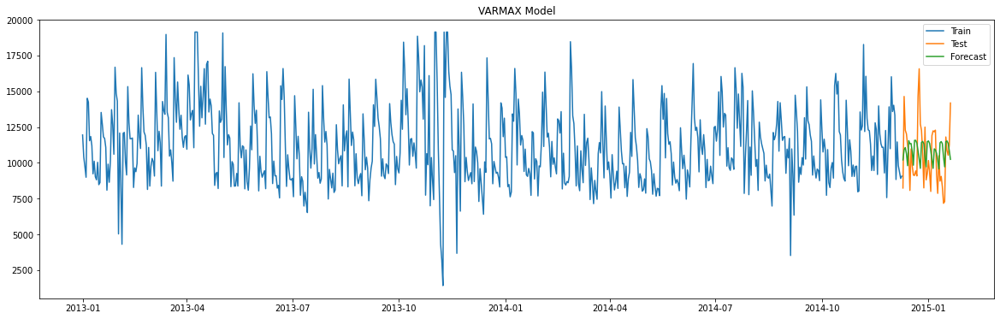

In [219]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[5].index.min(), end=test_store[5].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[5]["Sales"], label= "Train")
plt.plot(test_store[5]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [220]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[5]["Sales"], y_hat_varmax["Sales"][test_store[5].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[5]["Sales"]- y_hat_varmax["Sales"][test_store[5].index.min():])/test_store[5]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_25_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

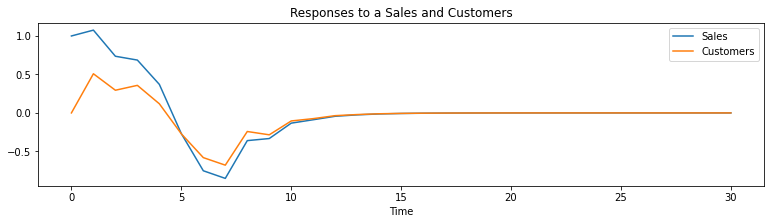

In [221]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 29

### 4.2 Standardize the train data

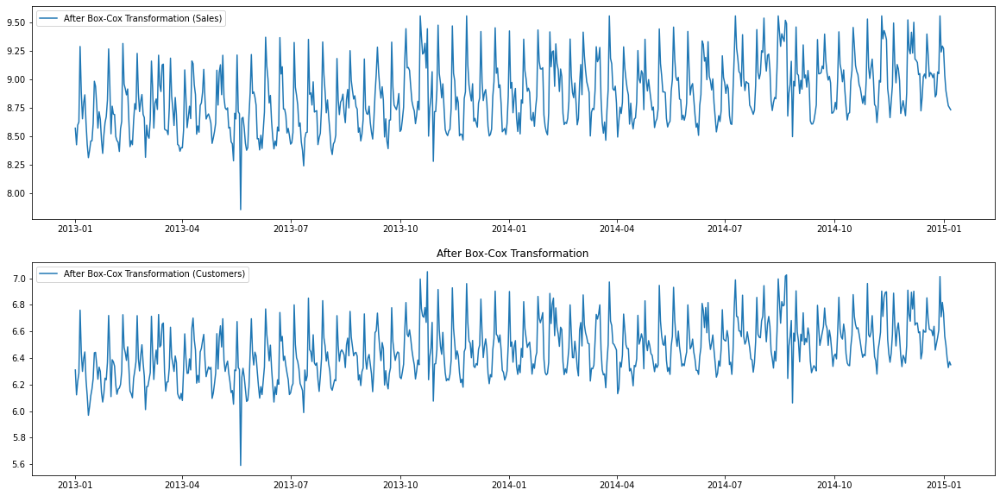

In [222]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[6]["Sales"], lmbda=0), index=train_store[6].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[6]["Customers"], lmbda=0), index=train_store[6].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [223]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -3.978
Critical value @ 0.01: -3.44
p-value: 0.001529


ADF Test for Customers
ADF Statistics: -3.659
Critical value @ 0.01: -3.44
p-value: 0.004732


In [224]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 2.795703
Critical Values @ 0.05: 0.46
p-value: 0.010000


KPSS test for Customers
KPSS Statistic: 2.827878
Critical Values @ 0.05: 0.46
p-value: 0.010000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

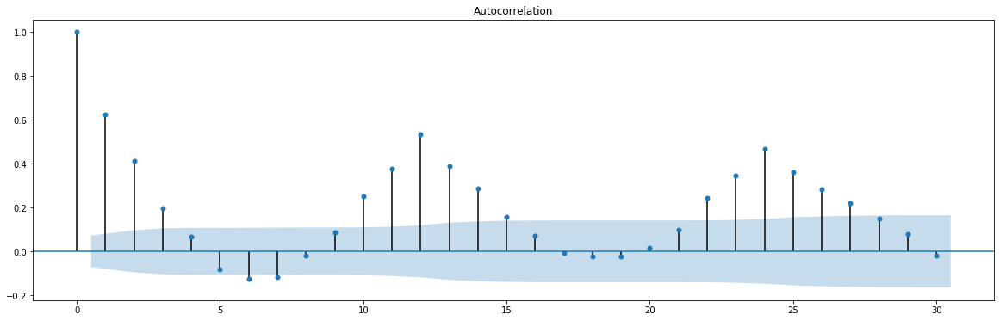

In [225]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

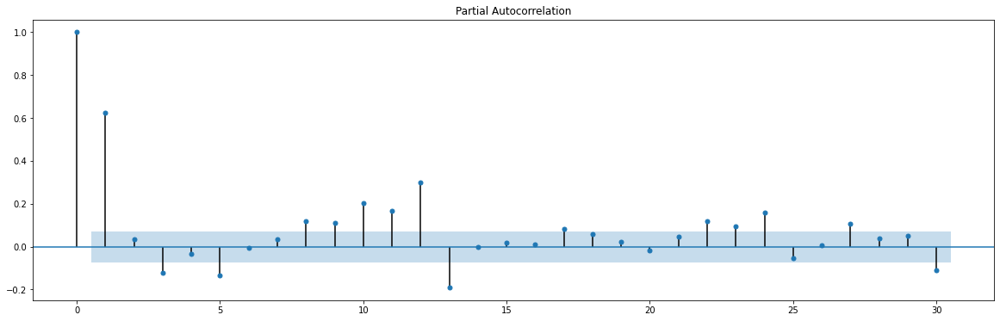

In [226]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [227]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(3,0,12))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  737
Model:                    ARMA(3, 12)   Log Likelihood                 146.078
Method:                       css-mle   S.D. of innovations              0.198
Date:                Mon, 14 Feb 2022   AIC                           -258.156
Time:                        18:21:56   BIC                           -179.913
Sample:                    01-01-2013   HQIC                          -227.983
                         - 01-07-2015                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            8.8564      0.021    412.733      0.000       8.814       8.898
ar.L1.Sales      0.6300      0.117      5.398      0.000       0.401       0.859
ar.L2.Sales      0.1541      0.168      0.91

### 5.4 Recover the Orignal Time Serise

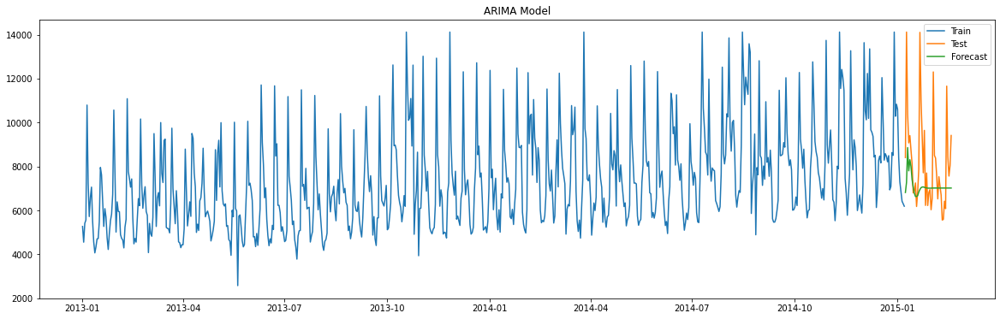

In [228]:
# Recovering
y_hat_arma = store_tsdf[6]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[6].index.min(), end=test_store[6].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[6]["Sales"], label= "Train")
plt.plot(test_store[6]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [229]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[6]["Sales"], y_hat_arma["arma_forecast"][test_store[6].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[6]["Sales"]- y_hat_arma["arma_forecast"][test_store[6].index.min():])/test_store[6]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_29_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [230]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3,0), trend='n')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                             VAR(3)   Log Likelihood                1329.707
Date:                    Mon, 14 Feb 2022   AIC                          -2629.414
Time:                            18:22:07   BIC                          -2560.376
Sample:                        01-01-2013   HQIC                         -2602.791
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               415.73, 93.89   Jarque-Bera (JB):        193.50, 11.80
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.80, 1.03   Skew:                      0.85, -0.14
Prob(H) (two-sided):            0.08, 0.84   Kurtosis:                   4.84, 3.55


### 5.7 Recover the Orignal Time Serise

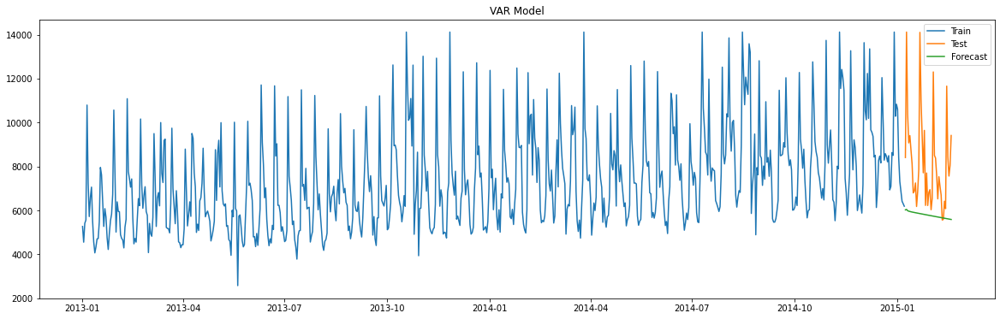

In [231]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[6].index.min(), end=test_store[6].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[6]["Sales"], label= "Train")
plt.plot(test_store[6]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [232]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[6]["Sales"], y_hat_var["Sales"][test_store[6].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[6]["Sales"]- y_hat_var["Sales"][test_store[6].index.min():])/test_store[6]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_29_VAR'], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [233]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [234]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [235]:
# Creating VARMAX Model
exog = train_store[6]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3, 12), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                       VARMAX(3,12)   Log Likelihood                1517.168
                              + intercept   AIC                          -2900.337
Date:                    Mon, 14 Feb 2022   BIC                          -2591.963
Time:                            18:26:05   HQIC                         -2781.417
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               116.89, 32.24   Jarque-Bera (JB):         73.81, 18.29
Prob(Q):                        0.00, 0.80   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.83, 1.09   Skew:                      0.42, -0.12
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


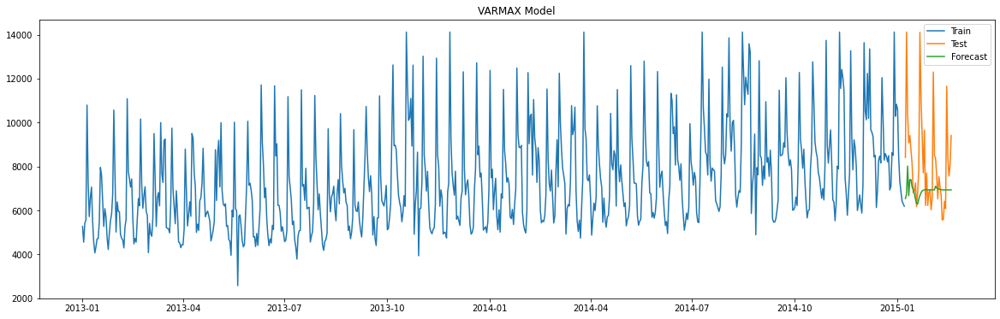

In [236]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[6].index.min(), end=test_store[6].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[6]["Sales"], label= "Train")
plt.plot(test_store[6]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [237]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[6]["Sales"], y_hat_varmax["Sales"][test_store[6].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[6]["Sales"]- y_hat_varmax["Sales"][test_store[6].index.min():])/test_store[6]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_29_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

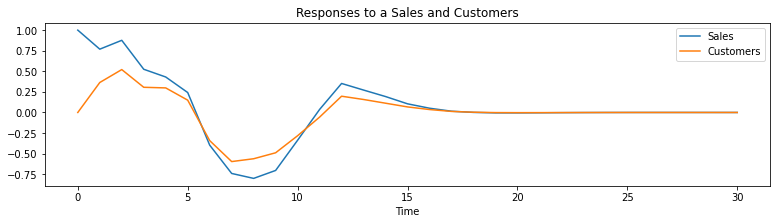

In [238]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [239]:
# Creating VARMAX Model
exog = train_store[6]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3, 12), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                       VARMAX(3,12)   Log Likelihood                1589.808
                              + intercept   AIC                          -3045.617
Date:                    Mon, 14 Feb 2022   BIC                          -2737.243
Time:                            18:36:02   HQIC                         -2926.697
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               146.09, 24.20   Jarque-Bera (JB):         45.86, 12.58
Prob(Q):                        0.00, 0.98   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.87, 1.03   Skew:                      0.11, -0.13
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


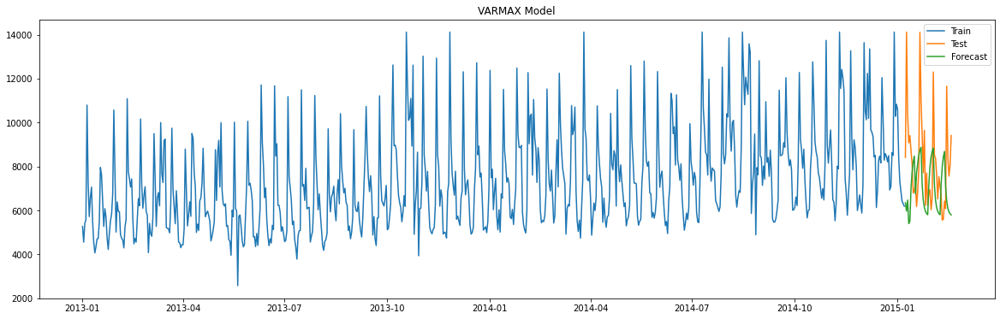

In [240]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[6].index.min(), end=test_store[6].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[6]["Sales"], label= "Train")
plt.plot(test_store[6]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [241]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[6]["Sales"], y_hat_varmax["Sales"][test_store[6].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[6]["Sales"]- y_hat_varmax["Sales"][test_store[6].index.min():])/test_store[6]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_29_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

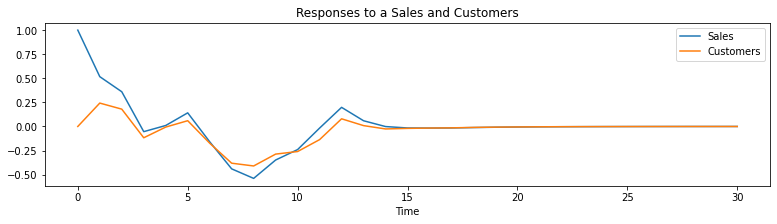

In [242]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)

In [243]:
# Creating VARMAX Model
exog = train_store[6]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3, 12), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  737
Model:                       VARMAX(3,12)   Log Likelihood                1527.900
                              + intercept   AIC                          -2921.799
Date:                    Mon, 14 Feb 2022   BIC                          -2613.426
Time:                            18:42:14   HQIC                         -2802.880
Sample:                        01-01-2013                                         
                             - 01-07-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               146.21, 29.62   Jarque-Bera (JB):         32.19, 16.60
Prob(Q):                        0.00, 0.89   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.82, 1.11   Skew:                      0.17, -0.08
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


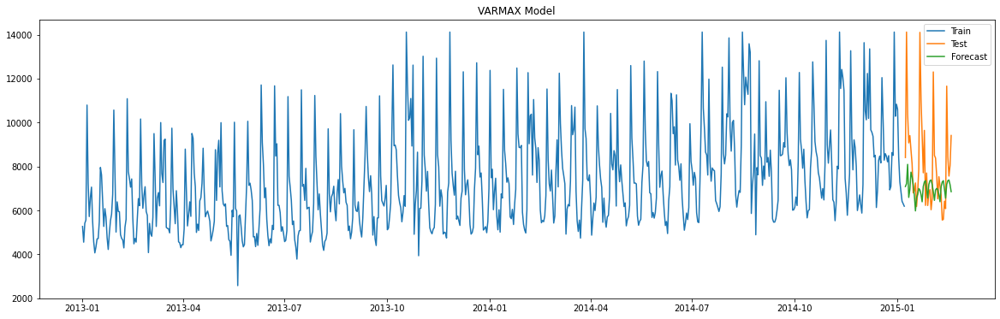

In [244]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[6].index.min(), end=test_store[6].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[6]["Sales"], label= "Train")
plt.plot(test_store[6]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [245]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[6]["Sales"], y_hat_varmax["Sales"][test_store[6].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[6]["Sales"]- y_hat_varmax["Sales"][test_store[6].index.min():])/test_store[6]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_29_VARMAX_Day_of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

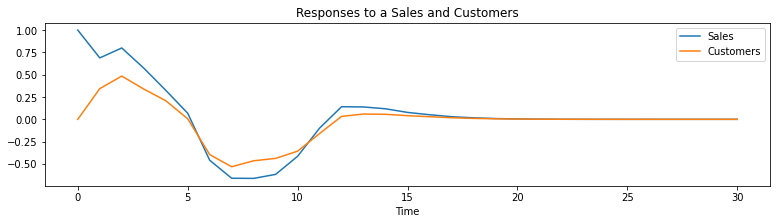

In [246]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 31

### 4.2 Standardize the train data

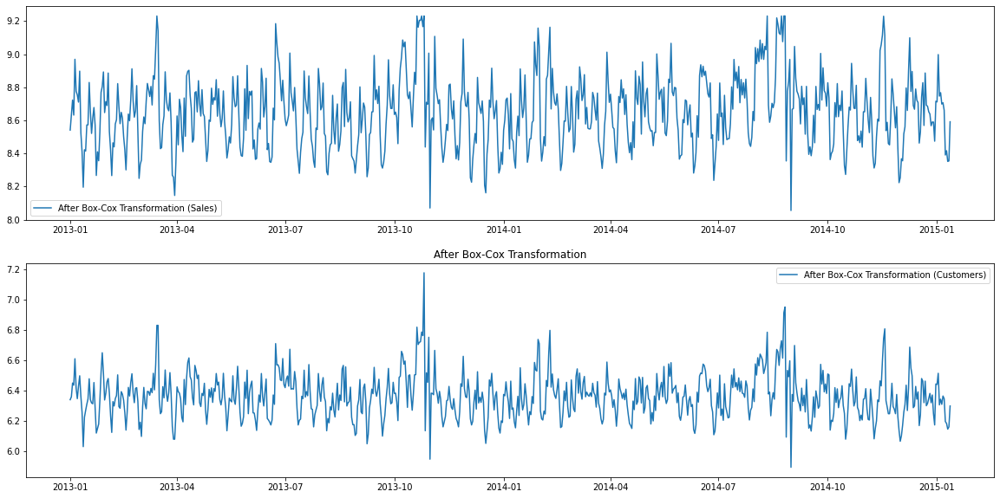

In [247]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[7]["Sales"], lmbda=0), index=train_store[7].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[7]["Customers"], lmbda=0), index=train_store[7].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [248]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -6.019
Critical value @ 0.01: -3.44
p-value: 0.000000


ADF Test for Customers
ADF Statistics: -6.240
Critical value @ 0.01: -3.44
p-value: 0.000000


##### Conclusion 
- Train Series are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

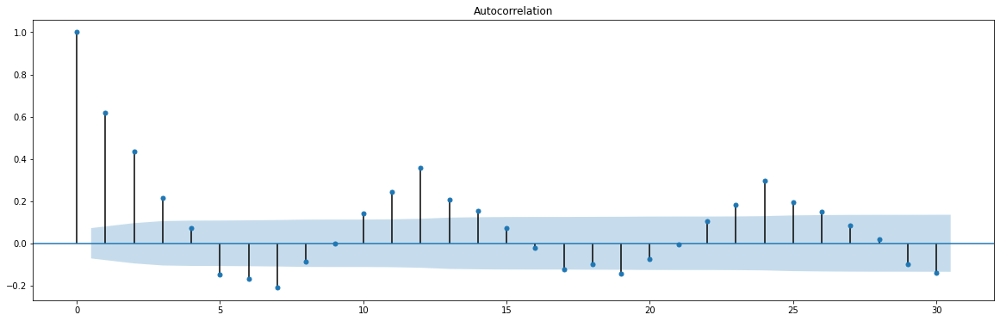

In [249]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

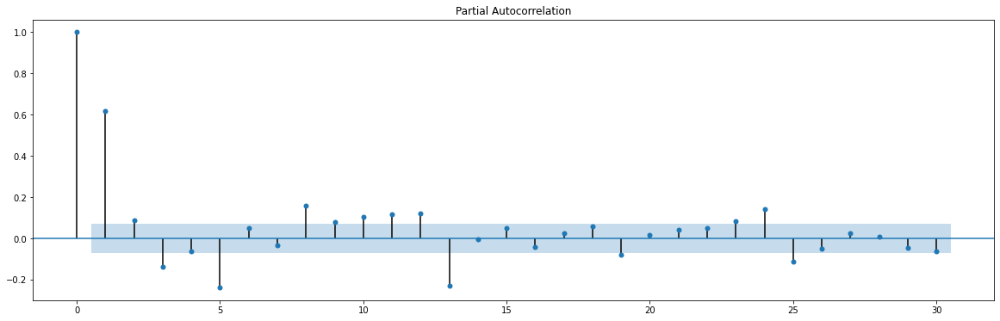

In [250]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [251]:
# Initializing Model
model_arima = ARIMA(train_boxcox["Sales"], order=(3,0,8))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  742
Model:                     ARMA(3, 8)   Log Likelihood                 333.079
Method:                       css-mle   S.D. of innovations              0.154
Date:                Mon, 14 Feb 2022   AIC                           -640.159
Time:                        18:42:24   BIC                           -580.237
Sample:                    01-01-2013   HQIC                          -617.058
                         - 01-12-2015                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.6516      0.013    682.446      0.000       8.627       8.676
ar.L1.Sales     0.7537      0.024     31.632      0.000       0.707       0.800
ar.L2.Sales     0.6832      0.032     21.204    

### 5.4 Recover the Orignal Time Serise

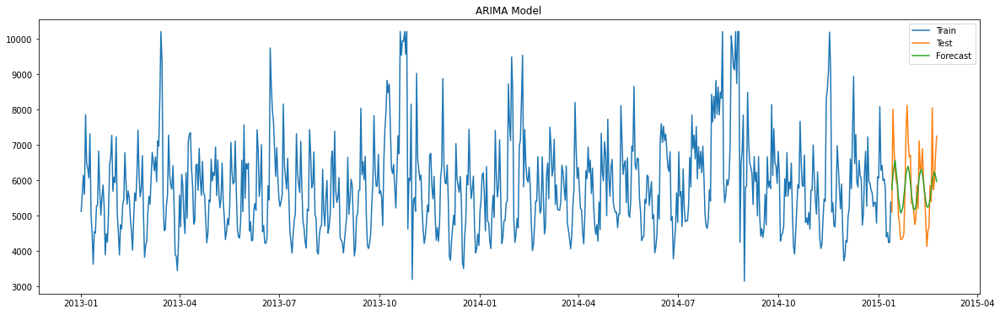

In [252]:
# Recovering
y_hat_arma = store_tsdf[7]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox"] = model_arima_fit.predict(start= test_store[7].index.min(), end=test_store[7].index.max())
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[7]["Sales"], label= "Train")
plt.plot(test_store[7]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [253]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[7]["Sales"], y_hat_arma["arma_forecast"][test_store[7].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[7]["Sales"]- y_hat_arma["arma_forecast"][test_store[7].index.min():])/test_store[7]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_31_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [254]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3,0), trend='c')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                             VAR(3)   Log Likelihood                1424.656
                              + intercept   AIC                          -2815.312
Date:                    Mon, 14 Feb 2022   BIC                          -2736.953
Time:                            18:42:36   HQIC                         -2785.104
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              308.21, 118.26   Jarque-Bera (JB):       39.21, 1038.45
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.15, 0.97   Skew:                       0.05, 0.69
P

### 5.7 Recover the Orignal Time Serise

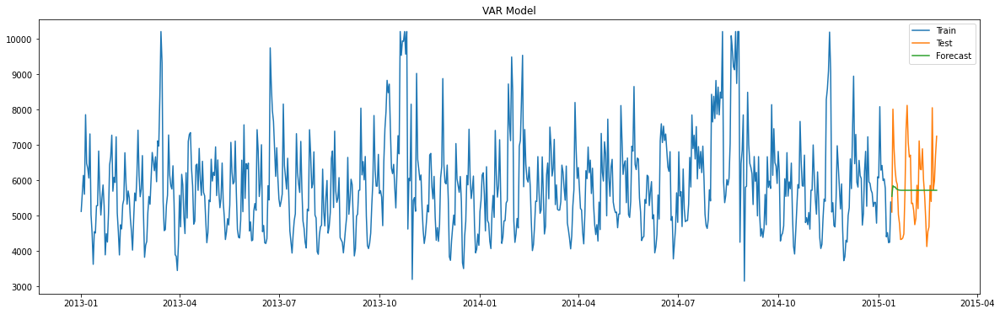

In [255]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[7].index.min(), end=test_store[7].index.max())
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[7]["Sales"], label= "Train")
plt.plot(test_store[7]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [256]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[7]["Sales"], y_hat_var["Sales"][test_store[7].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[7]["Sales"]- y_hat_var["Sales"][test_store[7].index.min():])/test_store[7]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_31_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [257]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [258]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [259]:
# Creating VARMAX Model
exog = train_store[7]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3,8), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(3,8)   Log Likelihood                1498.827
                              + intercept   AIC                          -2895.653
Date:                    Mon, 14 Feb 2022   BIC                          -2660.576
Time:                            18:45:08   HQIC                         -2805.028
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               166.41, 77.58   Jarque-Bera (JB):        33.82, 938.48
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.13, 0.99   Skew:                       0.11, 0.63
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


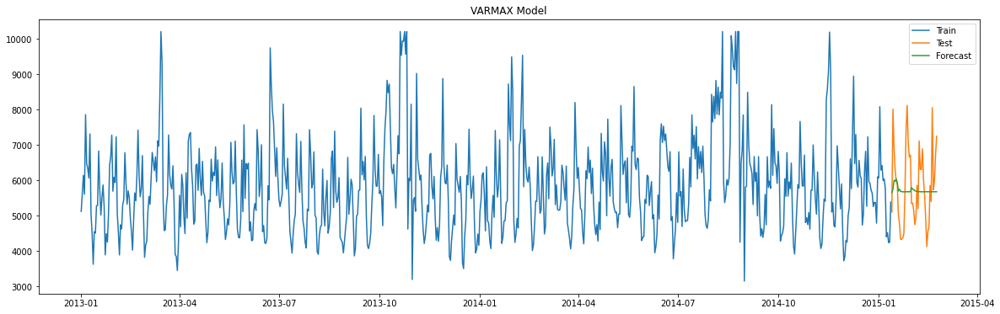

In [260]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[7].index.min(), end=test_store[7].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[7]["Sales"], label= "Train")
plt.plot(test_store[7]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [261]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[7]["Sales"], y_hat_varmax["Sales"][test_store[7].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[7]["Sales"]- y_hat_varmax["Sales"][test_store[7].index.min():])/test_store[7]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_31_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

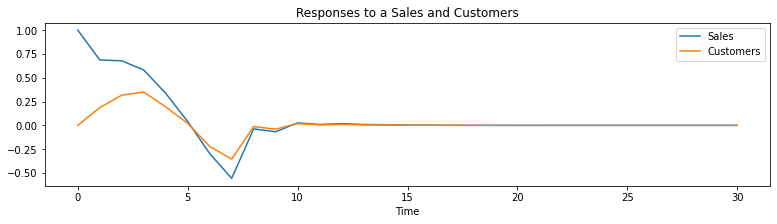

In [262]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [263]:
# Creating VARMAX Model
exog = train_store[7]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3,8), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(3,8)   Log Likelihood                1624.639
                              + intercept   AIC                          -3147.278
Date:                    Mon, 14 Feb 2022   BIC                          -2912.201
Time:                            18:47:19   HQIC                         -3056.653
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               173.20, 72.18   Jarque-Bera (JB):         7.35, 849.93
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.03, 0.00
Heteroskedasticity (H):         1.21, 0.91   Skew:                      -0.08, 0.63
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


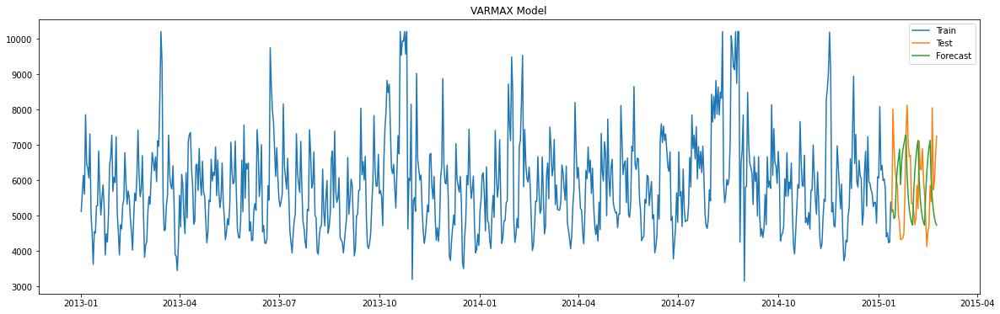

In [264]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[7].index.min(), end=test_store[7].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[7]["Sales"], label= "Train")
plt.plot(test_store[7]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [265]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[7]["Sales"], y_hat_varmax["Sales"][test_store[7].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[7]["Sales"]- y_hat_varmax["Sales"][test_store[7].index.min():])/test_store[7]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_31_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

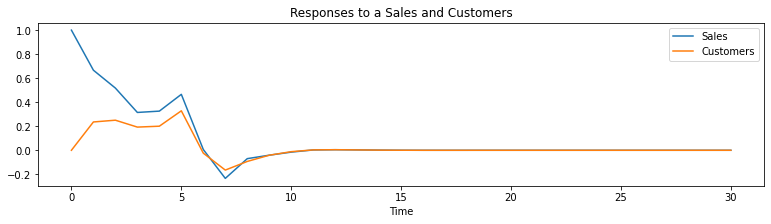

In [266]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [267]:
# Creating VARMAX Model
exog = train_store[7]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox[["Sales", "Customers"]], order=(3,8), exog=exog )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  742
Model:                        VARMAX(3,8)   Log Likelihood                1531.332
                              + intercept   AIC                          -2960.664
Date:                    Mon, 14 Feb 2022   BIC                          -2725.587
Time:                            18:50:58   HQIC                         -2870.039
Sample:                        01-01-2013                                         
                             - 01-12-2015                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):               184.17, 63.14   Jarque-Bera (JB):       25.22, 2064.93
Prob(Q):                        0.00, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.14, 1.05   Skew:                       0.13, 0.96
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


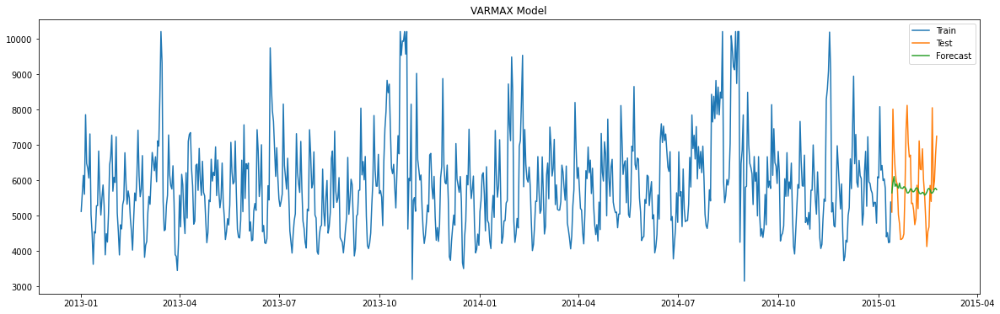

In [268]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[7].index.min(), end=test_store[7].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[7]["Sales"], label= "Train")
plt.plot(test_store[7]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [269]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[7]["Sales"], y_hat_varmax["Sales"][test_store[7].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[7]["Sales"]- y_hat_varmax["Sales"][test_store[7].index.min():])/test_store[7]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_31_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Impulse Response Graph 

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

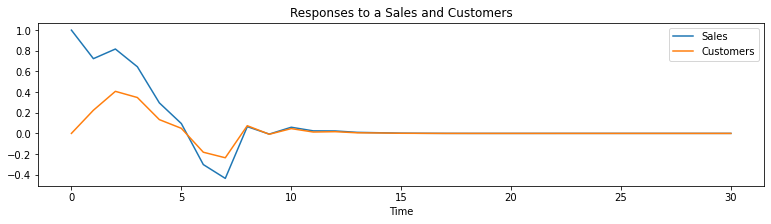

In [270]:
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

# Store - 46

### 4.2 Standardize the train data

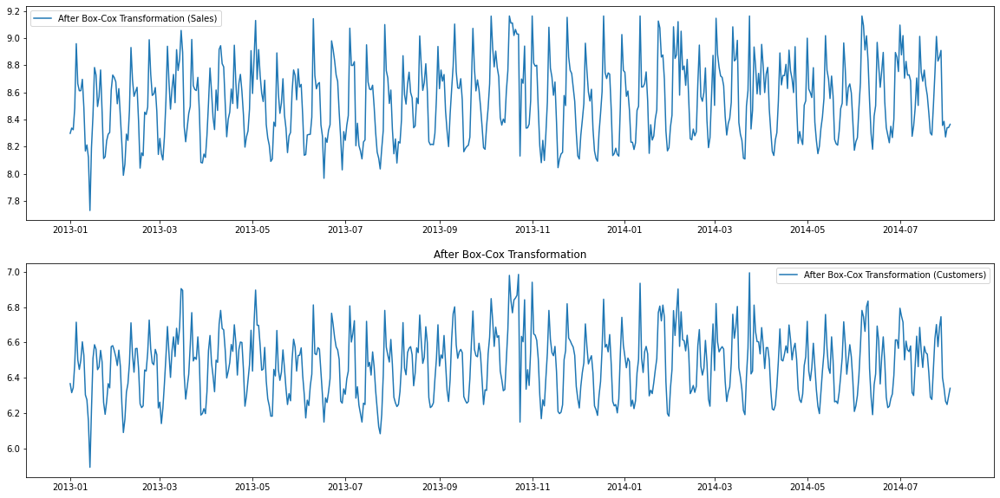

In [271]:
# Boxcox Transformation
train_boxcox = pd.DataFrame(boxcox(train_store[8]["Sales"], lmbda=0), index=train_store[8].index, columns=["Sales"])
train_boxcox["Customers"] = pd.Series(boxcox(train_store[8]["Customers"], lmbda=0), index=train_store[8].index)

# Plotting Graph
plt.figure(figsize=(20,10))
plt.subplot(2,1,1)
plt.plot(train_boxcox["Sales"], label = "After Box-Cox Transformation (Sales)")
plt.legend(loc='best')
plt.subplot(2,1,2)
plt.plot(train_boxcox["Customers"], label = "After Box-Cox Transformation (Customers)")
plt.legend(loc='best')
plt.title("After Box-Cox Transformation")
plt.show()

### 4.3 Checking for Stationarity

In [272]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -5.364
Critical value @ 0.01: -3.44
p-value: 0.000004


ADF Test for Customers
ADF Statistics: -5.286
Critical value @ 0.01: -3.44
p-value: 0.000006


In [273]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

kpss_test = kpss(train_boxcox['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

kpss_test = kpss(train_boxcox['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.604493
Critical Values @ 0.05: 0.46
p-value: 0.022228


KPSS test for Customers
KPSS Statistic: 0.256748
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Sale Dataset is not stationary

### 4.4 Defferenciating to remove Trend

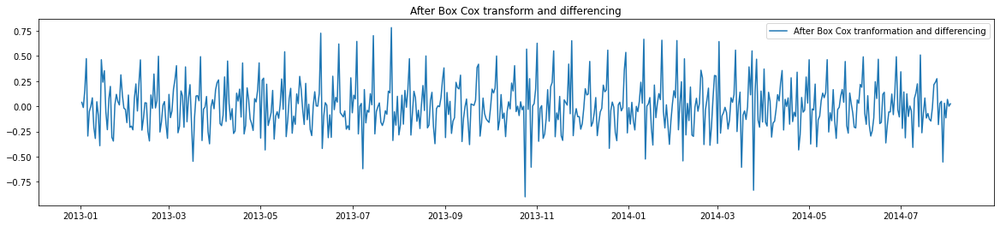

In [274]:
train_boxcox_diff = pd.DataFrame(pd.Series(train_boxcox['Sales'] - train_boxcox['Sales'].shift(), train_store[8].index))
train_boxcox_diff['Sales'] = train_boxcox_diff
train_boxcox_diff['Customers'] = train_boxcox['Customers'] - train_boxcox['Customers'].shift()
train_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(20,4))
plt.plot(train_boxcox_diff['Sales'], label='After Box Cox tranformation and differencing')
plt.legend(loc='best')
plt.title('After Box Cox transform and differencing')
plt.show()

### 4.5 Checking Again Stationary Test

In [275]:
# ADFuller Test

# For Sales
adf_test = adfuller(train_boxcox_diff["Sales"])

print("ADF Test for Sales")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])
print("\n")

# For Customer
adf_test = adfuller(train_boxcox_diff["Customers"])

print("ADF Test for Customers")
print("ADF Statistics: %.3f" % adf_test[0])
print('Critical value @ 0.01: %.2f' % adf_test[4]['1%'])
print('p-value: %f' % adf_test[1])

ADF Test for Sales
ADF Statistics: -10.885
Critical value @ 0.01: -3.44
p-value: 0.000000


ADF Test for Customers
ADF Statistics: -10.430
Critical value @ 0.01: -3.44
p-value: 0.000000


In [276]:
# Kwiatkowski-Phillips-Schmidt-Shin (KPSS) test

# For Sales
kpss_test = kpss(train_boxcox_diff['Sales'])

print("KPSS test for Sales")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

# For Customers
kpss_test = kpss(train_boxcox_diff['Customers'])

print("\n")
print("KPSS test for Customers")
print('KPSS Statistic: %f' % kpss_test[0])
print('Critical Values @ 0.05: %.2f' % kpss_test[3]['5%'])
print('p-value: %f' % kpss_test[1])

KPSS test for Sales
KPSS Statistic: 0.023582
Critical Values @ 0.05: 0.46
p-value: 0.100000


KPSS test for Customers
KPSS Statistic: 0.022305
Critical Values @ 0.05: 0.46
p-value: 0.100000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-value is greater than the indicated p-value
  warn("p-value is greater than the indicated p-value", InterpolationWarning)


##### Conclusion 
- Now Dataset are Stationary

## 5. Model Building

### 5.1 Auto Correlation Function (ACF)

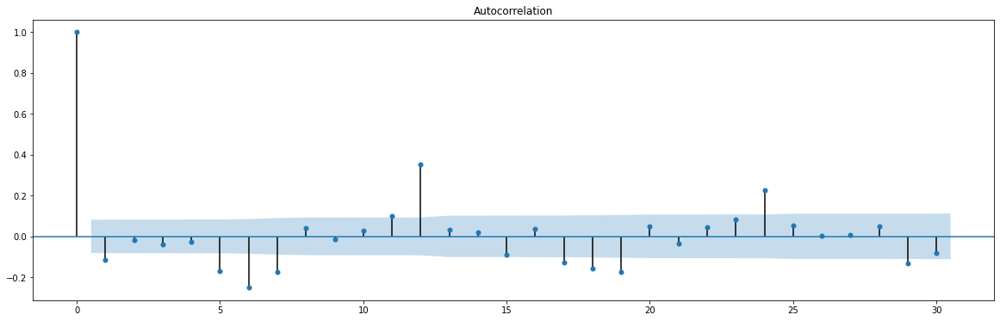

In [277]:
plt.figure(figsize=(20,6))
plot_acf(train_boxcox_diff["Sales"], ax=plt.gca(), lags=30 )
plt.show()

### 5.2 Partial Auto Correlation Function (PACF)

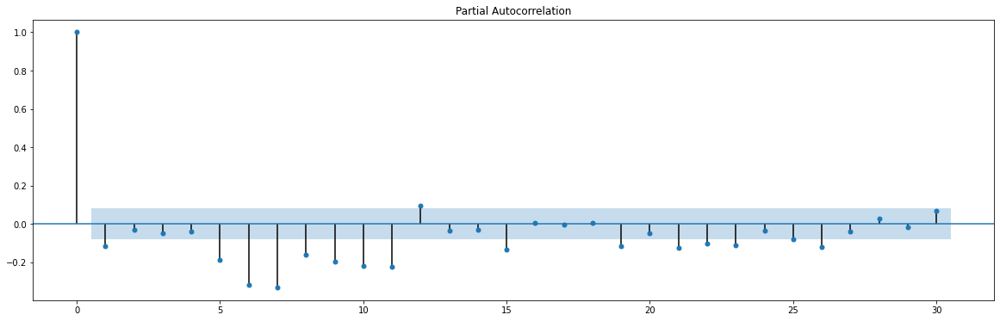

In [278]:
plt.figure(figsize=(20,6))
plot_pacf(train_boxcox_diff['Sales'], ax=plt.gca(), lags = 30)
plt.show()

### 5.3 Building ARIMA model

In [279]:
# Initializing Model
model_arima = ARIMA(train_boxcox_diff["Sales"], order=(11,0,2))
model_arima_fit = model_arima.fit()
print(model_arima_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                              ARMA Model Results                              
Dep. Variable:                  Sales   No. Observations:                  579
Model:                    ARMA(11, 2)   Log Likelihood                 130.748
Method:                       css-mle   S.D. of innovations              0.192
Date:                Mon, 14 Feb 2022   AIC                           -231.495
Time:                        18:51:30   BIC                           -166.076
Sample:                    01-02-2013   HQIC                          -205.988
                         - 08-03-2014                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.0001      0.002      0.088      0.930      -0.003       0.003
ar.L1.Sales     -0.9969      0.117     -8.529      0.000      -1.226      -0.768
ar.L2.Sales     -0.4446      0.157     -2.84

### 5.4 Recover the Orignal Time Serise

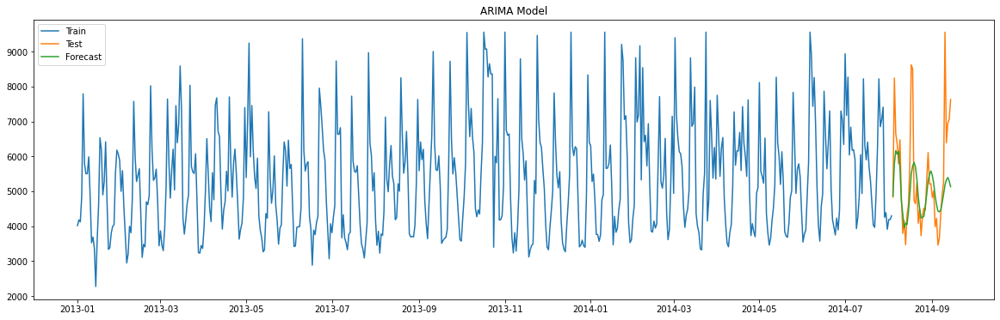

In [280]:
# Recovering
y_hat_arma = store_tsdf[8]['Sales'].copy()
y_hat_arma["arma_forecast_boxcox_diff"] = model_arima_fit.predict(start= test_store[8].index.min(), end=test_store[8].index.max())
y_hat_arma["arma_forecast_boxcox"] = y_hat_arma["arma_forecast_boxcox_diff"].cumsum()
y_hat_arma["arma_forecast_boxcox"] = y_hat_arma["arma_forecast_boxcox"].add(train_boxcox["Sales"][0])
y_hat_arma["arma_forecast"] = np.exp(y_hat_arma["arma_forecast_boxcox"])

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[8]["Sales"], label= "Train")
plt.plot(test_store[8]["Sales"], label= "Test")
plt.plot(y_hat_arma["arma_forecast"], label="Forecast")
plt.legend(loc='best')
plt.title("ARIMA Model")
plt.show()

### 5.5 Calculating RMSE and MAPE

In [281]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[8]["Sales"], y_hat_arma["arma_forecast"][test_store[8].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[8]["Sales"]- y_hat_arma["arma_forecast"][test_store[8].index.min():])/test_store[8]["Sales"])*100,2)


# Adding result
tempResults = pd.DataFrame({'Method':['Store_46_ARIMA '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.6 Creating VAR Model

In [282]:
# Creating VAR Model
model_var = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(11,0), trend='n')
model_var_fit = model_var.fit(maxiter = 1000, disp=False)
print(model_var_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                            VAR(11)   Log Likelihood                1144.234
Date:                    Mon, 14 Feb 2022   AIC                          -2194.468
Time:                            18:52:03   BIC                          -1989.487
Sample:                        01-02-2013   HQIC                         -2114.546
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                56.77, 37.36   Jarque-Bera (JB):          81.75, 8.70
Prob(Q):                        0.04, 0.59   Prob(JB):                   0.00, 0.01
Heteroskedasticity (H):         1.12, 1.35   Skew:                       0.12, 0.27
Prob(H) (two-sided):            0.42, 0.04   Kurtosis:                   4.83, 3.26


### 5.7 Recover the Orignal Time Serise

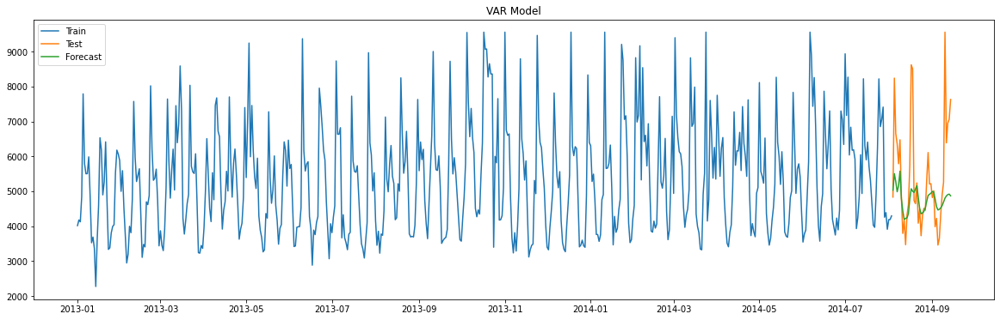

In [283]:
# Recovering
y_hat_var = model_var_fit.predict(start= test_store[8].index.min(), end=test_store[8].index.max())
y_hat_var["Sales"] = y_hat_var["Sales"].cumsum()
y_hat_var["Sales"] = y_hat_var["Sales"].add(train_boxcox["Sales"][0])
y_hat_var = np.exp(y_hat_var)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[8]["Sales"], label= "Train")
plt.plot(test_store[8]["Sales"], label= "Test")
plt.plot(y_hat_var["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VAR Model")
plt.show()

### 5.8 Calculating RMSE and MAPE

In [284]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[8]["Sales"], y_hat_var["Sales"][test_store[8].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[8]["Sales"]- y_hat_var["Sales"][test_store[8].index.min():])/test_store[8]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_46_VAR '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.9 Johansen Co-Integration Test

In [285]:
# Creating variable
johansen_test = coint_johansen(np.asarray(train_boxcox_diff[["Sales", "Customers"]]), det_order= 0, k_ar_diff= 1)

# Trace Value
trace_val = johansen_test.lr1
# Eigen Value
eigen_val = johansen_test.lr2

# Critical Value of Eigen Value
cv_eigen_val = johansen_test.cvm
# Critical Value of Trace Value
cv_trace_val = johansen_test.cvt

In [286]:
# Determining Rank
rank(johansen_test, critical_per = 99)

Rank for Trace is 2
Rank for Eigen is 2


##### Conclusion
- Both are Stationary
- No Cointegration

### 5.10 Creating VARMAX Model (School Holiday)

In [287]:
# Creating VARMAX Model
exog = train_store[8]["SchoolHoliday"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(11,2), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(11,2)   Log Likelihood                1152.916
                              + intercept   AIC                          -2187.832
Date:                    Mon, 14 Feb 2022   BIC                          -1930.515
Time:                            18:58:07   HQIC                         -2087.504
Sample:                        01-02-2013                                         
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                50.02, 39.32   Jarque-Bera (JB):          96.61, 7.16
Prob(Q):                        0.13, 0.50   Prob(JB):                   0.00, 0.03
Heteroskedasticity (H):         1.15, 1.39   Skew:                      -0.02, 0.24
P

### 5.11 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


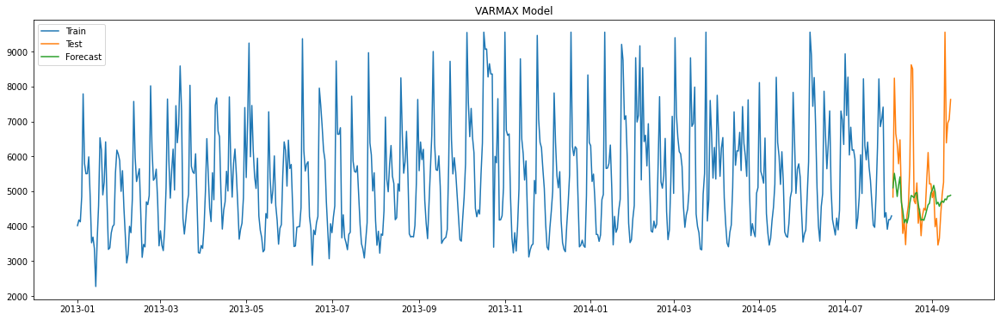

In [288]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[8].index.min(), end=test_store[8].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[8]["Sales"], label= "Train")
plt.plot(test_store[8]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.12 Calculating RMSE and MAPE

In [289]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[8]["Sales"], y_hat_varmax["Sales"][test_store[8].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[8]["Sales"]- y_hat_varmax["Sales"][test_store[8].index.min():])/test_store[8]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_46_VARMAX_School_Holiday '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.13 Response Graph

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

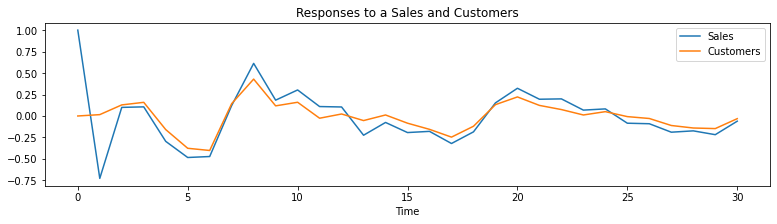

In [290]:
# Plotting Impulse Response
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.14 Creating VARMAX Model (Promotion)


In [291]:
# Creating VARMAX Model
exog = train_store[8]["Promo"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(11,2), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(11,2)   Log Likelihood                 120.166
                              + intercept   AIC                           -122.333
Date:                    Mon, 14 Feb 2022   BIC                            134.984
Time:                            18:58:27   HQIC                           -22.005
Sample:                        01-02-2013                                         
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):              252.08, 354.56   Jarque-Bera (JB):          10.48, 6.23
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.01, 0.04
Heteroskedasticity (H):         0.99, 1.04   Skew:                     -0.33, -0.10
P

### 5.15 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


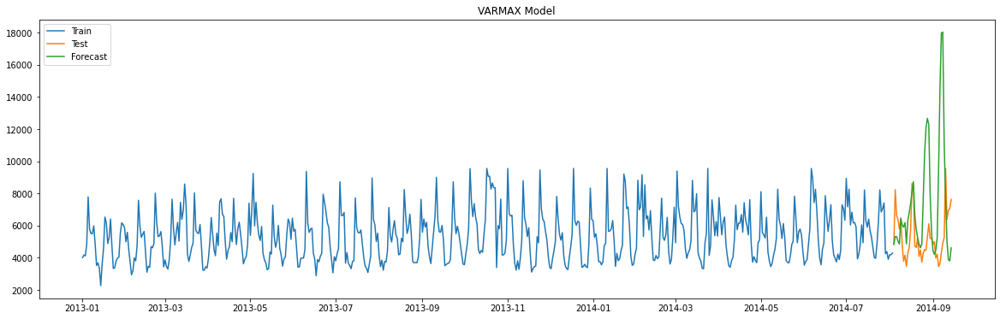

In [292]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[8].index.min(), end=test_store[8].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[8]["Sales"], label= "Train")
plt.plot(test_store[8]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.16 Calculating RMSE and MAPE

In [293]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[8]["Sales"], y_hat_varmax["Sales"][test_store[8].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[8]["Sales"]- y_hat_varmax["Sales"][test_store[8].index.min():])/test_store[8]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_46_VARMAX_Promotion '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.17 Response Graph

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

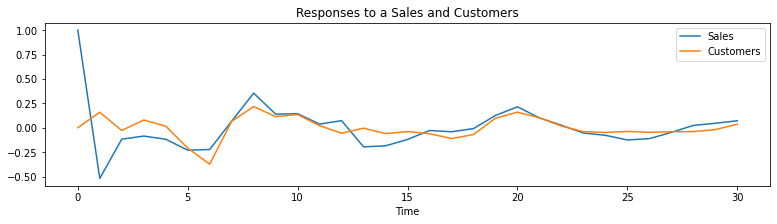

In [294]:
# Plotting Impulse Response
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

### 5.18 Creating VARMAX Model (Day Of Week)


In [295]:
# Creating VARMAX Model
exog = train_store[8]["DayOfWeek"]
model_varmax = sm.tsa.VARMAX(train_boxcox_diff[["Sales", "Customers"]], order=(11,2), exog=exog[1:] )
model_varmax_fit = model_varmax.fit(maxiter = 1000, disp=False)
print(model_varmax_fit.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


                             Statespace Model Results                             
Dep. Variable:     ['Sales', 'Customers']   No. Observations:                  579
Model:                       VARMAX(11,2)   Log Likelihood                1220.978
                              + intercept   AIC                          -2323.956
Date:                    Mon, 14 Feb 2022   BIC                          -2066.640
Time:                            19:04:38   HQIC                         -2223.629
Sample:                        01-02-2013                                         
                             - 08-03-2014                                         
Covariance Type:                      opg                                         
Ljung-Box (Q):                56.07, 26.47   Jarque-Bera (JB):         60.48, 32.97
Prob(Q):                        0.05, 0.95   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.05, 1.51   Skew:                      -0.26, 0.38
P

### 5.19 Recover the Orignal Time Serise

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/varmax.py:159: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  EstimationWarning)


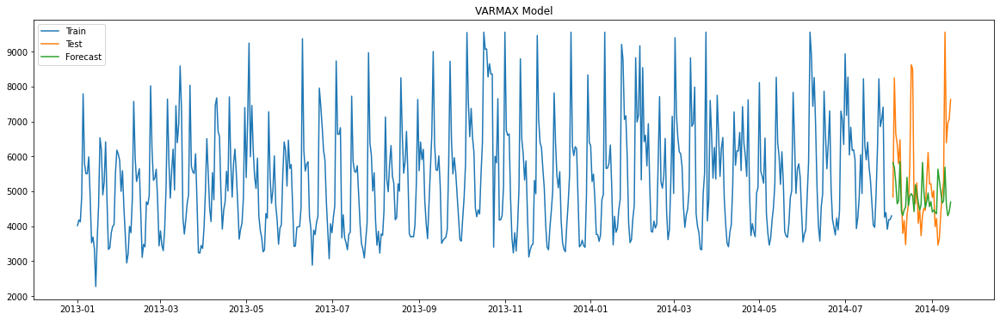

In [296]:
# Recovering
y_hat_varmax = model_varmax_fit.predict(start= test_store[8].index.min(), end=test_store[8].index.max(), 
                                       exog=np.array(exog[-42:]).reshape(42,1))
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].cumsum()
y_hat_varmax["Sales"] = y_hat_varmax["Sales"].add(train_boxcox["Sales"][0])
y_hat_varmax = np.exp(y_hat_varmax)

# Plotting graph
plt.figure(figsize=(20,6))
plt.plot(train_store[8]["Sales"], label= "Train")
plt.plot(test_store[8]["Sales"], label= "Test")
plt.plot(y_hat_varmax["Sales"], label="Forecast")
plt.legend(loc='best')
plt.title("VARMAX Model")
plt.show()

### 5.20 Calculating RMSE and MAPE

In [297]:
# Calculating rmse and mape
rmse = np.sqrt(mean_squared_error(test_store[8]["Sales"], y_hat_varmax["Sales"][test_store[8].index.min():])).round(2)
mape = np.round(np.mean(np.abs(test_store[8]["Sales"]- y_hat_varmax["Sales"][test_store[8].index.min():])/test_store[8]["Sales"])*100,2)

# Adding result
tempResults = pd.DataFrame({'Method':['Store_46_VARMAX_Day_Of_Week '], 'RMSE': [rmse],'MAPE': [mape] })
results = pd.concat([results, tempResults])
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


### 5.21 Response Graph

[Text(0.5, 0, 'Time'), Text(0.5, 1.0, 'Responses to a Sales and Customers')]

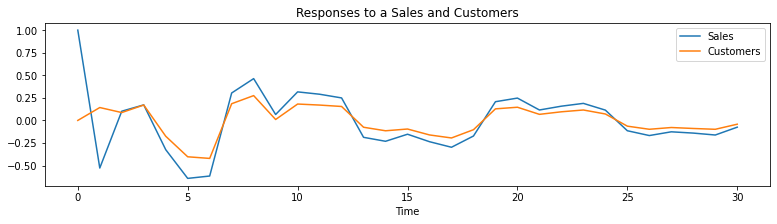

In [298]:
# Plotting Impulse Response
ax = model_varmax_fit.impulse_responses(30, orthogonalized=False).plot(figsize=(13,3))
ax.set(xlabel='Time', title='Responses to a Sales and Customers')

## 6 Evaluate all Store

In [371]:
## 6 Evaluate all Store
results

,Method,RMSE,MAPE
0,Store_1_ARIMA,597.55,11.96
0,Store_1_VAR,756.12,15.42
0,Store_1_VARMAX_School_Holiday,765.13,15.14
0,Store_1_VARMAX_Promotion,1013.21,20.61
0,Store_1_VARMAX_Day_Of_Week,741.10,14.86
0,Store_3_ARIMA,1770.62,19.30
0,Store_3_VAR,1913.85,22.23
0,Store_3_VARMAX_School_Holiday,1886.47,21.45
0,Store_3_VARMAX_Promotion,2727.47,36.30
0,Store_3_VARMAX_Day_Of_Week,2196.49,27.27


In [430]:
# Copying result dataframe 
tf_1 = results.copy()
tf_1.reset_index(inplace=True)

for i,j in enumerate(tf_1["Method"]):
  # print(int(j.split("_")[1]))
  tf_1.loc[i,"Store"] = "Store "+str(int(j.split("_")[1]))
  if str(j.split("_")[2]) == "VARMAX":
    tf_1.loc[i,"TS_Method"] = str(j.split("VARMAX_")[1])
  else:
    tf_1.loc[i,"TS_Method"] = str(j.split("_")[2])
tf_2 = tf_1[["Store", "TS_Method", "RMSE", "MAPE"]]

# Determining best Explanatory Variable
tf_2[(tf_2["TS_Method"]!= "ARIMA ") & (tf_2["TS_Method"]!= "VAR ")].groupby(["Store","TS_Method"])[["MAPE"]].min(1)

MAPE
Store    TS_Method             
Store 1  Day_Of_Week      14.86
         Promotion        20.61
         School_Holiday   15.14
Store 13 Day_Of_Week      29.48
         Promotion        42.82
         School_Holiday   28.84
Store 25 Day_Of_Week      19.57
         Promotion        25.56
         School_Holiday   17.29
Store 29 Day_of_Week      17.43
         Promotion        24.76
         School_Holiday   16.91
         VAR              25.31
Store 3  Day_Of_Week      27.27
         Promotion        36.30
         School_Holiday   21.45
Store 31 Day_Of_Week      15.40
         Promotion        25.54
         School_Holiday   15.14
Store 46 Day_Of_Week      19.80
         Promotion        61.51
         School_Holiday   16.20
Store 8  Day_Of_Week      31.32
         Promotion        34.26
         School_Holiday   20.68
Store 9  Day_Of_Week      19.18
         Promotion        27.32
         School_Holiday   19.24

# Conclusion


It is observed that VARMAX model has performed better than other models for most of the case with few case where ARIMA model supercedes both. The exogenous variable test were 'PROMO, SchoolHoliday','DayOfWeek. Out of which 'SchoolHoliday' has outperformed the other two variables.